In [37]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()

import warnings
warnings.filterwarnings('ignore')

In [38]:
df = pd.read_csv('/content/Ds_Data.csv')

#  Basic Data Inspection
# ✅ Check dataset structure

In [39]:
# Column names, data types, missing values
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12684 entries, 0 to 12683
Data columns (total 25 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   destination           12684 non-null  object
 1   passanger             12684 non-null  object
 2   weather               12684 non-null  object
 3   temperature           12684 non-null  int64 
 4   coupon                12684 non-null  object
 5   expiration            12684 non-null  object
 6   gender                12684 non-null  object
 7   age                   12684 non-null  object
 8   maritalStatus         12684 non-null  object
 9   has_children          12684 non-null  int64 
 10  education             12684 non-null  object
 11  occupation            12684 non-null  object
 12  income                12684 non-null  object
 13  car                   108 non-null    object
 14  Bar                   12577 non-null  object
 15  CoffeeHouse           12467 non-null

In [40]:
# Preview first few rows
df.head()

,destination,passanger,weather,temperature,coupon,expiration,gender,age,maritalStatus,has_children,...,CoffeeHouse,CarryAway,RestaurantLessThan20,Restaurant20To50,toCoupon_GEQ5min,toCoupon_GEQ15min,toCoupon_GEQ25min,direction_same,direction_opp,Accept(Y/N?)
0,No Urgent Place,Alone,Sunny,55,Restaurant(<20),1d,Female,21,Unmarried partner,1,...,never,NaN,4~8,1~3,1,0,0,0,1,1
1,No Urgent Place,Friend(s),Sunny,80,Coffee House,2h,Female,21,Unmarried partner,1,...,never,NaN,4~8,1~3,1,0,0,0,1,0
2,No Urgent Place,Friend(s),Sunny,80,Carry out & Take away,2h,Female,21,Unmarried partner,1,...,never,NaN,4~8,1~3,1,1,0,0,1,1
3,No Urgent Place,Friend(s),Sunny,80,Coffee House,2h,Female,21,Unmarried partner,1,...,never,NaN,4~8,1~3,1,1,0,0,1,0
4,No Urgent Place,Friend(s),Sunny,80,Coffee House,1d,Female,21,Unmarried partner,1,...,never,NaN,4~8,1~3,1,1,0,0,1,0


In [41]:
# Summary statistics for numerical features
df.describe()

,temperature,has_children,toCoupon_GEQ5min,toCoupon_GEQ15min,toCoupon_GEQ25min,direction_same,direction_opp,Accept(Y/N?)
count,12684.000000,12684.000000,12684.0,12684.000000,12684.000000,12684.000000,12684.000000,12684.000000
mean,63.301798,0.414144,1.0,0.561495,0.119126,0.214759,0.785241,0.568433
std,19.154486,0.492593,0.0,0.496224,0.323950,0.410671,0.410671,0.495314
min,30.000000,0.000000,1.0,0.000000,0.000000,0.000000,0.000000,0.000000
25%,55.000000,0.000000,1.0,0.000000,0.000000,0.000000,1.000000,0.000000
50%,80.000000,0.000000,1.0,1.000000,0.000000,0.000000,1.000000,1.000000
75%,80.000000,1.000000,1.0,1.000000,0.000000,0.000000,1.000000,1.000000
max,80.000000,1.000000,1.0,1.000000,1.000000,1.000000,1.000000,1.000000


In [42]:
# Unique values per column
df.nunique()

,0
destination,3
passanger,4
weather,3
temperature,3
coupon,5
expiration,2
gender,2
age,8
maritalStatus,5
has_children,2


In [43]:
# Check All unique Values
for i in df.columns:
    print("*********************************************",i,
         "*********************************************")
    print()
    print(set(df[i].tolist()))
    print()

********************************************* destination *********************************************

{'Work', 'No Urgent Place', 'Home'}

********************************************* passanger *********************************************

{'Friend(s)', 'Kid(s)', 'Partner', 'Alone'}

********************************************* weather *********************************************

{'Rainy', 'Sunny', 'Snowy'}

********************************************* temperature *********************************************

{80, 30, 55}

********************************************* coupon *********************************************

{'Restaurant(20-50)', 'Restaurant(<20)', 'Carry out & Take away', 'Coffee House', 'Bar'}

********************************************* expiration *********************************************

{'2h', '1d'}

********************************************* gender *********************************************

{'Female', 'Male'}

*********************************

# ✅ Check for duplicate row

In [44]:
df.duplicated().sum()  # Count duplicate rows

291

In [45]:
df = df.drop_duplicates() # Dropping duplicates
df.duplicated().sum()

0

# ✅ Check missing values

In [46]:
# Check missing values
missing_values = df.isnull().sum()
missing_values[missing_values > 0]

,0
car,12287
Bar,106
CoffeeHouse,215
CarryAway,148
RestaurantLessThan20,128
Restaurant20To50,188


In [47]:
df.isnull().sum()

,0
destination,0
passanger,0
weather,0
temperature,0
coupon,0
expiration,0
gender,0
age,0
maritalStatus,0
has_children,0


In [48]:
df.isnull().mean() * 100  # Percentage of missing values

,0
destination,0.000000
passanger,0.000000
weather,0.000000
temperature,0.000000
coupon,0.000000
expiration,0.000000
gender,0.000000
age,0.000000
maritalStatus,0.000000
has_children,0.000000


# Data Cleaning
## ✅ Handle missing values

### Drop columns with too many missing values
### Impute missing values using mean/median/mode

In [49]:
# Drop the 'car' column due to excessive missing values
df.drop(columns=['car'], inplace=True)

# Fill missing values in categorical columns with the most frequent value
categorical_cols = ["Bar", "CoffeeHouse", "CarryAway", "RestaurantLessThan20", "Restaurant20To50"]
df[categorical_cols] = df[categorical_cols].apply(lambda x: x.fillna(x.mode()[0]))

# Verify if missing values are handled
df.isnull().sum().sum()

0

#  Univariate Analysis (Single Variable)
## ✅ Distribution of numerical features

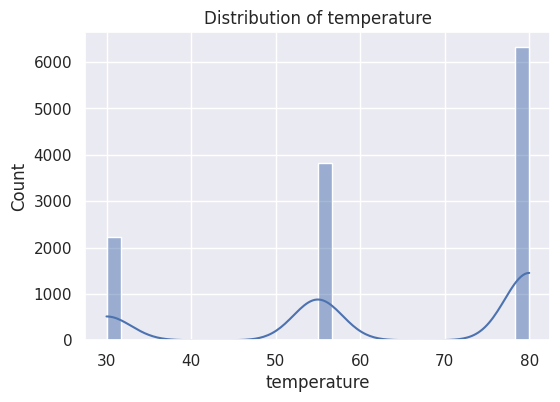

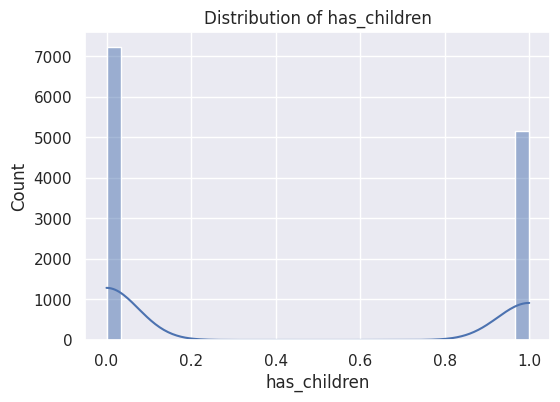

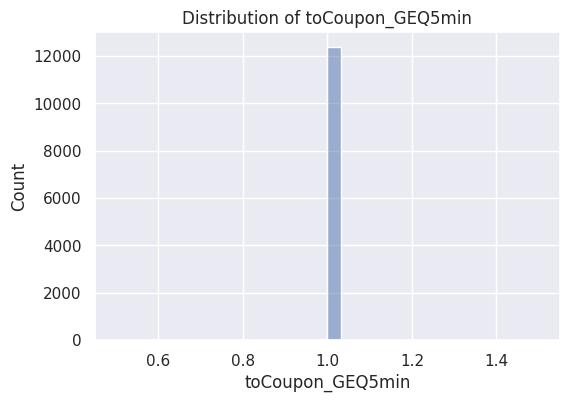

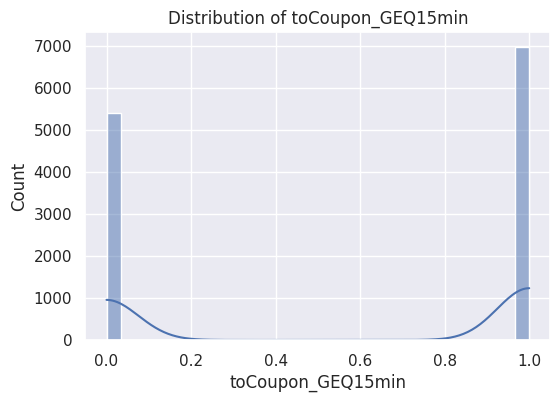

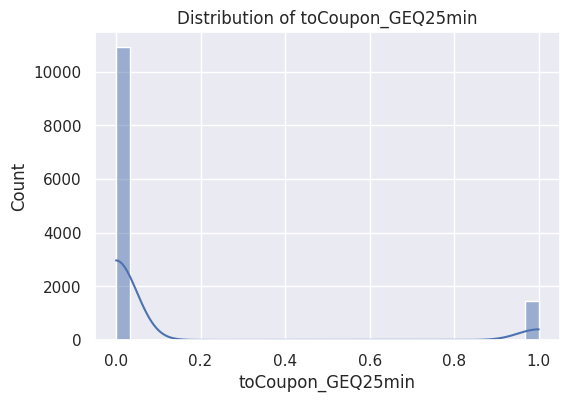

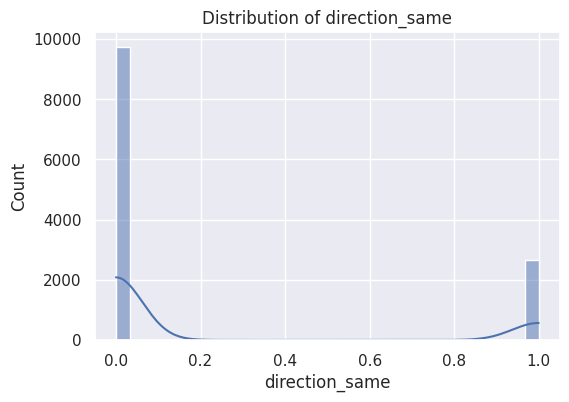

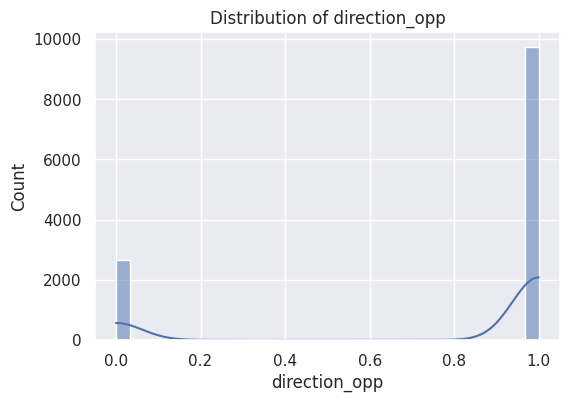

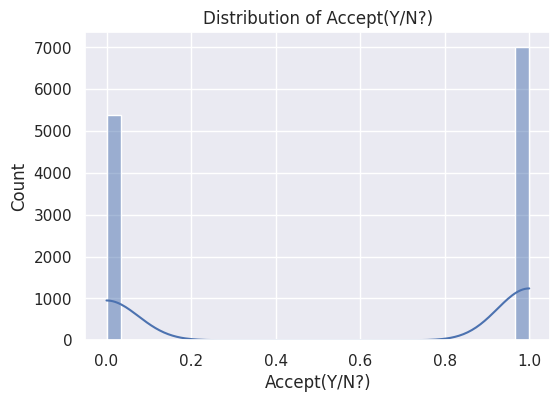

In [50]:
for col in df.select_dtypes(include=["int64", "float64"]).columns:
    plt.figure(figsize=(6, 4))
    sns.histplot(df[col], bins=30, kde=True)
    plt.title(f"Distribution of {col}")
    plt.show()

## ✅ Box plots to check for outliers

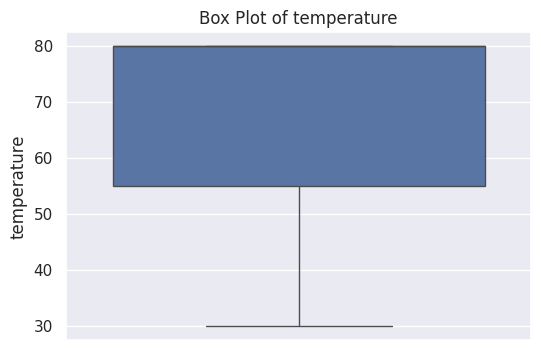

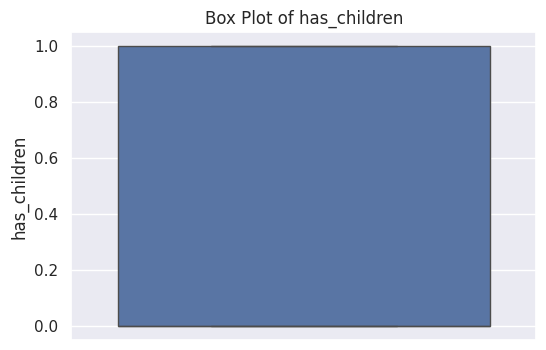

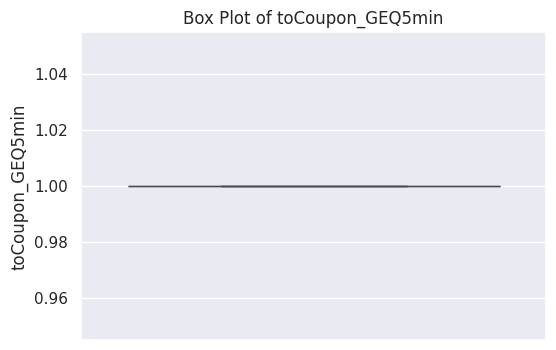

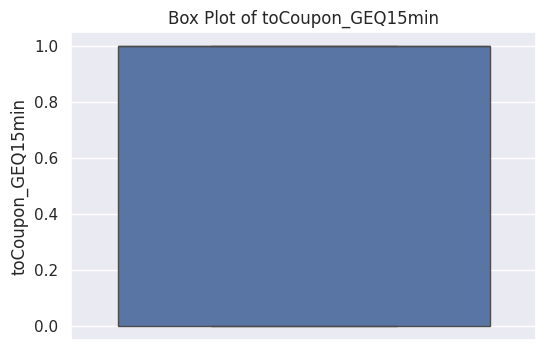

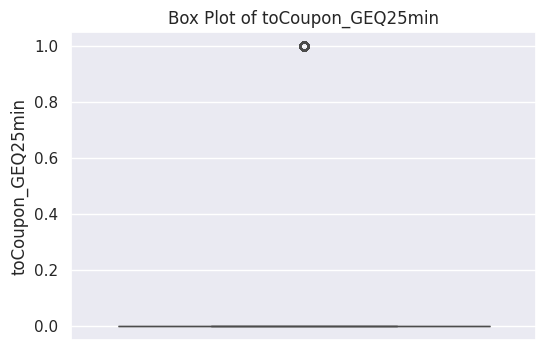

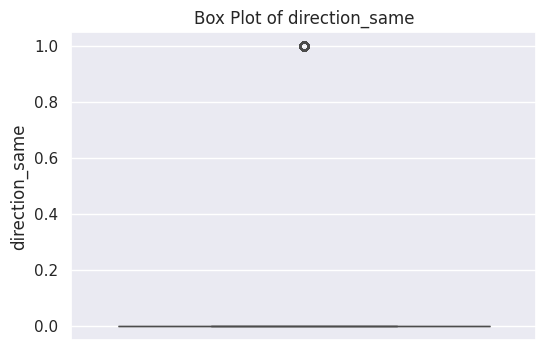

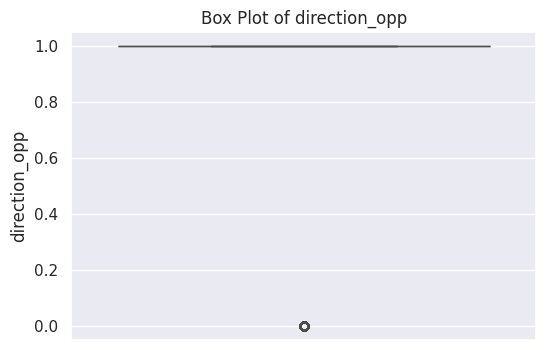

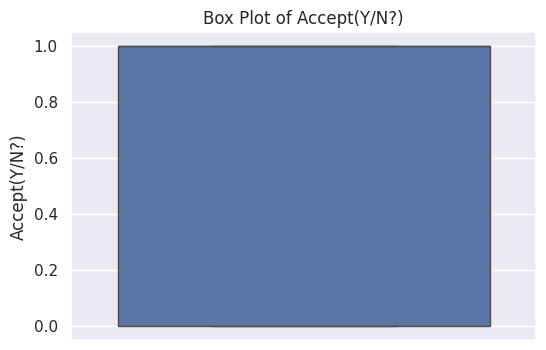

In [51]:
for col in df.select_dtypes(include=["int64", "float64"]).columns:
    plt.figure(figsize=(6, 4))
    sns.boxplot(y=df[col])
    plt.title(f"Box Plot of {col}")
    plt.show()

## ✅ Count plots for categorical features

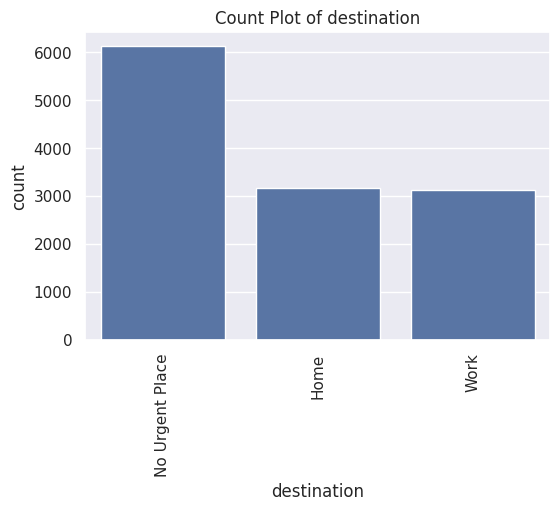

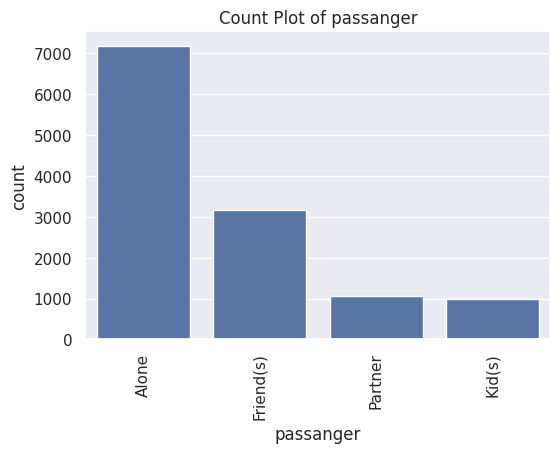

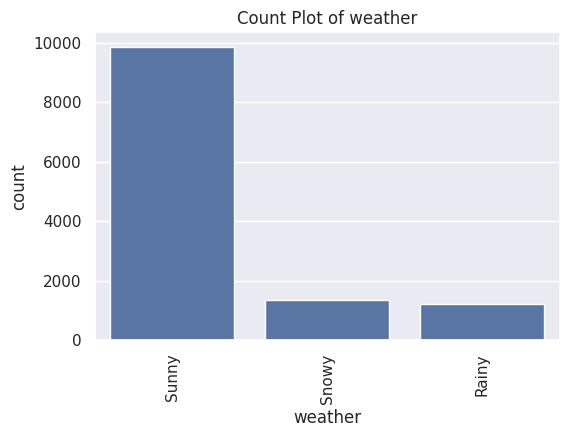

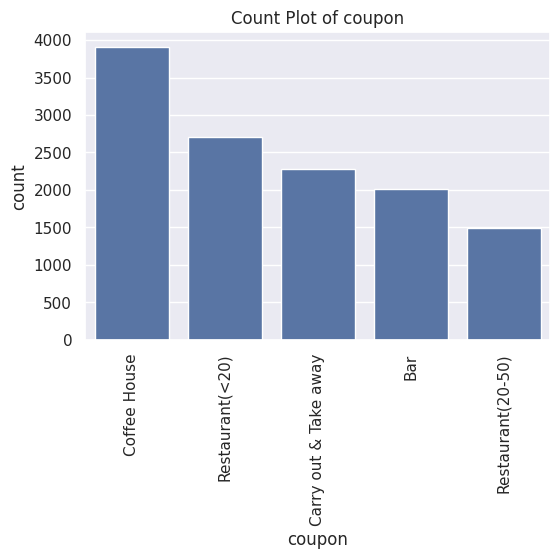

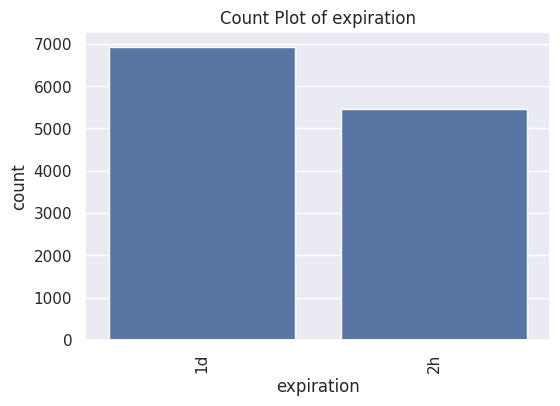

...

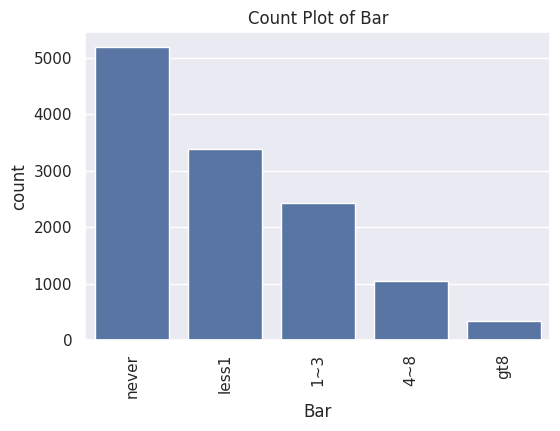

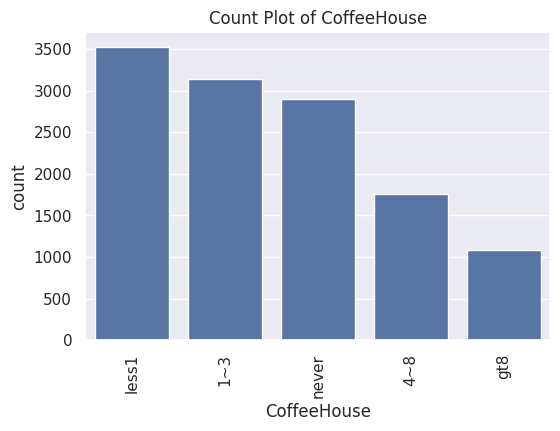

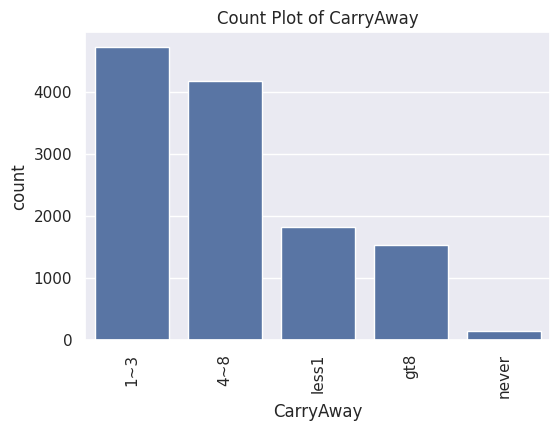

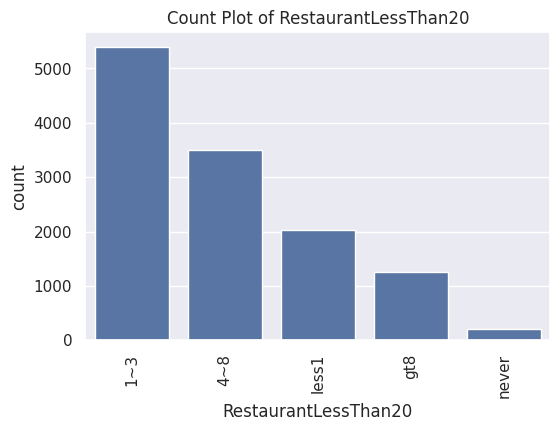

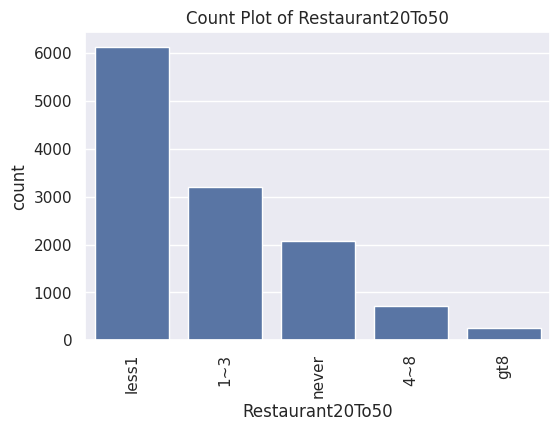

In [52]:
for col in df.select_dtypes(include=["object", "category"]).columns:
    plt.figure(figsize=(6,4))
    sns.countplot(x=df[col], order=df[col].value_counts().index)
    plt.xticks(rotation=90)
    plt.title(f"Count Plot of {col}")
    plt.show()

# Bivariate Analysis (Relationships Between Two Variables)
## ✅ Numerical vs Numerical (Correlation Heatmap)

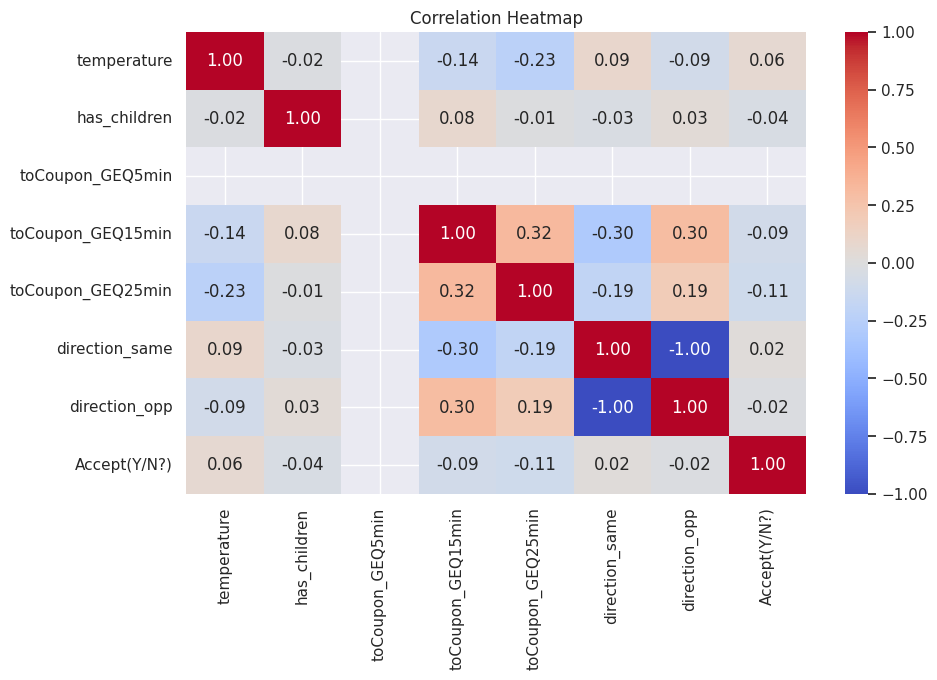

In [53]:
plt.figure(figsize=(10, 6))
sns.heatmap(df.corr(numeric_only=True), annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Correlation Heatmap")
plt.show()
# Interpretation:
# High correlation (close to 1 or -1) suggests strong relationships.
# Drop highly correlated features to avoid multicollinearity.

## ✅ Numerical vs Categorical (Box Plot/Violin Plot)


🔹 **Analyzing temperature vs destination**

📊 **Descriptive Statistics**:
                  count       mean        std   min   25%   50%   75%   max
destination                                                                
Home             3161.0  61.113572  20.544258  30.0  55.0  55.0  80.0  80.0
No Urgent Place  6118.0  66.171952  18.060020  30.0  55.0  80.0  80.0  80.0
Work             3114.0  59.688504  18.574719  30.0  55.0  55.0  80.0  80.0


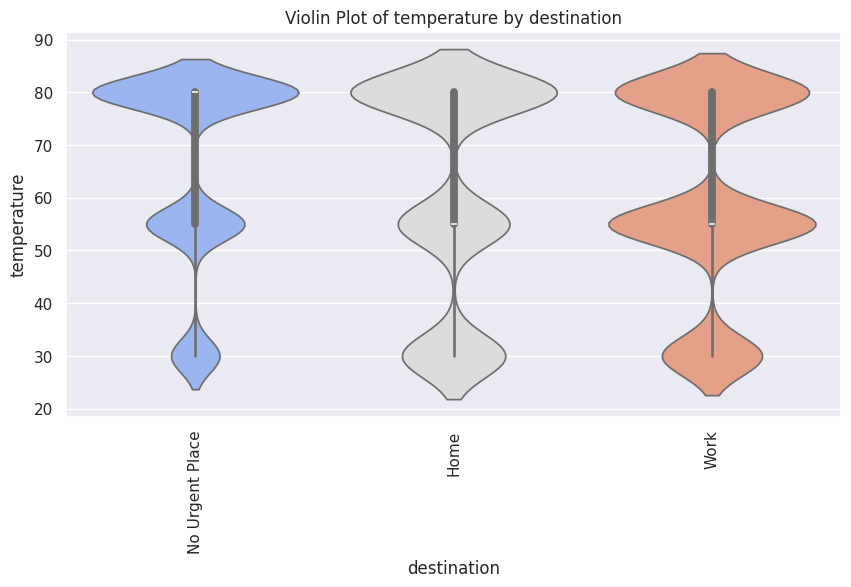


📌 **ANOVA Test:** F-Statistic = 149.3703, P-Value = 0.0000
✅ **Significant Relationship (p < 0.05)!**

🔹 **Analyzing temperature vs passanger**

📊 **Descriptive Statistics**:
            count       mean        std   min   25%   50%   75%   max
passanger                                                            
Alone      7178.0  61.366676  19.006950  30.0  55.0  55.0  80.0  80.0
Friend(s)  3166.0  67.215730  18.446213  30.0  55.0  80.0  80.0  80.0
Kid(s)      981.0  64.658512  17.212970  30.0  55.0  80.0  80.0  80.0
Partner    1068.0  62.888577  21.024905  30.0  55.0  80.0  80.0  80.0


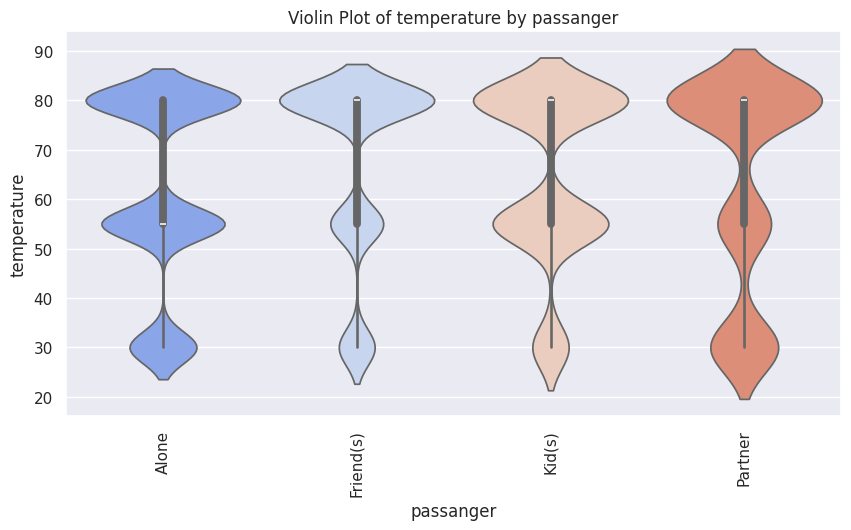


📌 **ANOVA Test:** F-Statistic = 72.0655, P-Value = 0.0000
✅ **Significant Relationship (p < 0.05)!**

🔹 **Analyzing temperature vs weather**

📊 **Descriptive Statistics**:
          count       mean        std   min   25%   50%   75%   max
weather                                                            
Rainy    1202.0  55.000000   0.000000  55.0  55.0  55.0  55.0  55.0
Snowy    1329.0  30.000000   0.000000  30.0  30.0  30.0  30.0  30.0
Sunny    9862.0  68.739607  16.426471  30.0  55.0  80.0  80.0  80.0


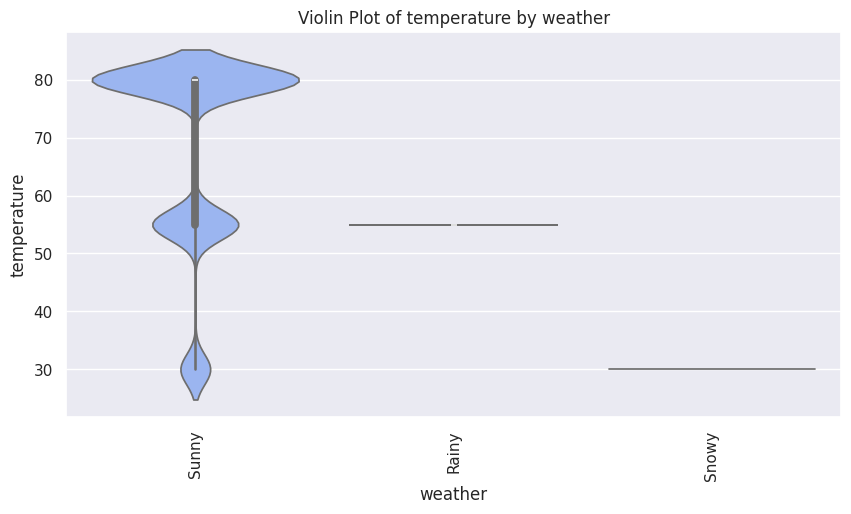


📌 **ANOVA Test:** F-Statistic = 4303.3324, P-Value = 0.0000
✅ **Significant Relationship (p < 0.05)!**

🔹 **Analyzing temperature vs coupon**

📊 **Descriptive Statistics**:
                        count       mean        std   min   25%   50%   75%  \
coupon                                                                        
Bar                    2010.0  57.599502  17.946364  30.0  55.0  55.0  80.0   
Carry out & Take away  2275.0  58.780220  21.295344  30.0  30.0  55.0  80.0   
Coffee House           3913.0  67.809865  16.046333  30.0  55.0  80.0  80.0   
Restaurant(20-50)      1487.0  64.734364  19.386104  30.0  55.0  80.0  80.0   
Restaurant(<20)        2708.0  63.807238  19.880948  30.0  55.0  80.0  80.0   

                        max  
coupon                       
Bar                    80.0  
Carry out & Take away  80.0  
Coffee House           80.0  
Restaurant(20-50)      80.0  
Restaurant(<20)        80.0  


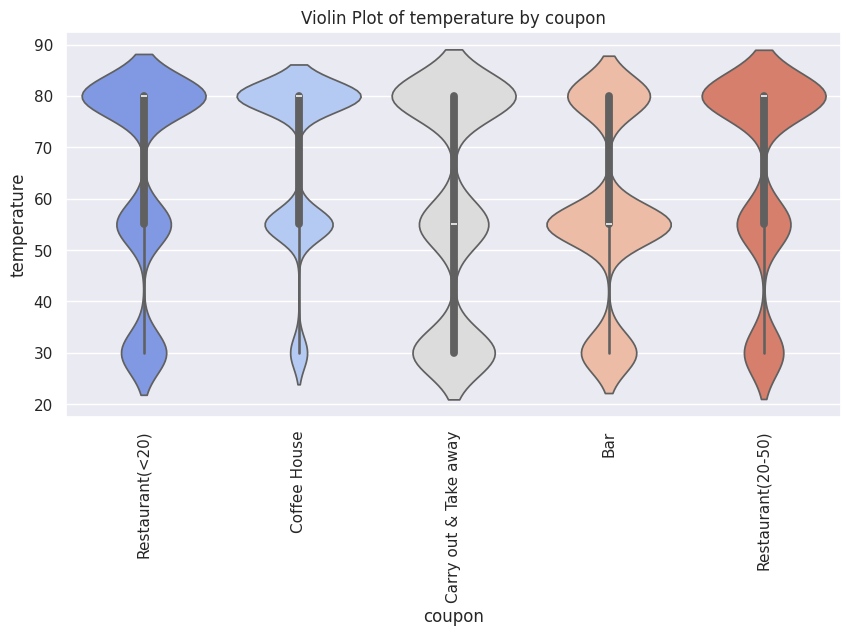


📌 **ANOVA Test:** F-Statistic = 140.0658, P-Value = 0.0000
✅ **Significant Relationship (p < 0.05)!**

🔹 **Analyzing temperature vs expiration**

📊 **Descriptive Statistics**:
             count       mean        std   min   25%   50%   75%   max
expiration                                                            
1d          6938.0  61.327472  19.446996  30.0  55.0  55.0  80.0  80.0
2h          5455.0  65.701192  18.303521  30.0  55.0  80.0  80.0  80.0


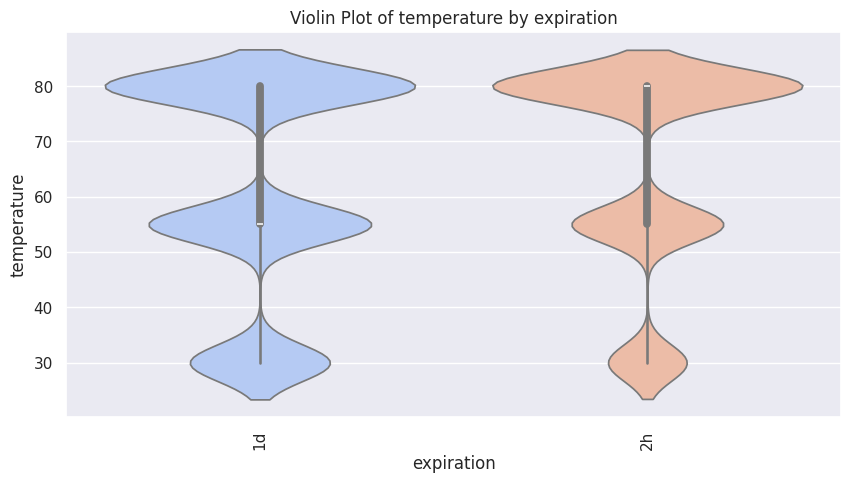


📌 **ANOVA Test:** F-Statistic = 162.6431, P-Value = 0.0000
✅ **Significant Relationship (p < 0.05)!**

🔹 **Analyzing temperature vs gender**

📊 **Descriptive Statistics**:
         count       mean        std   min   25%   50%   75%   max
gender                                                            
Female  6355.0  63.678206  18.901809  30.0  55.0  80.0  80.0  80.0
Male    6038.0  62.804737  19.247810  30.0  55.0  80.0  80.0  80.0


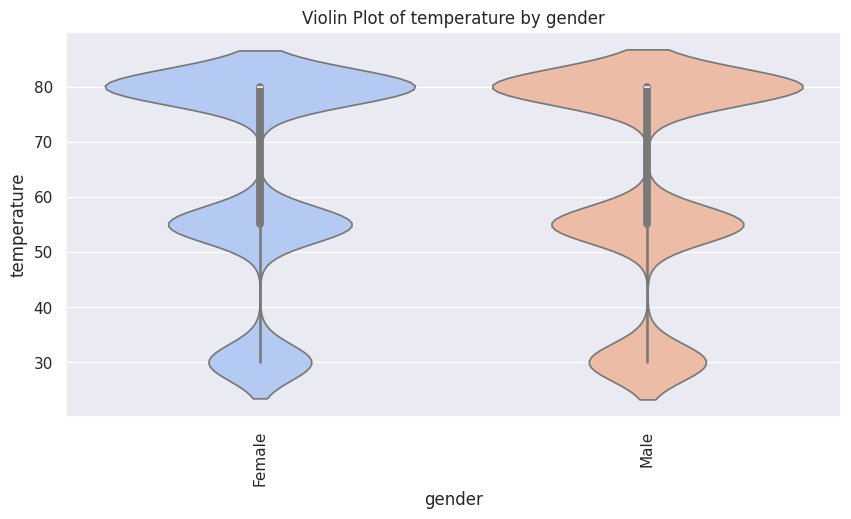


📌 **ANOVA Test:** F-Statistic = 6.4949, P-Value = 0.0108
✅ **Significant Relationship (p < 0.05)!**

🔹 **Analyzing temperature vs age**

📊 **Descriptive Statistics**:
          count       mean        std   min   25%   50%   75%   max
age                                                                
21       2598.0  64.083911  18.635280  30.0  55.0  80.0  80.0  80.0
26       2486.0  63.638375  18.926054  30.0  55.0  80.0  80.0  80.0
31       1984.0  62.762097  19.469952  30.0  55.0  80.0  80.0  80.0
36       1293.0  62.753287  19.432711  30.0  55.0  80.0  80.0  80.0
41       1079.0  63.155700  18.762252  30.0  55.0  55.0  80.0  80.0
46        660.0  63.484848  18.477105  30.0  55.0  67.5  80.0  80.0
50plus   1756.0  62.787585  19.195052  30.0  55.0  55.0  80.0  80.0
below21   537.0  61.890130  20.351689  30.0  55.0  80.0  80.0  80.0


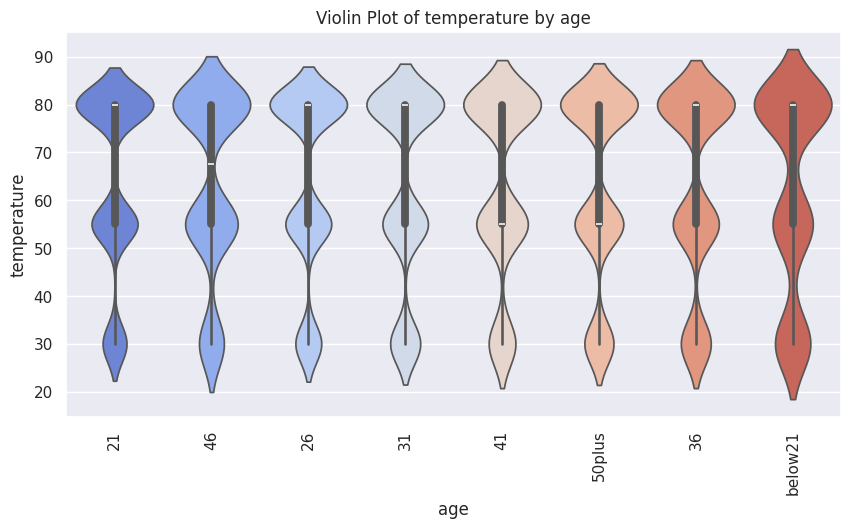


📌 **ANOVA Test:** F-Statistic = 1.7232, P-Value = 0.0986
❌ **No significant difference.**

🔹 **Analyzing temperature vs maritalStatus**

📊 **Descriptive Statistics**:
                    count       mean        std   min   25%   50%   75%   max
maritalStatus                                                                
Divorced            505.0  64.950495  18.331913  30.0  55.0  80.0  80.0  80.0
Married partner    4994.0  62.819383  19.273055  30.0  55.0  80.0  80.0  80.0
Single             4610.0  63.476139  18.679386  30.0  55.0  80.0  80.0  80.0
Unmarried partner  2155.0  63.677494  19.499076  30.0  55.0  80.0  80.0  80.0
Widowed             129.0  58.294574  20.102240  30.0  30.0  55.0  80.0  80.0


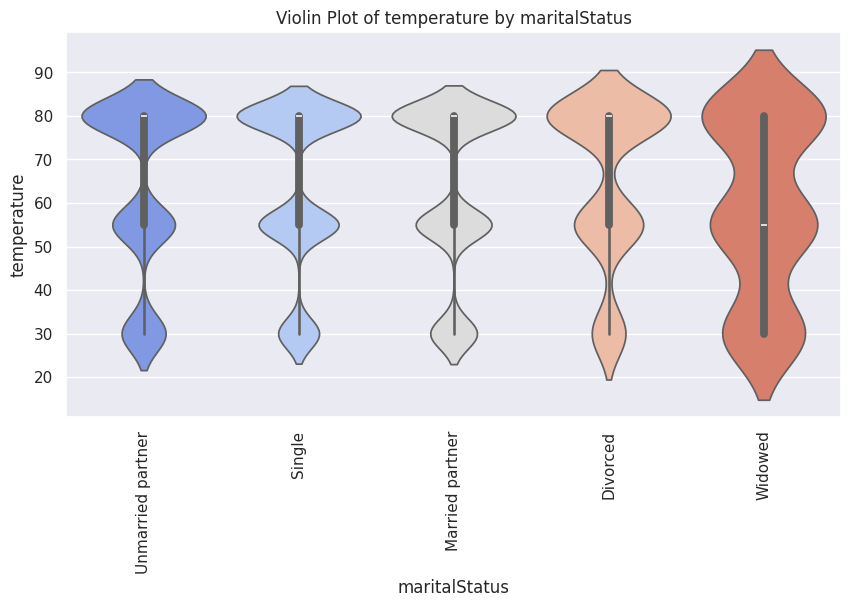


📌 **ANOVA Test:** F-Statistic = 4.2529, P-Value = 0.0019
✅ **Significant Relationship (p < 0.05)!**

🔹 **Analyzing temperature vs education**

📊 **Descriptive Statistics**:
                                         count       mean        std   min  \
education                                                                    
Associates degree                       1126.0  61.349911  19.851630  30.0   
Bachelors degree                        4247.0  63.182246  19.040929  30.0   
Graduate degree (Masters or Doctorate)  1793.0  64.369771  18.917966  30.0   
High School Graduate                     880.0  63.380682  19.044809  30.0   
Some High School                          87.0  60.747126  20.424688  30.0   
Some college - no degree                4260.0  63.380282  18.912211  30.0   

                                         25%   50%   75%   max  
education                                                       
Associates degree                       55.0  55.0  80.0  80.0  
Bachel

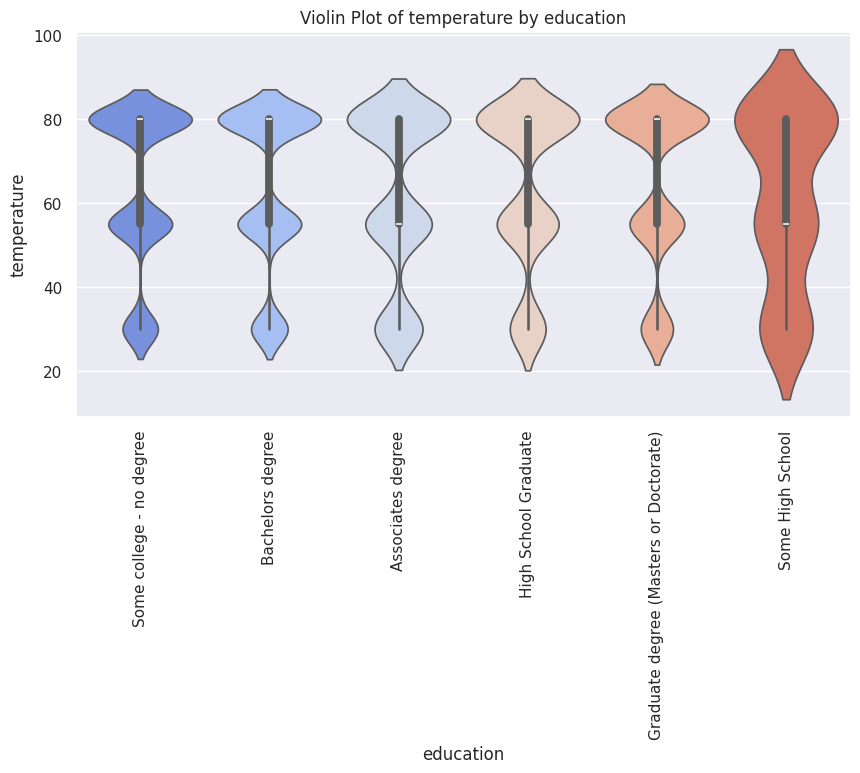


📌 **ANOVA Test:** F-Statistic = 3.8328, P-Value = 0.0018
✅ **Significant Relationship (p < 0.05)!**

🔹 **Analyzing temperature vs occupation**

📊 **Descriptive Statistics**:
                                            count       mean        std   min  \
occupation                                                                      
Architecture & Engineering                  172.0  66.046512  16.492357  30.0   
Arts Design Entertainment Sports & Media    617.0  64.481361  17.884643  30.0   
Building & Grounds Cleaning & Maintenance    42.0  52.023810  21.528753  30.0   
Business & Financial                        536.0  59.430970  20.167590  30.0   
Community & Social Services                 236.0  65.487288  18.699068  30.0   
Computer & Mathematical                    1360.0  63.547794  19.181310  30.0   
Construction & Extraction                   150.0  59.666667  19.726882  30.0   
Education&Training&Library                  921.0  64.174810  18.974321  30.0   
Farming Fishing

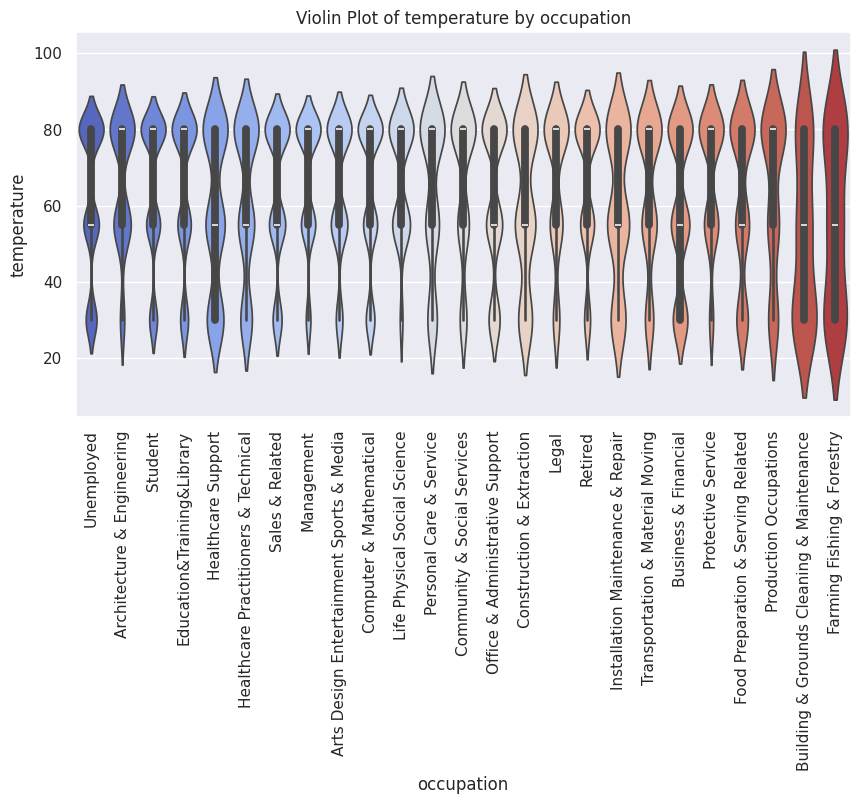


📌 **ANOVA Test:** F-Statistic = 6.4241, P-Value = 0.0000
✅ **Significant Relationship (p < 0.05)!**

🔹 **Analyzing temperature vs income**

📊 **Descriptive Statistics**:
                   count       mean        std   min   25%   50%   75%   max
income                                                                      
$100000 or More   1688.0  62.671801  19.161439  30.0  55.0  55.0  80.0  80.0
$12500 - $24999   1795.0  63.509749  18.693213  30.0  55.0  80.0  80.0  80.0
$25000 - $37499   1972.0  64.241886  18.552948  30.0  55.0  80.0  80.0  80.0
$37500 - $49999   1760.0  64.176136  19.008322  30.0  55.0  80.0  80.0  80.0
$50000 - $62499   1624.0  64.159483  18.460924  30.0  55.0  80.0  80.0  80.0
$62500 - $74999    832.0  63.473558  19.048087  30.0  55.0  80.0  80.0  80.0
$75000 - $87499    844.0  59.917062  20.181390  30.0  55.0  55.0  80.0  80.0
$87500 - $99999    865.0  62.312139  19.561919  30.0  55.0  55.0  80.0  80.0
Less than $12500  1013.0  62.181639  19.964855  30.0  55.0 

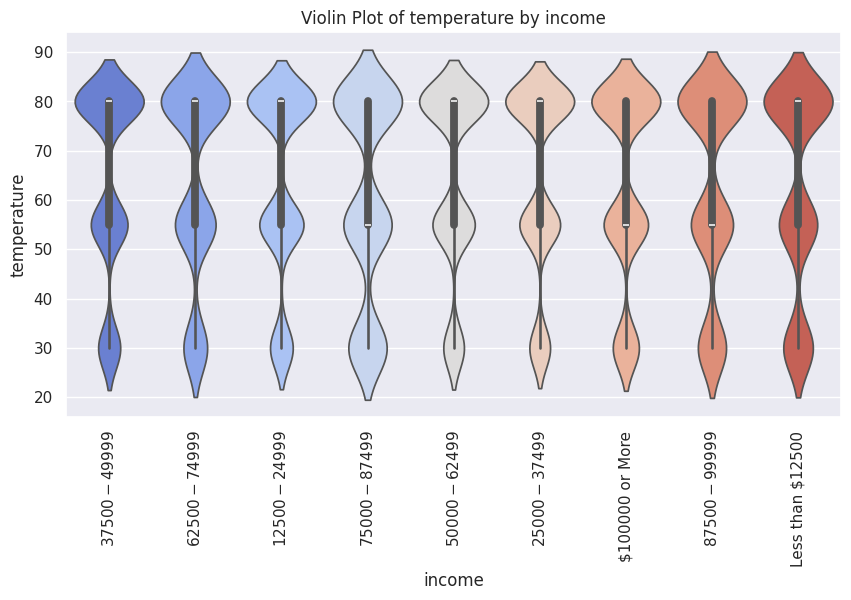


📌 **ANOVA Test:** F-Statistic = 5.7935, P-Value = 0.0000
✅ **Significant Relationship (p < 0.05)!**

🔹 **Analyzing temperature vs Bar**

📊 **Descriptive Statistics**:
        count       mean        std   min   25%   50%   75%   max
Bar                                                              
1~3    2432.0  62.627467  19.371665  30.0  55.0  55.0  80.0  80.0
4~8    1045.0  64.234450  18.463165  30.0  55.0  80.0  80.0  80.0
gt8     338.0  62.174556  18.730218  30.0  55.0  55.0  80.0  80.0
less1  3383.0  63.476205  19.138913  30.0  55.0  80.0  80.0  80.0
never  5195.0  63.272377  19.032073  30.0  55.0  80.0  80.0  80.0


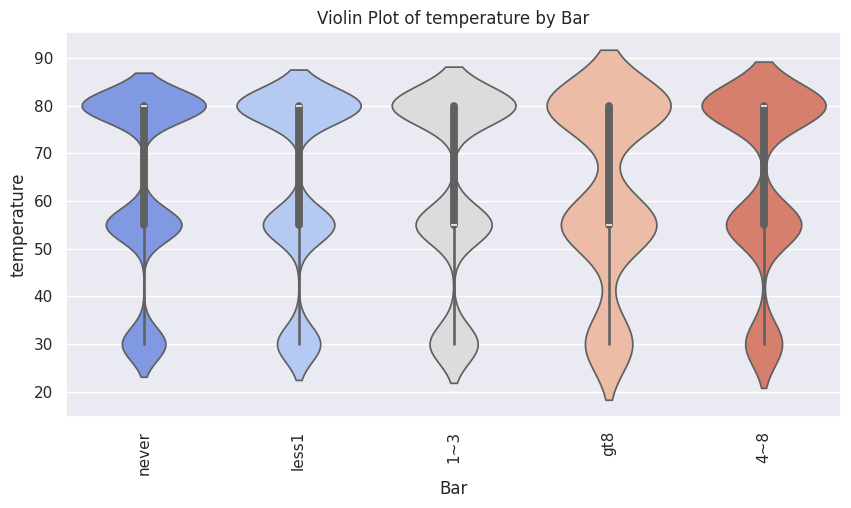


📌 **ANOVA Test:** F-Statistic = 1.7330, P-Value = 0.1396
❌ **No significant difference.**

🔹 **Analyzing temperature vs CoffeeHouse**

📊 **Descriptive Statistics**:
              count       mean        std   min   25%   50%   75%   max
CoffeeHouse                                                            
1~3          3138.0  63.604207  18.769837  30.0  55.0  80.0  80.0  80.0
4~8          1752.0  61.863584  19.569764  30.0  55.0  55.0  80.0  80.0
gt8          1083.0  63.125577  19.160884  30.0  55.0  80.0  80.0  80.0
less1        3525.0  63.375887  19.064582  30.0  55.0  80.0  80.0  80.0
never        2895.0  63.609672  19.057155  30.0  55.0  80.0  80.0  80.0


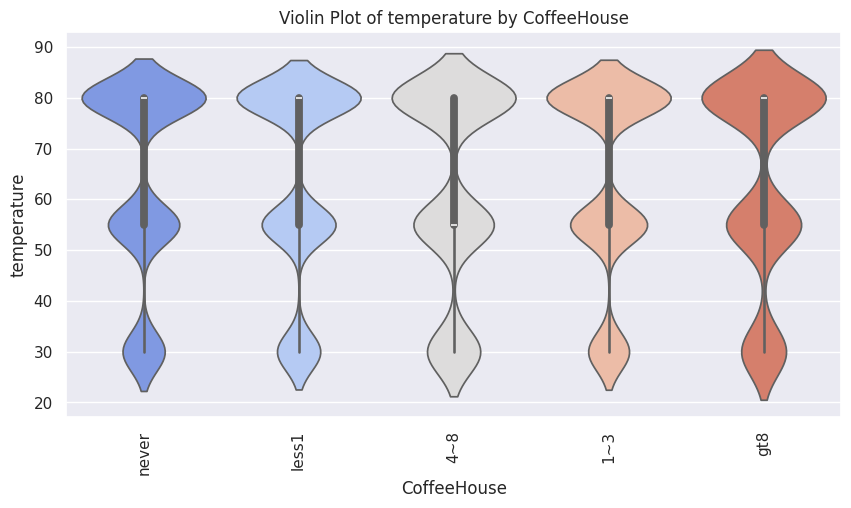


📌 **ANOVA Test:** F-Statistic = 2.8931, P-Value = 0.0209
✅ **Significant Relationship (p < 0.05)!**

🔹 **Analyzing temperature vs CarryAway**

📊 **Descriptive Statistics**:
            count       mean        std   min   25%   50%   75%   max
CarryAway                                                            
1~3        4719.0  63.587624  18.863769  30.0  55.0  80.0  80.0  80.0
4~8        4171.0  63.948693  18.889208  30.0  55.0  80.0  80.0  80.0
gt8        1535.0  61.921824  19.332583  30.0  55.0  55.0  80.0  80.0
less1      1819.0  62.078065  19.597783  30.0  55.0  55.0  80.0  80.0
never       149.0  61.208054  20.530556  30.0  55.0  55.0  80.0  80.0


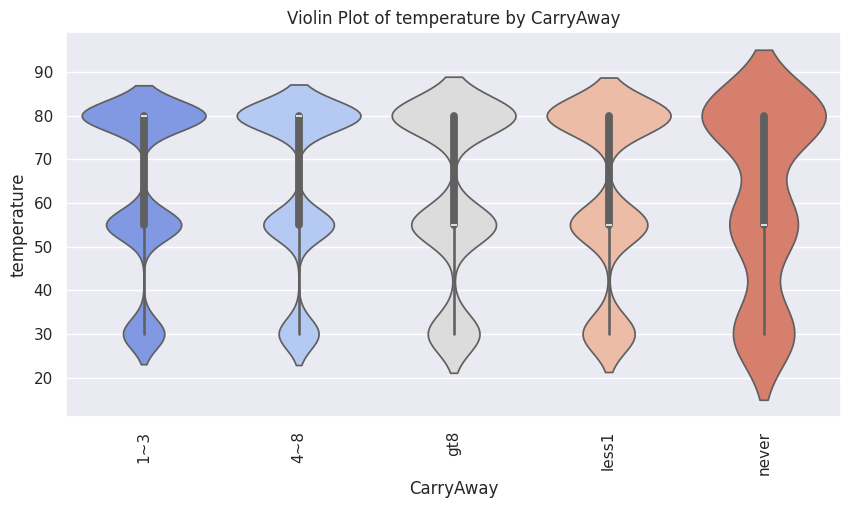


📌 **ANOVA Test:** F-Statistic = 5.7811, P-Value = 0.0001
✅ **Significant Relationship (p < 0.05)!**

🔹 **Analyzing temperature vs RestaurantLessThan20**

📊 **Descriptive Statistics**:
                       count       mean        std   min   25%   50%   75%  \
RestaurantLessThan20                                                         
1~3                   5397.0  62.985918  19.165586  30.0  55.0  80.0  80.0   
4~8                   3493.0  63.445462  19.067680  30.0  55.0  80.0  80.0   
gt8                   1253.0  65.115722  18.149367  30.0  55.0  80.0  80.0   
less1                 2034.0  62.952311  19.136504  30.0  55.0  80.0  80.0   
never                  216.0  58.819444  20.598482  30.0  30.0  55.0  80.0   

                       max  
RestaurantLessThan20        
1~3                   80.0  
4~8                   80.0  
gt8                   80.0  
less1                 80.0  
never                 80.0  


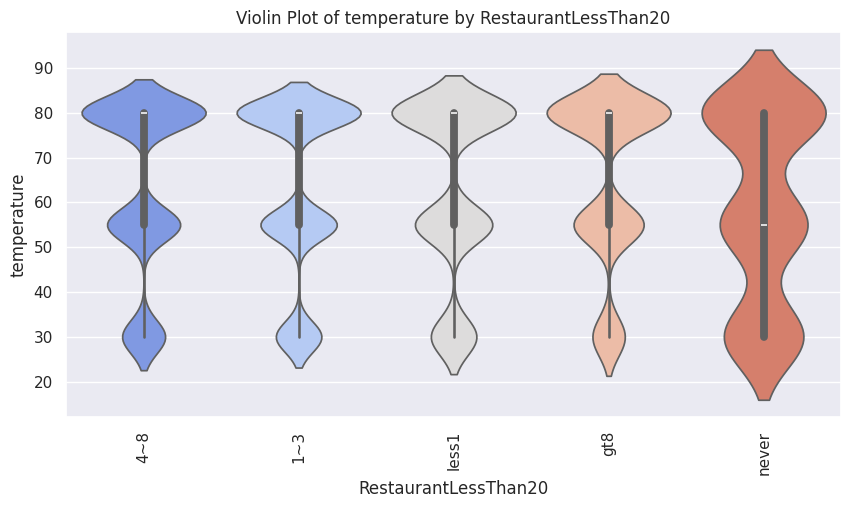


📌 **ANOVA Test:** F-Statistic = 6.3950, P-Value = 0.0000
✅ **Significant Relationship (p < 0.05)!**

🔹 **Analyzing temperature vs Restaurant20To50**

📊 **Descriptive Statistics**:
                   count       mean        std   min   25%   50%   75%   max
Restaurant20To50                                                            
1~3               3204.0  64.098002  18.729079  30.0  55.0  80.0  80.0  80.0
4~8                718.0  60.188022  20.499332  30.0  30.0  55.0  80.0  80.0
gt8                254.0  63.267717  18.611675  30.0  55.0  55.0  80.0  80.0
less1             6134.0  62.597000  19.269345  30.0  55.0  55.0  80.0  80.0
never             2083.0  64.937590  18.359625  30.0  55.0  80.0  80.0  80.0


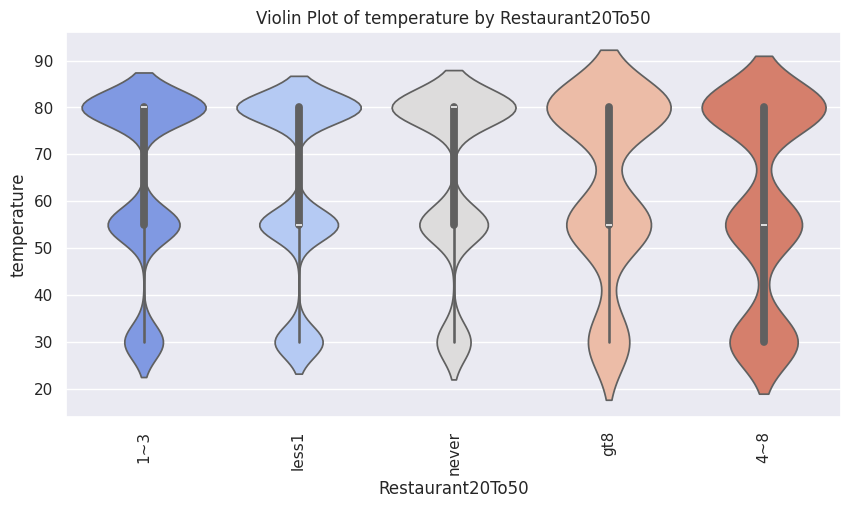


📌 **ANOVA Test:** F-Statistic = 12.1244, P-Value = 0.0000
✅ **Significant Relationship (p < 0.05)!**

🔹 **Analyzing has_children vs destination**

📊 **Descriptive Statistics**:
                  count      mean       std  min  25%  50%  75%  max
destination                                                         
Home             3161.0  0.408415  0.491618  0.0  0.0  0.0  1.0  1.0
No Urgent Place  6118.0  0.427264  0.494722  0.0  0.0  0.0  1.0  1.0
Work             3114.0  0.399807  0.489937  0.0  0.0  0.0  1.0  1.0


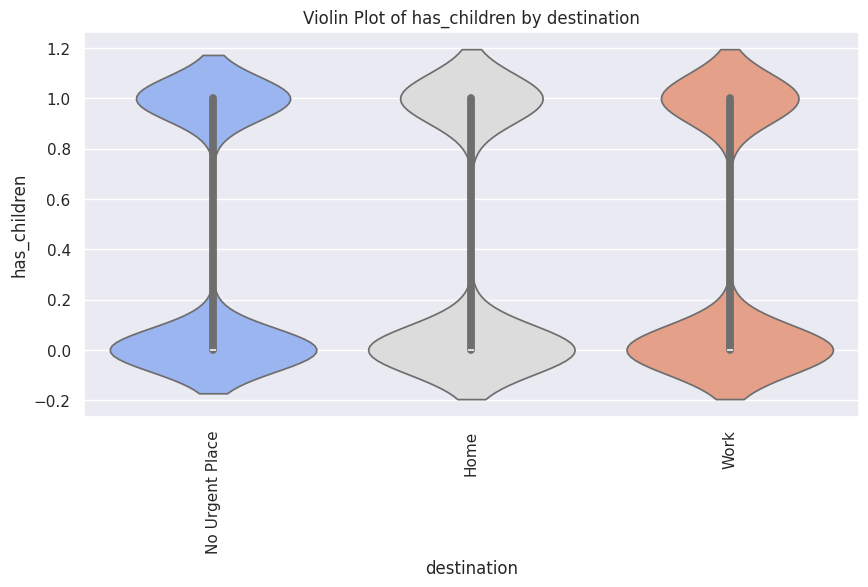


📌 **ANOVA Test:** F-Statistic = 3.6496, P-Value = 0.0260
✅ **Significant Relationship (p < 0.05)!**

🔹 **Analyzing has_children vs passanger**

📊 **Descriptive Statistics**:
            count      mean       std  min  25%  50%  75%  max
passanger                                                     
Alone      7178.0  0.392031  0.488238  0.0  0.0  0.0  1.0  1.0
Friend(s)  3166.0  0.377764  0.484905  0.0  0.0  0.0  1.0  1.0
Kid(s)      981.0  0.983690  0.126729  0.0  1.0  1.0  1.0  1.0
Partner    1068.0  0.163858  0.370320  0.0  0.0  0.0  0.0  1.0


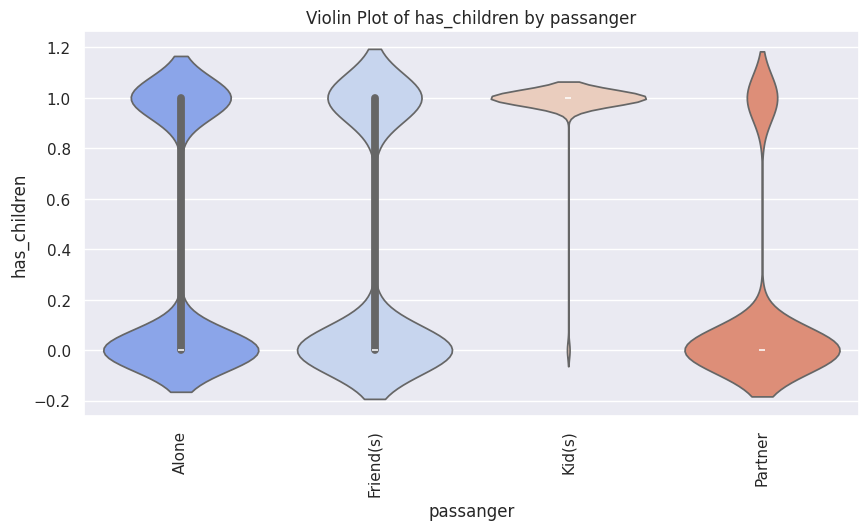


📌 **ANOVA Test:** F-Statistic = 619.8216, P-Value = 0.0000
✅ **Significant Relationship (p < 0.05)!**

🔹 **Analyzing has_children vs weather**

📊 **Descriptive Statistics**:
          count      mean       std  min  25%  50%  75%  max
weather                                                     
Rainy    1202.0  0.391015  0.488181  0.0  0.0  0.0  1.0  1.0
Snowy    1329.0  0.416855  0.493224  0.0  0.0  0.0  1.0  1.0
Sunny    9862.0  0.418374  0.493317  0.0  0.0  0.0  1.0  1.0


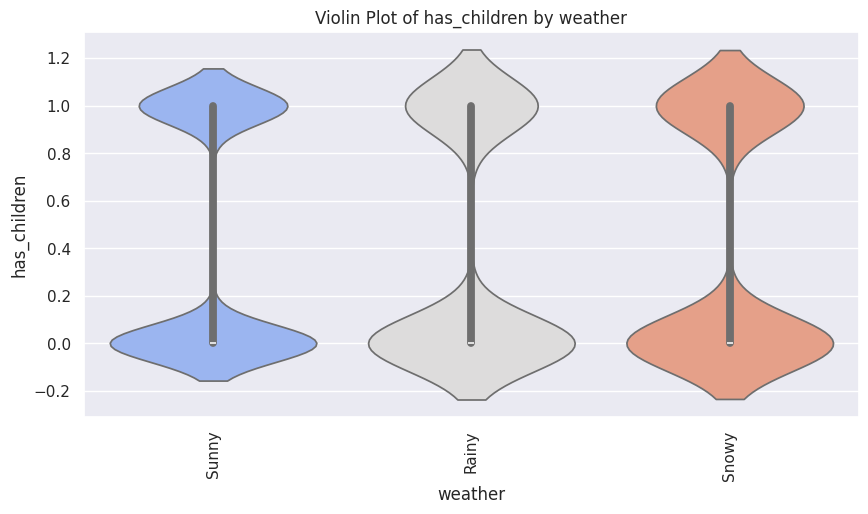


📌 **ANOVA Test:** F-Statistic = 1.6562, P-Value = 0.1909
❌ **No significant difference.**

🔹 **Analyzing has_children vs coupon**

📊 **Descriptive Statistics**:
                        count      mean       std  min  25%  50%  75%  max
coupon                                                                    
Bar                    2010.0  0.433333  0.495659  0.0  0.0  0.0  1.0  1.0
Carry out & Take away  2275.0  0.432088  0.495475  0.0  0.0  0.0  1.0  1.0
Coffee House           3913.0  0.388960  0.487577  0.0  0.0  0.0  1.0  1.0
Restaurant(20-50)      1487.0  0.437122  0.496197  0.0  0.0  0.0  1.0  1.0
Restaurant(<20)        2708.0  0.415066  0.492824  0.0  0.0  0.0  1.0  1.0


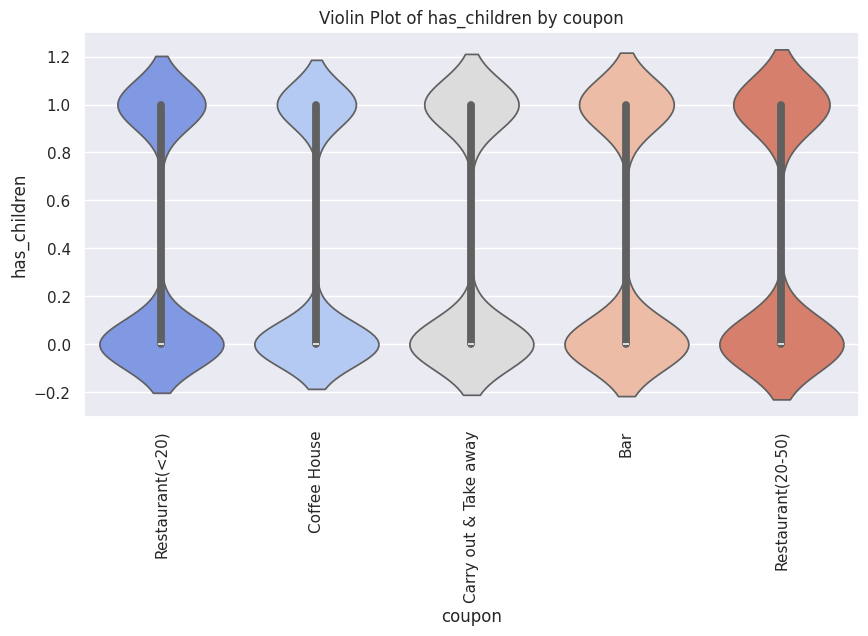


📌 **ANOVA Test:** F-Statistic = 4.8612, P-Value = 0.0006
✅ **Significant Relationship (p < 0.05)!**

🔹 **Analyzing has_children vs expiration**

📊 **Descriptive Statistics**:
             count      mean       std  min  25%  50%  75%  max
expiration                                                     
1d          6938.0  0.406457  0.491207  0.0  0.0  0.0  1.0  1.0
2h          5455.0  0.427131  0.494707  0.0  0.0  0.0  1.0  1.0


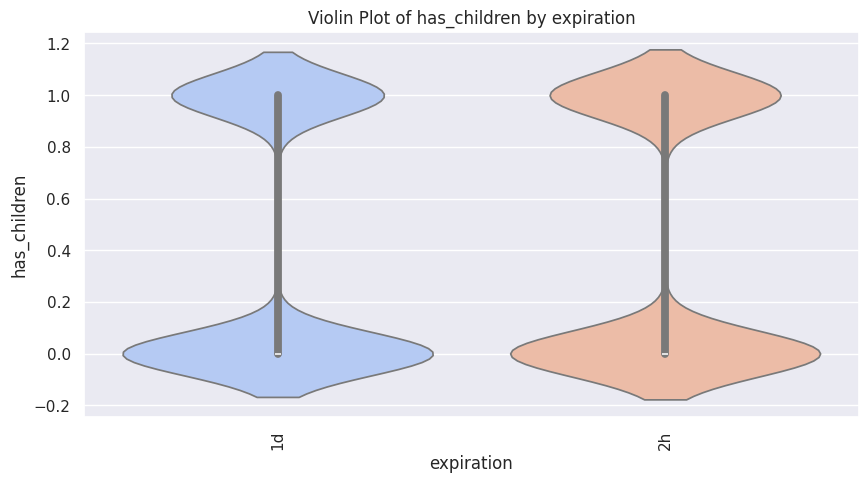


📌 **ANOVA Test:** F-Statistic = 5.3758, P-Value = 0.0204
✅ **Significant Relationship (p < 0.05)!**

🔹 **Analyzing has_children vs gender**

📊 **Descriptive Statistics**:
         count      mean       std  min  25%  50%  75%  max
gender                                                     
Female  6355.0  0.493627  0.499999  0.0  0.0  0.0  1.0  1.0
Male    6038.0  0.333389  0.471463  0.0  0.0  0.0  1.0  1.0


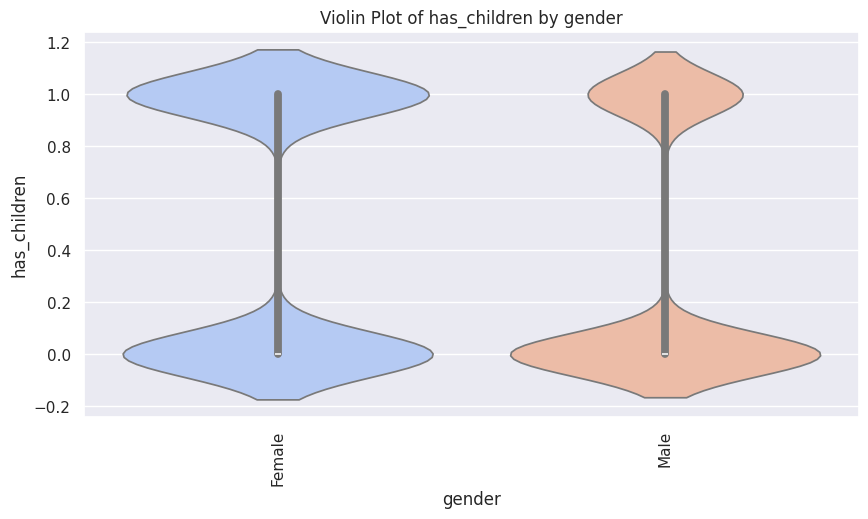


📌 **ANOVA Test:** F-Statistic = 336.1618, P-Value = 0.0000
✅ **Significant Relationship (p < 0.05)!**

🔹 **Analyzing has_children vs age**

📊 **Descriptive Statistics**:
          count      mean       std  min  25%  50%  75%  max
age                                                         
21       2598.0  0.139723  0.346766  0.0  0.0  0.0  0.0  1.0
26       2486.0  0.226468  0.418630  0.0  0.0  0.0  0.0  1.0
31       1984.0  0.489919  0.500024  0.0  0.0  0.0  1.0  1.0
36       1293.0  0.617169  0.486266  0.0  0.0  1.0  1.0  1.0
41       1079.0  0.801668  0.398928  0.0  1.0  1.0  1.0  1.0
46        660.0  0.550000  0.497871  0.0  0.0  1.0  1.0  1.0
50plus   1756.0  0.685649  0.464389  0.0  0.0  1.0  1.0  1.0
below21   537.0  0.040968  0.198402  0.0  0.0  0.0  0.0  1.0


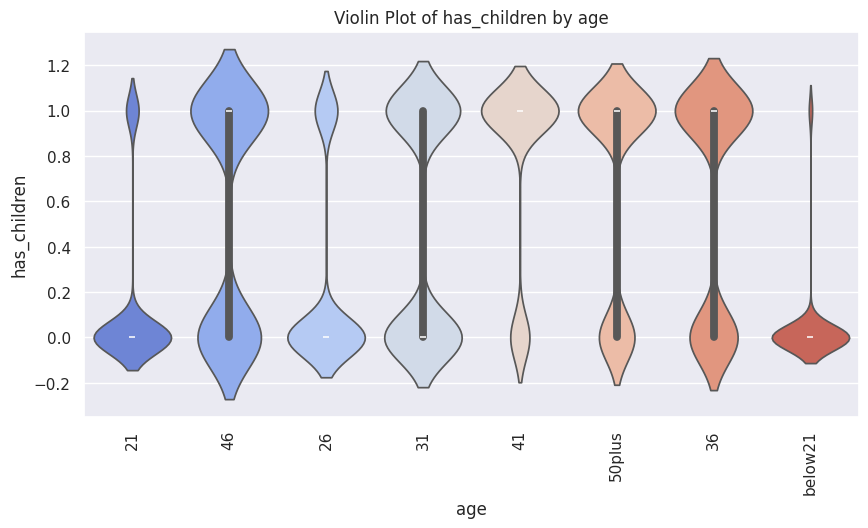


📌 **ANOVA Test:** F-Statistic = 562.7476, P-Value = 0.0000
✅ **Significant Relationship (p < 0.05)!**

🔹 **Analyzing has_children vs maritalStatus**

📊 **Descriptive Statistics**:
                    count      mean       std  min  25%  50%  75%  max
maritalStatus                                                         
Divorced            505.0  0.914851  0.279379  0.0  1.0  1.0  1.0  1.0
Married partner    4994.0  0.699439  0.458548  0.0  0.0  1.0  1.0  1.0
Single             4610.0  0.124512  0.330200  0.0  0.0  0.0  0.0  1.0
Unmarried partner  2155.0  0.248260  0.432104  0.0  0.0  0.0  0.0  1.0
Widowed             129.0  0.666667  0.473242  0.0  0.0  1.0  1.0  1.0


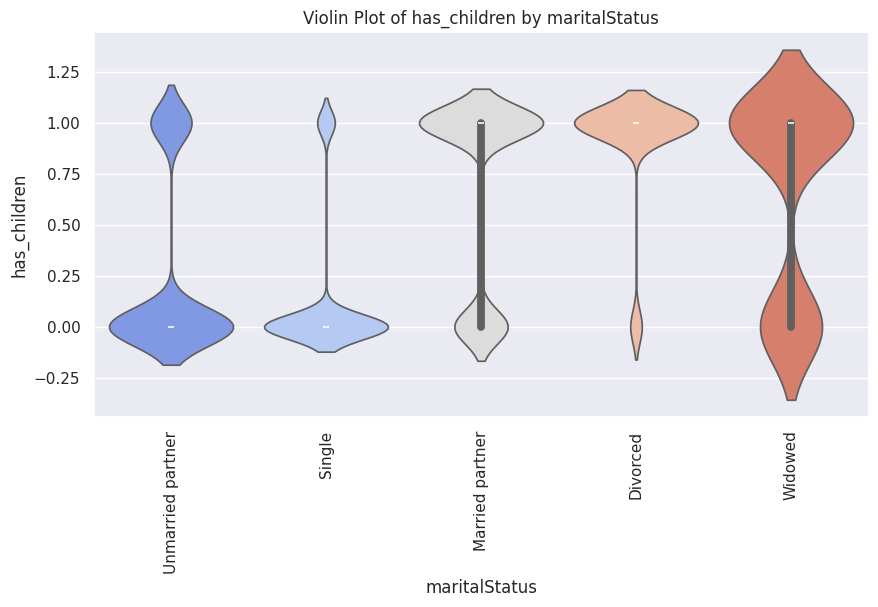


📌 **ANOVA Test:** F-Statistic = 1511.7789, P-Value = 0.0000
✅ **Significant Relationship (p < 0.05)!**

🔹 **Analyzing has_children vs education**

📊 **Descriptive Statistics**:
                                         count      mean       std  min  25%  \
education                                                                      
Associates degree                       1126.0  0.586146  0.492742  0.0  0.0   
Bachelors degree                        4247.0  0.368966  0.482582  0.0  0.0   
Graduate degree (Masters or Doctorate)  1793.0  0.547685  0.497860  0.0  0.0   
High School Graduate                     880.0  0.245455  0.430601  0.0  0.0   
Some High School                          87.0  0.758621  0.430400  0.0  1.0   
Some college - no degree                4260.0  0.389437  0.487680  0.0  0.0   

                                        50%  75%  max  
education                                              
Associates degree                       1.0  1.0  1.0  
Bachelors deg

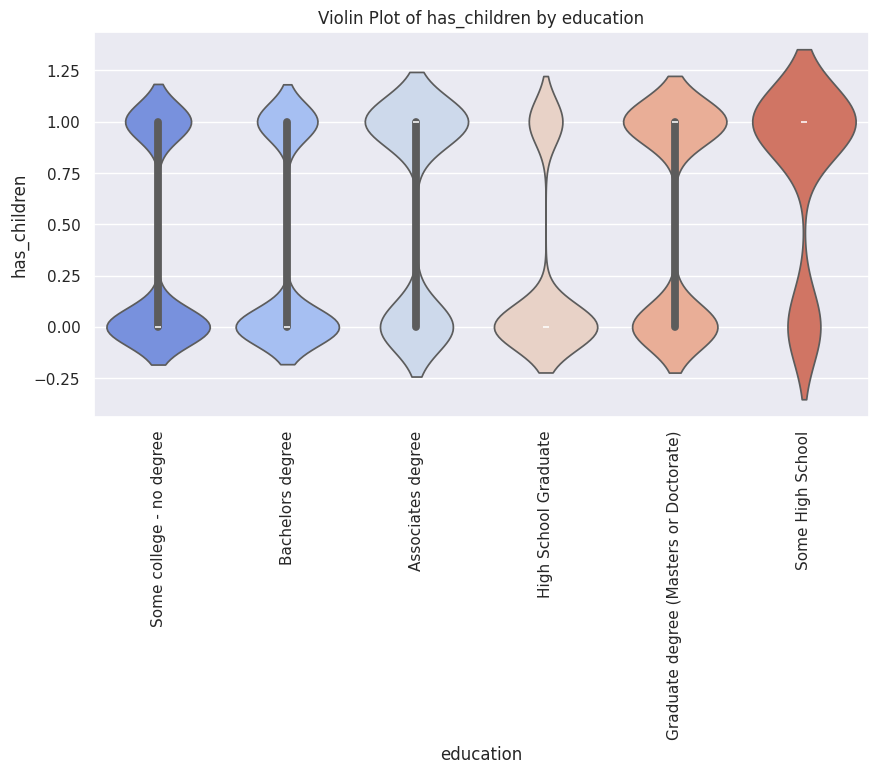


📌 **ANOVA Test:** F-Statistic = 95.6570, P-Value = 0.0000
✅ **Significant Relationship (p < 0.05)!**

🔹 **Analyzing has_children vs occupation**

📊 **Descriptive Statistics**:
                                            count      mean       std  min  \
occupation                                                                   
Architecture & Engineering                  172.0  0.377907  0.486280  0.0   
Arts Design Entertainment Sports & Media    617.0  0.374392  0.484358  0.0   
Building & Grounds Cleaning & Maintenance    42.0  0.500000  0.506061  0.0   
Business & Financial                        536.0  0.498134  0.500464  0.0   
Community & Social Services                 236.0  0.271186  0.445517  0.0   
Computer & Mathematical                    1360.0  0.525000  0.499558  0.0   
Construction & Extraction                   150.0  0.286667  0.453719  0.0   
Education&Training&Library                  921.0  0.585233  0.492949  0.0   
Farming Fishing & Forestry                 

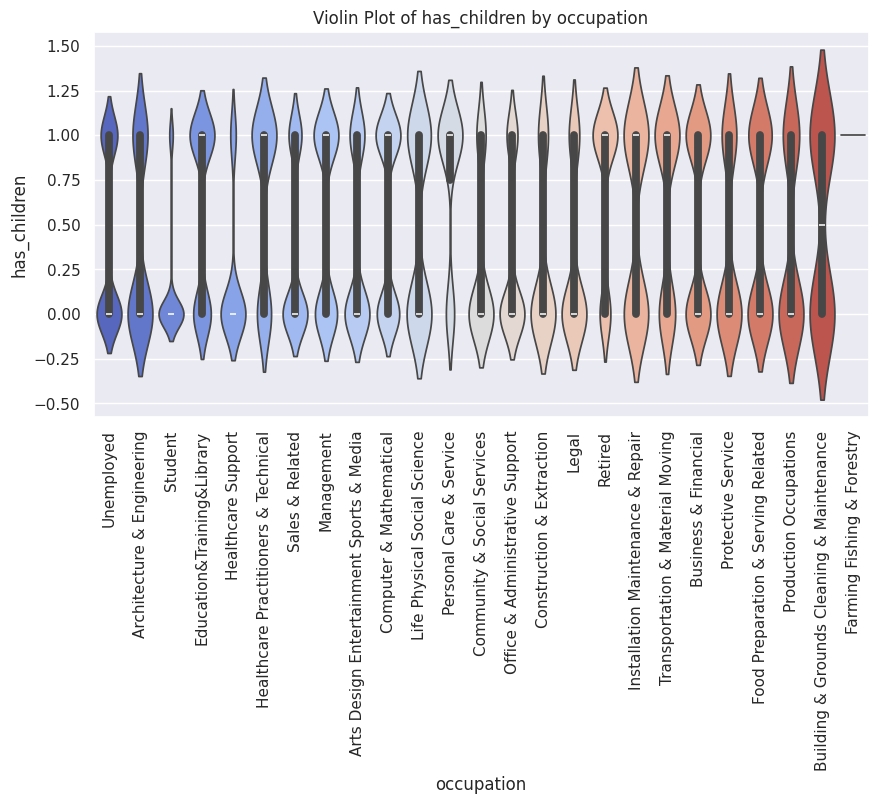


📌 **ANOVA Test:** F-Statistic = 61.8774, P-Value = 0.0000
✅ **Significant Relationship (p < 0.05)!**

🔹 **Analyzing has_children vs income**

📊 **Descriptive Statistics**:
                   count      mean       std  min  25%  50%  75%  max
income                                                               
$100000 or More   1688.0  0.402251  0.490497  0.0  0.0  0.0  1.0  1.0
$12500 - $24999   1795.0  0.372145  0.483511  0.0  0.0  0.0  1.0  1.0
$25000 - $37499   1972.0  0.389959  0.487864  0.0  0.0  0.0  1.0  1.0
$37500 - $49999   1760.0  0.479545  0.499723  0.0  0.0  0.0  1.0  1.0
$50000 - $62499   1624.0  0.447660  0.497406  0.0  0.0  0.0  1.0  1.0
$62500 - $74999    832.0  0.472356  0.499536  0.0  0.0  0.0  1.0  1.0
$75000 - $87499    844.0  0.441943  0.496912  0.0  0.0  0.0  1.0  1.0
$87500 - $99999    865.0  0.558382  0.496867  0.0  0.0  1.0  1.0  1.0
Less than $12500  1013.0  0.211254  0.408400  0.0  0.0  0.0  0.0  1.0


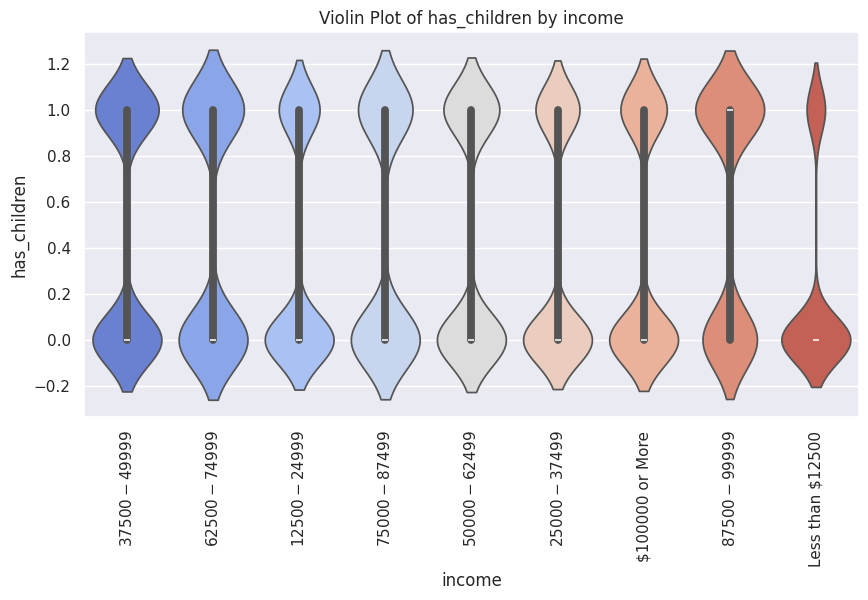


📌 **ANOVA Test:** F-Statistic = 40.6700, P-Value = 0.0000
✅ **Significant Relationship (p < 0.05)!**

🔹 **Analyzing has_children vs Bar**

📊 **Descriptive Statistics**:
        count      mean       std  min  25%  50%  75%  max
Bar                                                       
1~3    2432.0  0.333882  0.471695  0.0  0.0  0.0  1.0  1.0
4~8    1045.0  0.226794  0.418959  0.0  0.0  0.0  0.0  1.0
gt8     338.0  0.124260  0.330367  0.0  0.0  0.0  0.0  1.0
less1  3383.0  0.411174  0.492119  0.0  0.0  0.0  1.0  1.0
never  5195.0  0.513571  0.499864  0.0  0.0  1.0  1.0  1.0


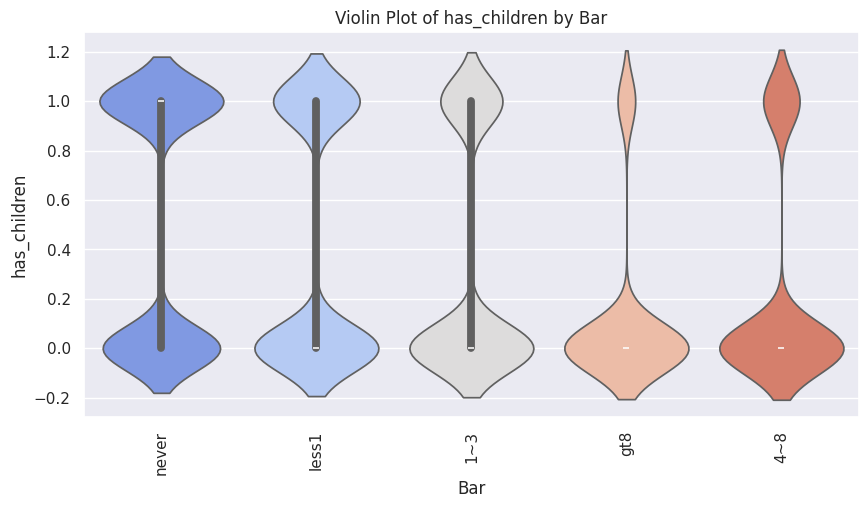


📌 **ANOVA Test:** F-Statistic = 142.1750, P-Value = 0.0000
✅ **Significant Relationship (p < 0.05)!**

🔹 **Analyzing has_children vs CoffeeHouse**

📊 **Descriptive Statistics**:
              count      mean       std  min  25%  50%  75%  max
CoffeeHouse                                                     
1~3          3138.0  0.418419  0.493378  0.0  0.0  0.0  1.0  1.0
4~8          1752.0  0.410388  0.492045  0.0  0.0  0.0  1.0  1.0
gt8          1083.0  0.466297  0.499093  0.0  0.0  0.0  1.0  1.0
less1        3525.0  0.411064  0.492097  0.0  0.0  0.0  1.0  1.0
never        2895.0  0.402073  0.490401  0.0  0.0  0.0  1.0  1.0


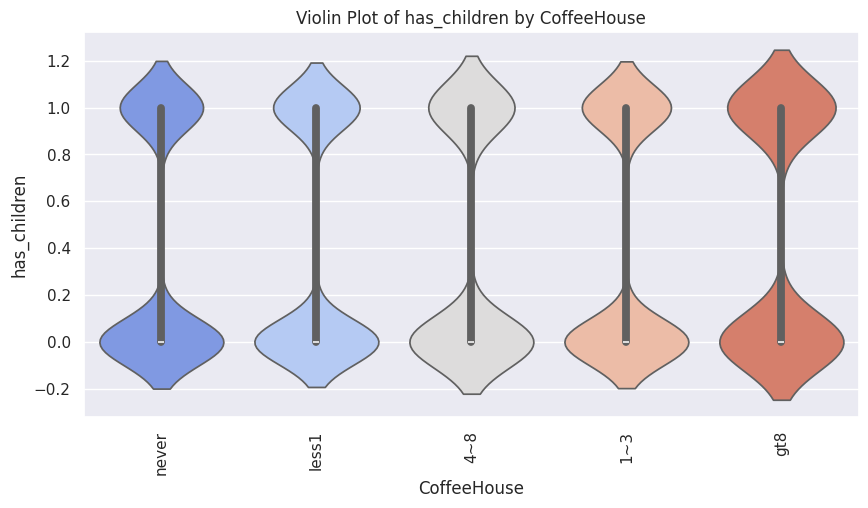


📌 **ANOVA Test:** F-Statistic = 3.5625, P-Value = 0.0066
✅ **Significant Relationship (p < 0.05)!**

🔹 **Analyzing has_children vs CarryAway**

📊 **Descriptive Statistics**:
            count      mean       std  min  25%  50%  75%  max
CarryAway                                                     
1~3        4719.0  0.390761  0.487973  0.0  0.0  0.0  1.0  1.0
4~8        4171.0  0.485495  0.499849  0.0  0.0  0.0  1.0  1.0
gt8        1535.0  0.254072  0.435480  0.0  0.0  0.0  1.0  1.0
less1      1819.0  0.431006  0.495353  0.0  0.0  0.0  1.0  1.0
never       149.0  0.718121  0.451432  0.0  0.0  1.0  1.0  1.0


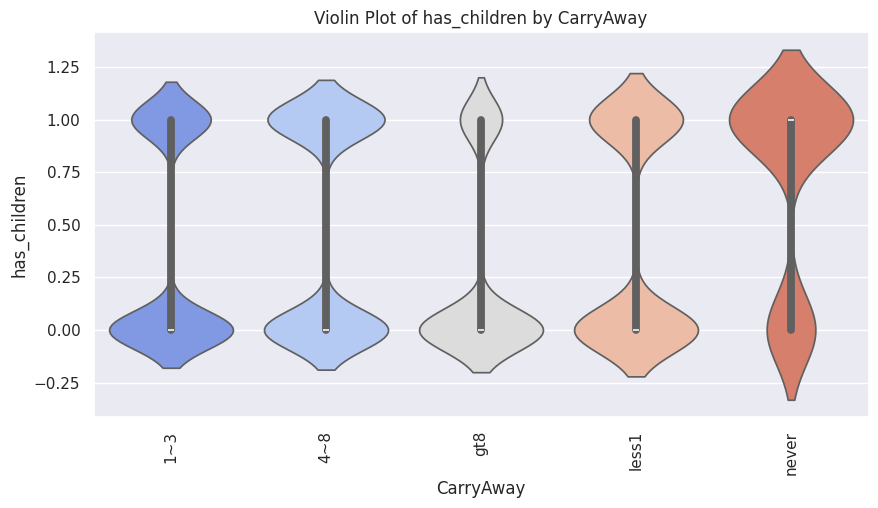


📌 **ANOVA Test:** F-Statistic = 81.7495, P-Value = 0.0000
✅ **Significant Relationship (p < 0.05)!**

🔹 **Analyzing has_children vs RestaurantLessThan20**

📊 **Descriptive Statistics**:
                       count      mean       std  min  25%  50%  75%  max
RestaurantLessThan20                                                     
1~3                   5397.0  0.464888  0.498812  0.0  0.0  0.0  1.0  1.0
4~8                   3493.0  0.383911  0.486406  0.0  0.0  0.0  1.0  1.0
gt8                   1253.0  0.363927  0.481320  0.0  0.0  0.0  1.0  1.0
less1                 2034.0  0.382498  0.486117  0.0  0.0  0.0  1.0  1.0
never                  216.0  0.305556  0.461712  0.0  0.0  0.0  1.0  1.0


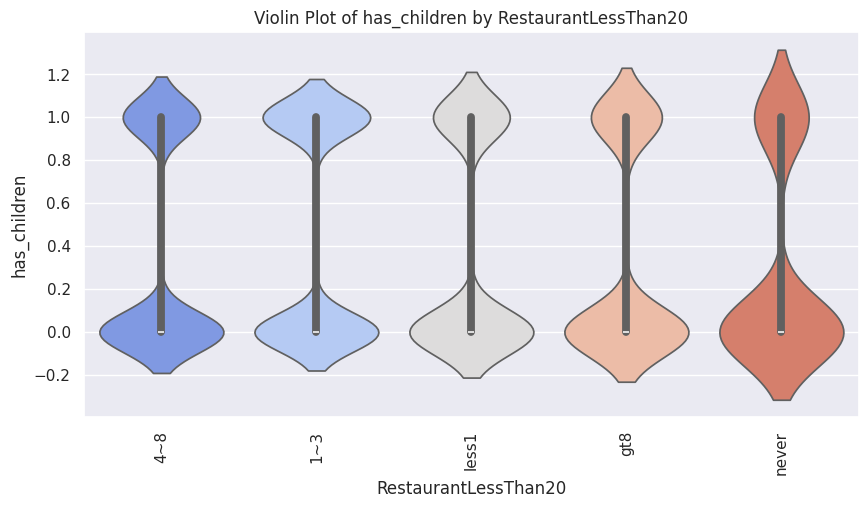


📌 **ANOVA Test:** F-Statistic = 25.7390, P-Value = 0.0000
✅ **Significant Relationship (p < 0.05)!**

🔹 **Analyzing has_children vs Restaurant20To50**

📊 **Descriptive Statistics**:
                   count      mean       std  min  25%  50%  75%  max
Restaurant20To50                                                     
1~3               3204.0  0.399189  0.489808  0.0  0.0  0.0  1.0  1.0
4~8                718.0  0.501393  0.500347  0.0  0.0  1.0  1.0  1.0
gt8                254.0  0.275591  0.447694  0.0  0.0  0.0  1.0  1.0
less1             6134.0  0.426801  0.494653  0.0  0.0  0.0  1.0  1.0
never             2083.0  0.395103  0.488990  0.0  0.0  0.0  1.0  1.0


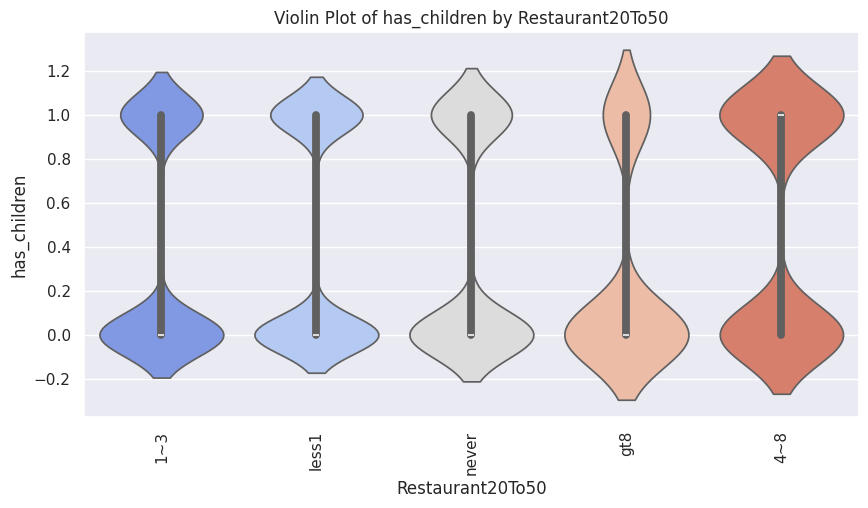


📌 **ANOVA Test:** F-Statistic = 13.1972, P-Value = 0.0000
✅ **Significant Relationship (p < 0.05)!**

🔹 **Analyzing toCoupon_GEQ5min vs destination**

📊 **Descriptive Statistics**:
                  count  mean  std  min  25%  50%  75%  max
destination                                                
Home             3161.0   1.0  0.0  1.0  1.0  1.0  1.0  1.0
No Urgent Place  6118.0   1.0  0.0  1.0  1.0  1.0  1.0  1.0
Work             3114.0   1.0  0.0  1.0  1.0  1.0  1.0  1.0


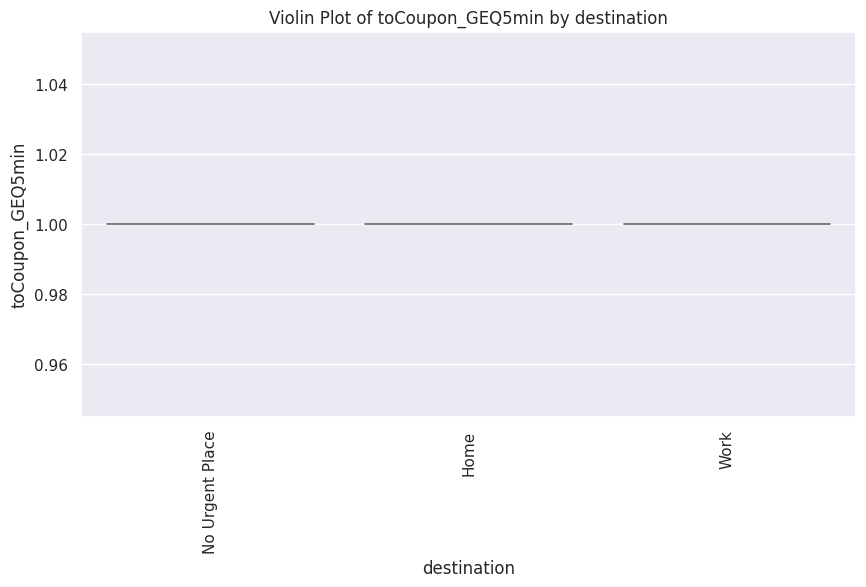


📌 **ANOVA Test:** F-Statistic = nan, P-Value = nan
❌ **No significant difference.**

🔹 **Analyzing toCoupon_GEQ5min vs passanger**

📊 **Descriptive Statistics**:
            count  mean  std  min  25%  50%  75%  max
passanger                                            
Alone      7178.0   1.0  0.0  1.0  1.0  1.0  1.0  1.0
Friend(s)  3166.0   1.0  0.0  1.0  1.0  1.0  1.0  1.0
Kid(s)      981.0   1.0  0.0  1.0  1.0  1.0  1.0  1.0
Partner    1068.0   1.0  0.0  1.0  1.0  1.0  1.0  1.0


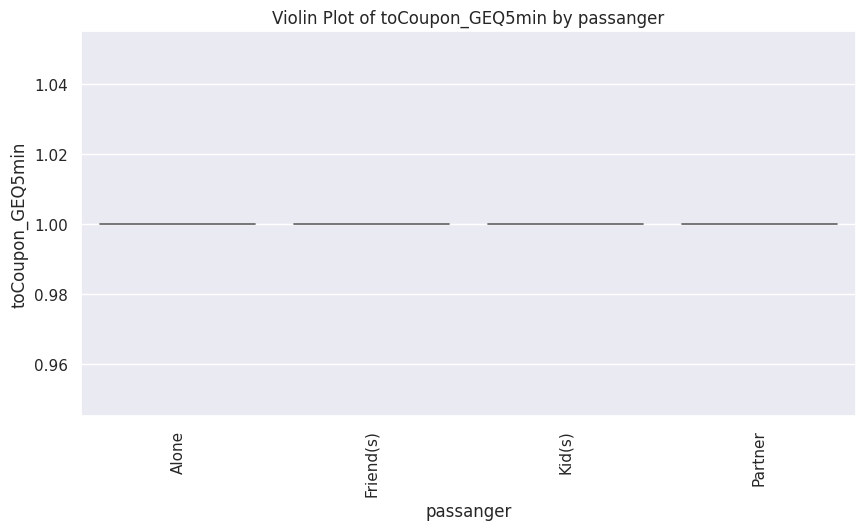


📌 **ANOVA Test:** F-Statistic = nan, P-Value = nan
❌ **No significant difference.**

🔹 **Analyzing toCoupon_GEQ5min vs weather**

📊 **Descriptive Statistics**:
          count  mean  std  min  25%  50%  75%  max
weather                                            
Rainy    1202.0   1.0  0.0  1.0  1.0  1.0  1.0  1.0
Snowy    1329.0   1.0  0.0  1.0  1.0  1.0  1.0  1.0
Sunny    9862.0   1.0  0.0  1.0  1.0  1.0  1.0  1.0


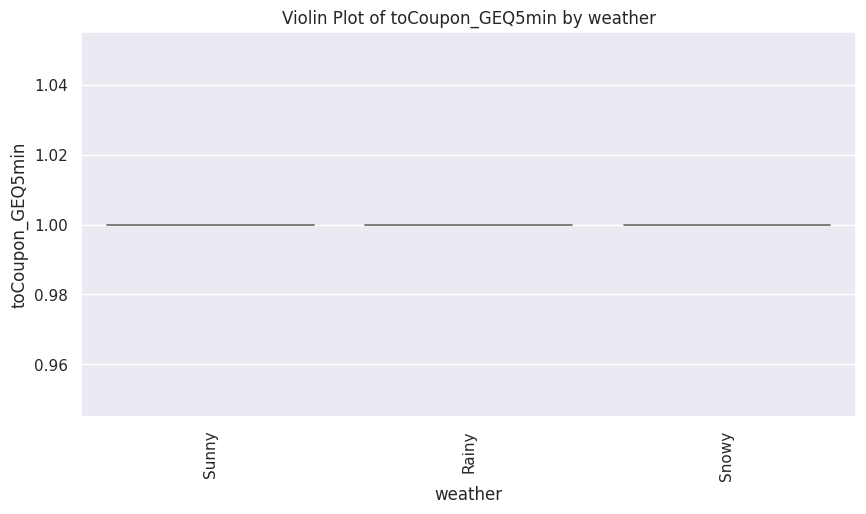


📌 **ANOVA Test:** F-Statistic = nan, P-Value = nan
❌ **No significant difference.**

🔹 **Analyzing toCoupon_GEQ5min vs coupon**

📊 **Descriptive Statistics**:
                        count  mean  std  min  25%  50%  75%  max
coupon                                                           
Bar                    2010.0   1.0  0.0  1.0  1.0  1.0  1.0  1.0
Carry out & Take away  2275.0   1.0  0.0  1.0  1.0  1.0  1.0  1.0
Coffee House           3913.0   1.0  0.0  1.0  1.0  1.0  1.0  1.0
Restaurant(20-50)      1487.0   1.0  0.0  1.0  1.0  1.0  1.0  1.0
Restaurant(<20)        2708.0   1.0  0.0  1.0  1.0  1.0  1.0  1.0


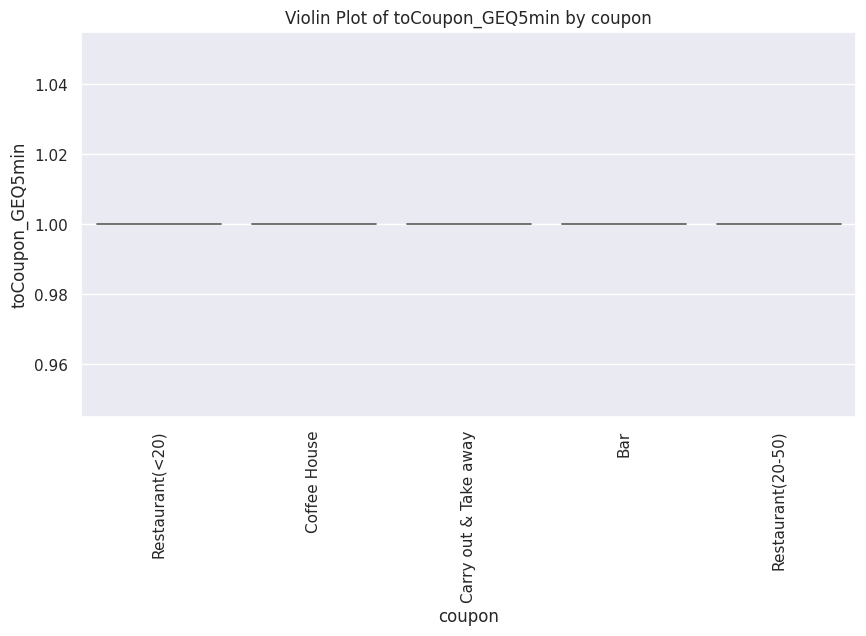


📌 **ANOVA Test:** F-Statistic = nan, P-Value = nan
❌ **No significant difference.**

🔹 **Analyzing toCoupon_GEQ5min vs expiration**

📊 **Descriptive Statistics**:
             count  mean  std  min  25%  50%  75%  max
expiration                                            
1d          6938.0   1.0  0.0  1.0  1.0  1.0  1.0  1.0
2h          5455.0   1.0  0.0  1.0  1.0  1.0  1.0  1.0


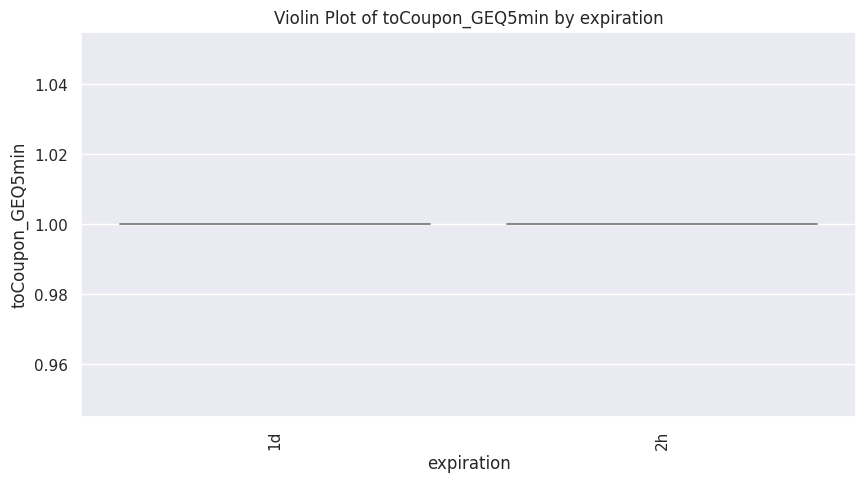


📌 **ANOVA Test:** F-Statistic = nan, P-Value = nan
❌ **No significant difference.**

🔹 **Analyzing toCoupon_GEQ5min vs gender**

📊 **Descriptive Statistics**:
         count  mean  std  min  25%  50%  75%  max
gender                                            
Female  6355.0   1.0  0.0  1.0  1.0  1.0  1.0  1.0
Male    6038.0   1.0  0.0  1.0  1.0  1.0  1.0  1.0


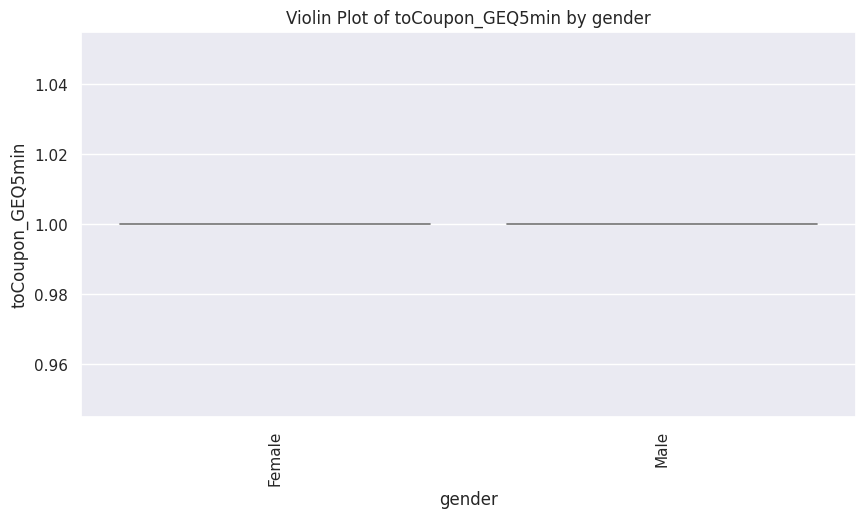


📌 **ANOVA Test:** F-Statistic = nan, P-Value = nan
❌ **No significant difference.**

🔹 **Analyzing toCoupon_GEQ5min vs age**

📊 **Descriptive Statistics**:
          count  mean  std  min  25%  50%  75%  max
age                                                
21       2598.0   1.0  0.0  1.0  1.0  1.0  1.0  1.0
26       2486.0   1.0  0.0  1.0  1.0  1.0  1.0  1.0
31       1984.0   1.0  0.0  1.0  1.0  1.0  1.0  1.0
36       1293.0   1.0  0.0  1.0  1.0  1.0  1.0  1.0
41       1079.0   1.0  0.0  1.0  1.0  1.0  1.0  1.0
46        660.0   1.0  0.0  1.0  1.0  1.0  1.0  1.0
50plus   1756.0   1.0  0.0  1.0  1.0  1.0  1.0  1.0
below21   537.0   1.0  0.0  1.0  1.0  1.0  1.0  1.0


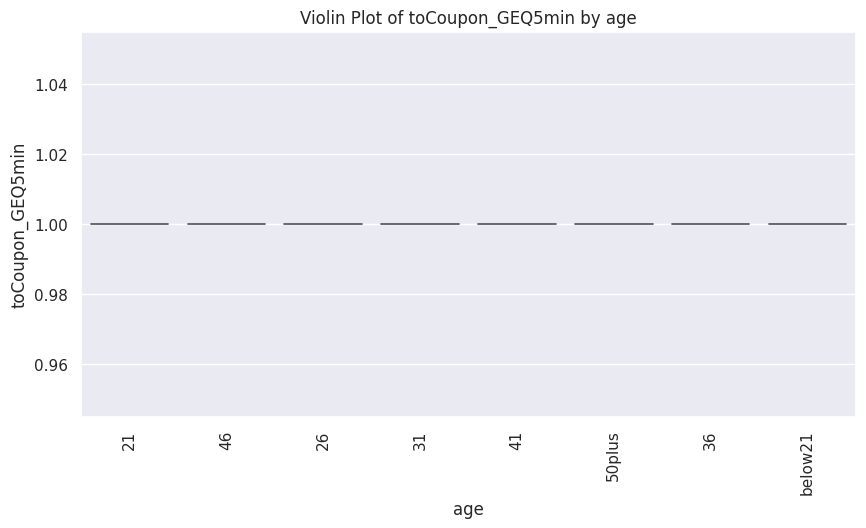


📌 **ANOVA Test:** F-Statistic = nan, P-Value = nan
❌ **No significant difference.**

🔹 **Analyzing toCoupon_GEQ5min vs maritalStatus**

📊 **Descriptive Statistics**:
                    count  mean  std  min  25%  50%  75%  max
maritalStatus                                                
Divorced            505.0   1.0  0.0  1.0  1.0  1.0  1.0  1.0
Married partner    4994.0   1.0  0.0  1.0  1.0  1.0  1.0  1.0
Single             4610.0   1.0  0.0  1.0  1.0  1.0  1.0  1.0
Unmarried partner  2155.0   1.0  0.0  1.0  1.0  1.0  1.0  1.0
Widowed             129.0   1.0  0.0  1.0  1.0  1.0  1.0  1.0


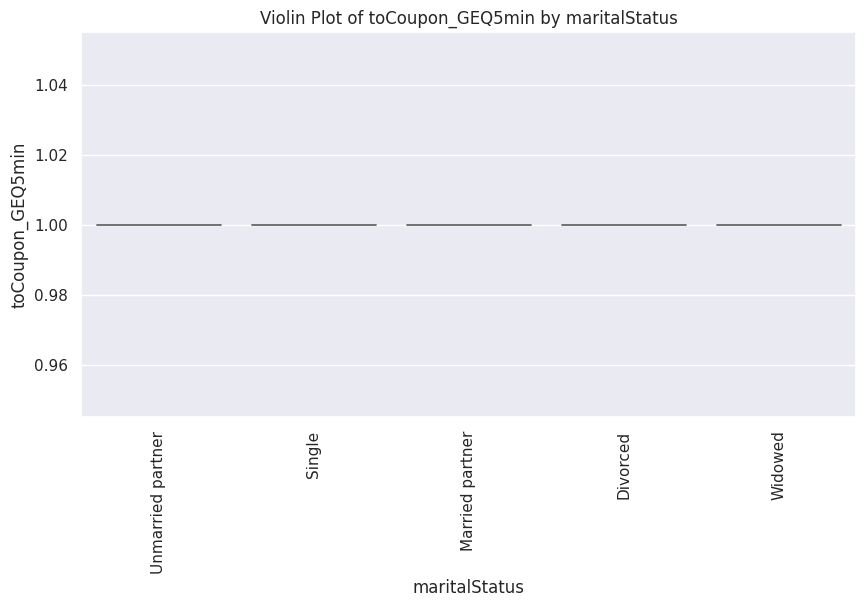


📌 **ANOVA Test:** F-Statistic = nan, P-Value = nan
❌ **No significant difference.**

🔹 **Analyzing toCoupon_GEQ5min vs education**

📊 **Descriptive Statistics**:
                                         count  mean  std  min  25%  50%  75%  \
education                                                                       
Associates degree                       1126.0   1.0  0.0  1.0  1.0  1.0  1.0   
Bachelors degree                        4247.0   1.0  0.0  1.0  1.0  1.0  1.0   
Graduate degree (Masters or Doctorate)  1793.0   1.0  0.0  1.0  1.0  1.0  1.0   
High School Graduate                     880.0   1.0  0.0  1.0  1.0  1.0  1.0   
Some High School                          87.0   1.0  0.0  1.0  1.0  1.0  1.0   
Some college - no degree                4260.0   1.0  0.0  1.0  1.0  1.0  1.0   

                                        max  
education                                    
Associates degree                       1.0  
Bachelors degree                        1.0  
Grad

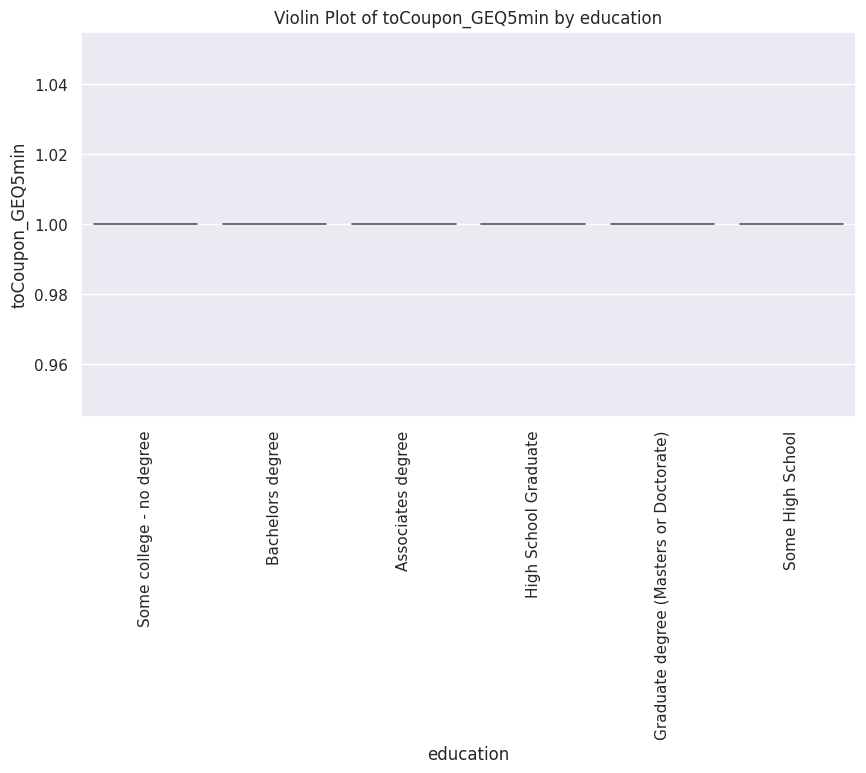


📌 **ANOVA Test:** F-Statistic = nan, P-Value = nan
❌ **No significant difference.**

🔹 **Analyzing toCoupon_GEQ5min vs occupation**

📊 **Descriptive Statistics**:
                                            count  mean  std  min  25%  50%  \
occupation                                                                    
Architecture & Engineering                  172.0   1.0  0.0  1.0  1.0  1.0   
Arts Design Entertainment Sports & Media    617.0   1.0  0.0  1.0  1.0  1.0   
Building & Grounds Cleaning & Maintenance    42.0   1.0  0.0  1.0  1.0  1.0   
Business & Financial                        536.0   1.0  0.0  1.0  1.0  1.0   
Community & Social Services                 236.0   1.0  0.0  1.0  1.0  1.0   
Computer & Mathematical                    1360.0   1.0  0.0  1.0  1.0  1.0   
Construction & Extraction                   150.0   1.0  0.0  1.0  1.0  1.0   
Education&Training&Library                  921.0   1.0  0.0  1.0  1.0  1.0   
Farming Fishing & Forestry                   4

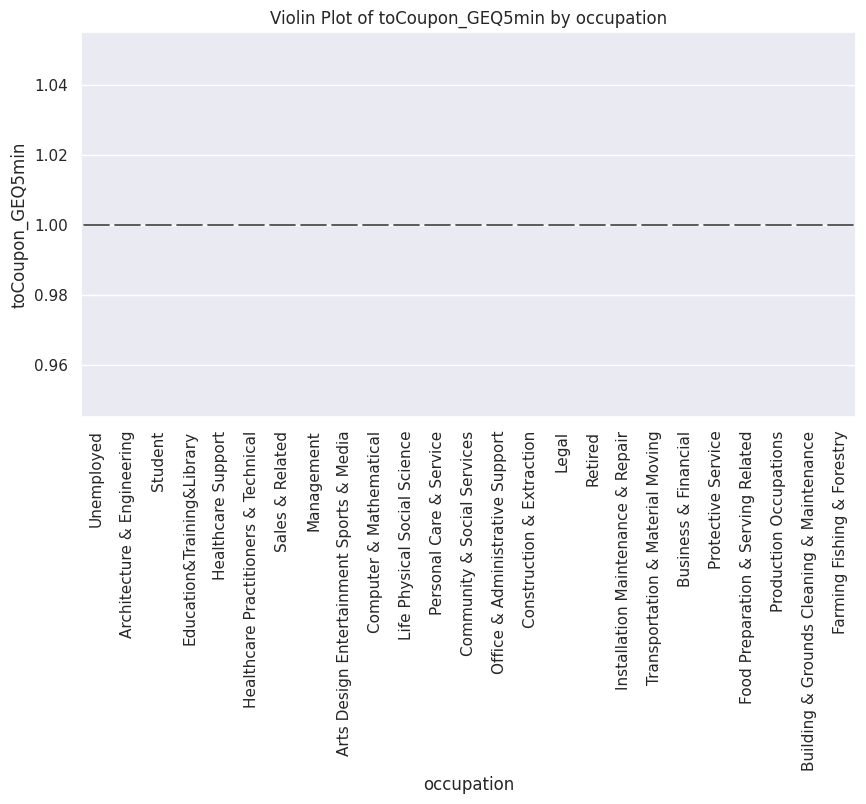


📌 **ANOVA Test:** F-Statistic = nan, P-Value = nan
❌ **No significant difference.**

🔹 **Analyzing toCoupon_GEQ5min vs income**

📊 **Descriptive Statistics**:
                   count  mean  std  min  25%  50%  75%  max
income                                                      
$100000 or More   1688.0   1.0  0.0  1.0  1.0  1.0  1.0  1.0
$12500 - $24999   1795.0   1.0  0.0  1.0  1.0  1.0  1.0  1.0
$25000 - $37499   1972.0   1.0  0.0  1.0  1.0  1.0  1.0  1.0
$37500 - $49999   1760.0   1.0  0.0  1.0  1.0  1.0  1.0  1.0
$50000 - $62499   1624.0   1.0  0.0  1.0  1.0  1.0  1.0  1.0
$62500 - $74999    832.0   1.0  0.0  1.0  1.0  1.0  1.0  1.0
$75000 - $87499    844.0   1.0  0.0  1.0  1.0  1.0  1.0  1.0
$87500 - $99999    865.0   1.0  0.0  1.0  1.0  1.0  1.0  1.0
Less than $12500  1013.0   1.0  0.0  1.0  1.0  1.0  1.0  1.0


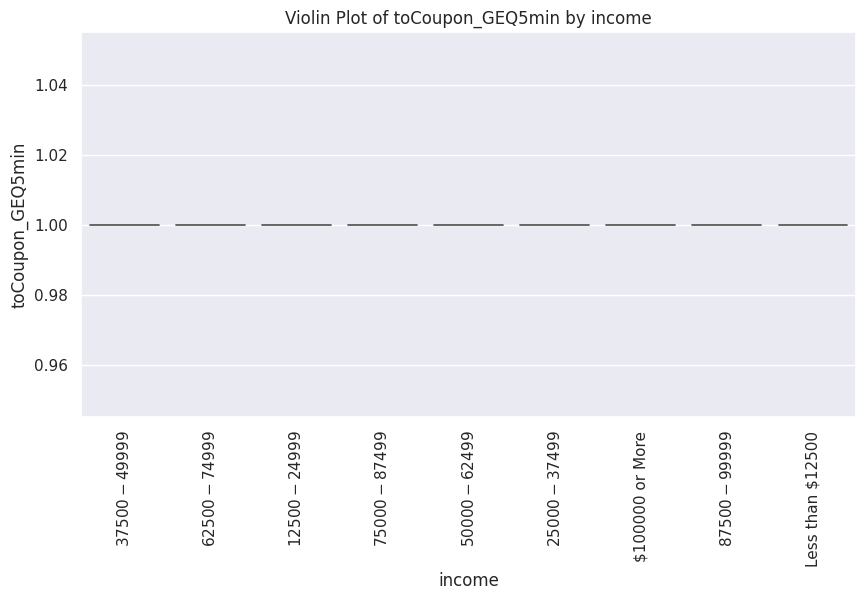


📌 **ANOVA Test:** F-Statistic = nan, P-Value = nan
❌ **No significant difference.**

🔹 **Analyzing toCoupon_GEQ5min vs Bar**

📊 **Descriptive Statistics**:
        count  mean  std  min  25%  50%  75%  max
Bar                                              
1~3    2432.0   1.0  0.0  1.0  1.0  1.0  1.0  1.0
4~8    1045.0   1.0  0.0  1.0  1.0  1.0  1.0  1.0
gt8     338.0   1.0  0.0  1.0  1.0  1.0  1.0  1.0
less1  3383.0   1.0  0.0  1.0  1.0  1.0  1.0  1.0
never  5195.0   1.0  0.0  1.0  1.0  1.0  1.0  1.0


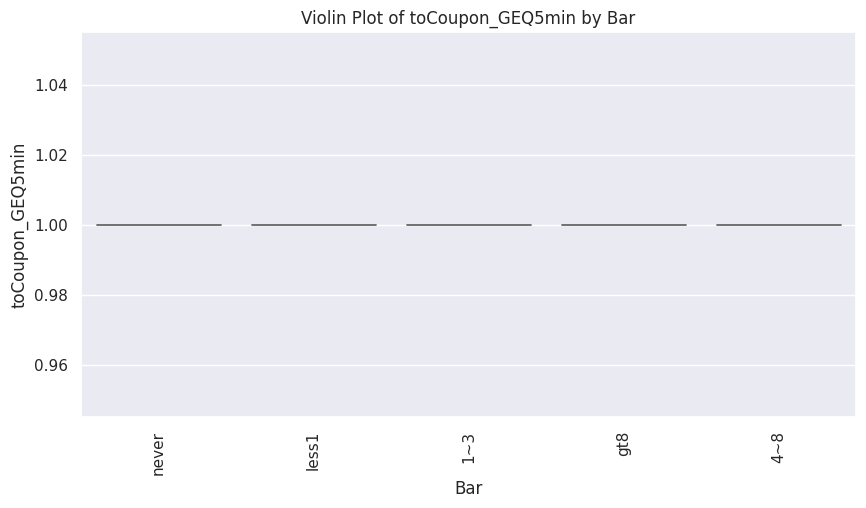


📌 **ANOVA Test:** F-Statistic = nan, P-Value = nan
❌ **No significant difference.**

🔹 **Analyzing toCoupon_GEQ5min vs CoffeeHouse**

📊 **Descriptive Statistics**:
              count  mean  std  min  25%  50%  75%  max
CoffeeHouse                                            
1~3          3138.0   1.0  0.0  1.0  1.0  1.0  1.0  1.0
4~8          1752.0   1.0  0.0  1.0  1.0  1.0  1.0  1.0
gt8          1083.0   1.0  0.0  1.0  1.0  1.0  1.0  1.0
less1        3525.0   1.0  0.0  1.0  1.0  1.0  1.0  1.0
never        2895.0   1.0  0.0  1.0  1.0  1.0  1.0  1.0


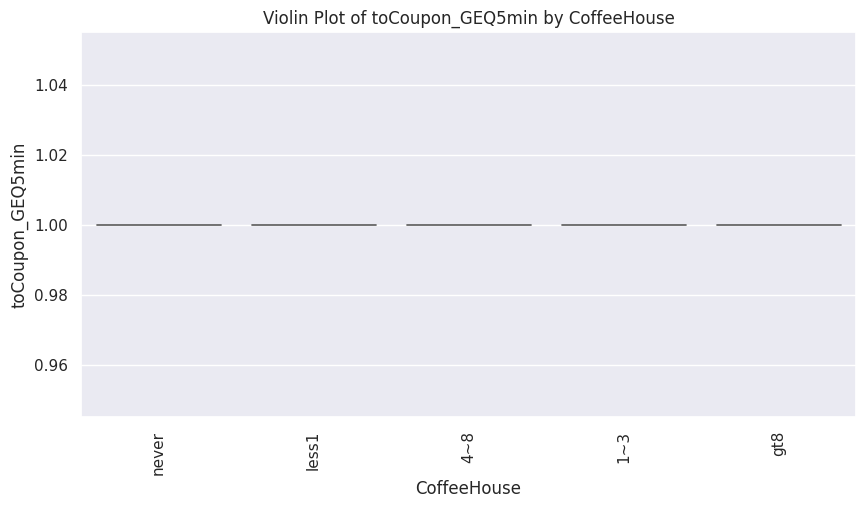


📌 **ANOVA Test:** F-Statistic = nan, P-Value = nan
❌ **No significant difference.**

🔹 **Analyzing toCoupon_GEQ5min vs CarryAway**

📊 **Descriptive Statistics**:
            count  mean  std  min  25%  50%  75%  max
CarryAway                                            
1~3        4719.0   1.0  0.0  1.0  1.0  1.0  1.0  1.0
4~8        4171.0   1.0  0.0  1.0  1.0  1.0  1.0  1.0
gt8        1535.0   1.0  0.0  1.0  1.0  1.0  1.0  1.0
less1      1819.0   1.0  0.0  1.0  1.0  1.0  1.0  1.0
never       149.0   1.0  0.0  1.0  1.0  1.0  1.0  1.0


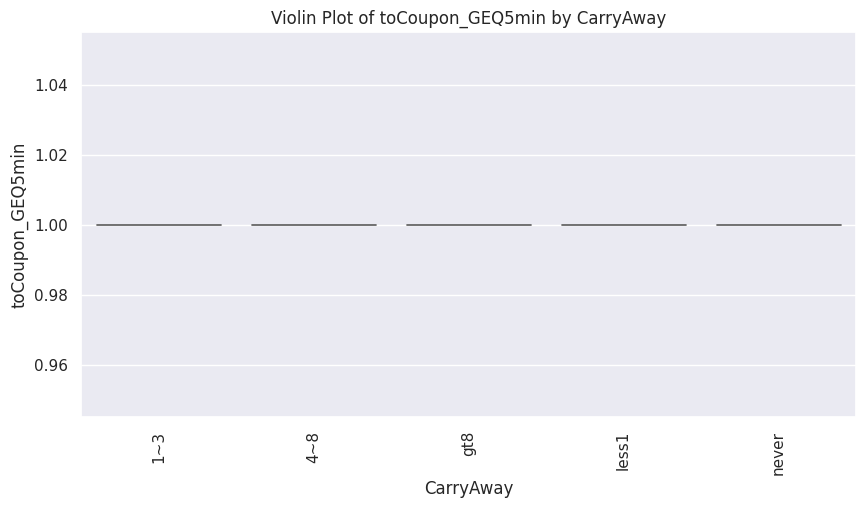


📌 **ANOVA Test:** F-Statistic = nan, P-Value = nan
❌ **No significant difference.**

🔹 **Analyzing toCoupon_GEQ5min vs RestaurantLessThan20**

📊 **Descriptive Statistics**:
                       count  mean  std  min  25%  50%  75%  max
RestaurantLessThan20                                            
1~3                   5397.0   1.0  0.0  1.0  1.0  1.0  1.0  1.0
4~8                   3493.0   1.0  0.0  1.0  1.0  1.0  1.0  1.0
gt8                   1253.0   1.0  0.0  1.0  1.0  1.0  1.0  1.0
less1                 2034.0   1.0  0.0  1.0  1.0  1.0  1.0  1.0
never                  216.0   1.0  0.0  1.0  1.0  1.0  1.0  1.0


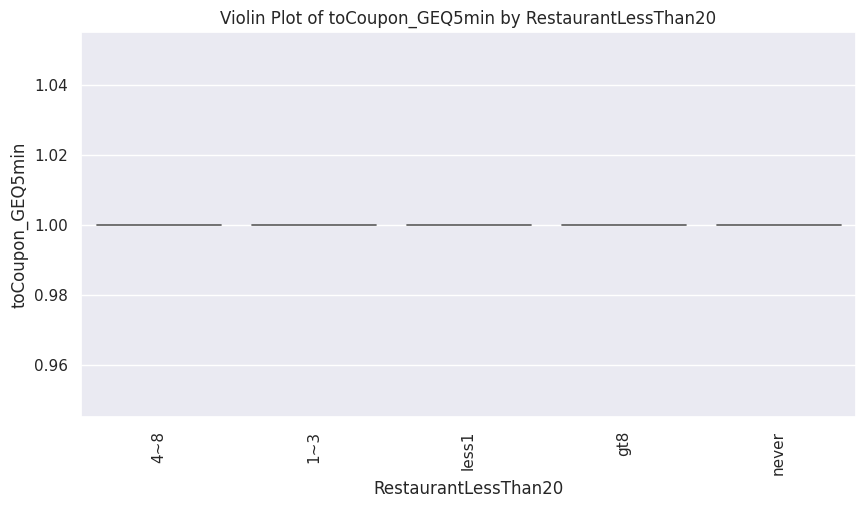


📌 **ANOVA Test:** F-Statistic = nan, P-Value = nan
❌ **No significant difference.**

🔹 **Analyzing toCoupon_GEQ5min vs Restaurant20To50**

📊 **Descriptive Statistics**:
                   count  mean  std  min  25%  50%  75%  max
Restaurant20To50                                            
1~3               3204.0   1.0  0.0  1.0  1.0  1.0  1.0  1.0
4~8                718.0   1.0  0.0  1.0  1.0  1.0  1.0  1.0
gt8                254.0   1.0  0.0  1.0  1.0  1.0  1.0  1.0
less1             6134.0   1.0  0.0  1.0  1.0  1.0  1.0  1.0
never             2083.0   1.0  0.0  1.0  1.0  1.0  1.0  1.0


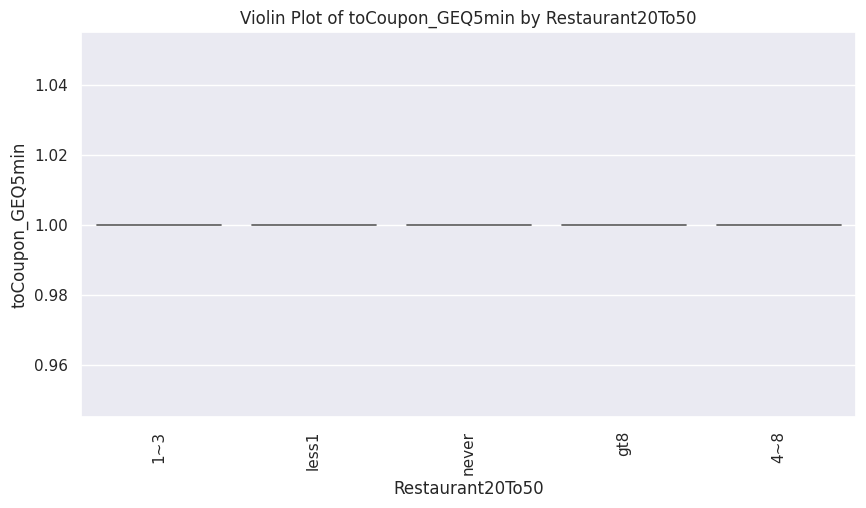


📌 **ANOVA Test:** F-Statistic = nan, P-Value = nan
❌ **No significant difference.**

🔹 **Analyzing toCoupon_GEQ15min vs destination**

📊 **Descriptive Statistics**:
                  count      mean       std  min  25%  50%  75%  max
destination                                                         
Home             3161.0  0.456185  0.498155  0.0  0.0  0.0  1.0  1.0
No Urgent Place  6118.0  0.581563  0.493343  0.0  0.0  1.0  1.0  1.0
Work             3114.0  0.637444  0.480815  0.0  0.0  1.0  1.0  1.0


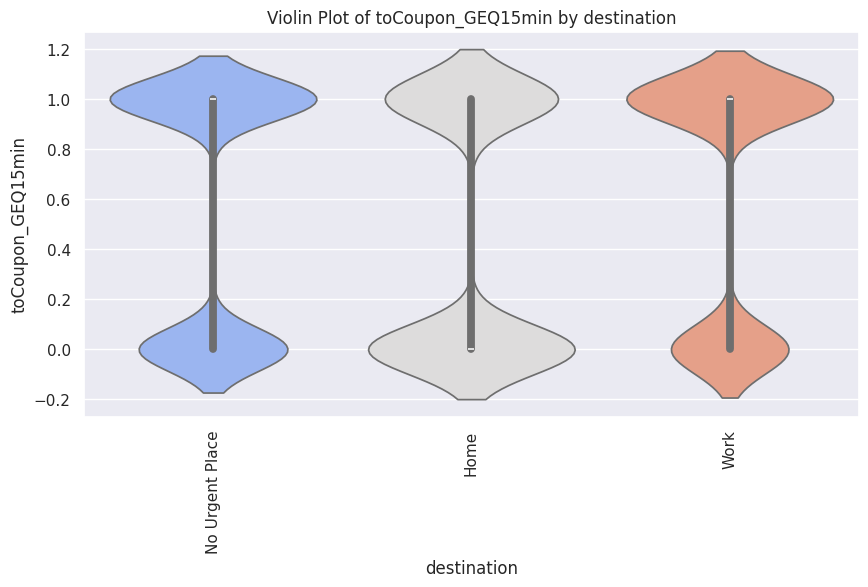


📌 **ANOVA Test:** F-Statistic = 114.7357, P-Value = 0.0000
✅ **Significant Relationship (p < 0.05)!**

🔹 **Analyzing toCoupon_GEQ15min vs passanger**

📊 **Descriptive Statistics**:
            count      mean       std  min  25%  50%  75%  max
passanger                                                     
Alone      7178.0  0.504737  0.500012  0.0  0.0  1.0  1.0  1.0
Friend(s)  3166.0  0.669931  0.470312  0.0  0.0  1.0  1.0  1.0
Kid(s)      981.0  0.781855  0.413197  0.0  1.0  1.0  1.0  1.0
Partner    1068.0  0.443820  0.497067  0.0  0.0  0.0  1.0  1.0


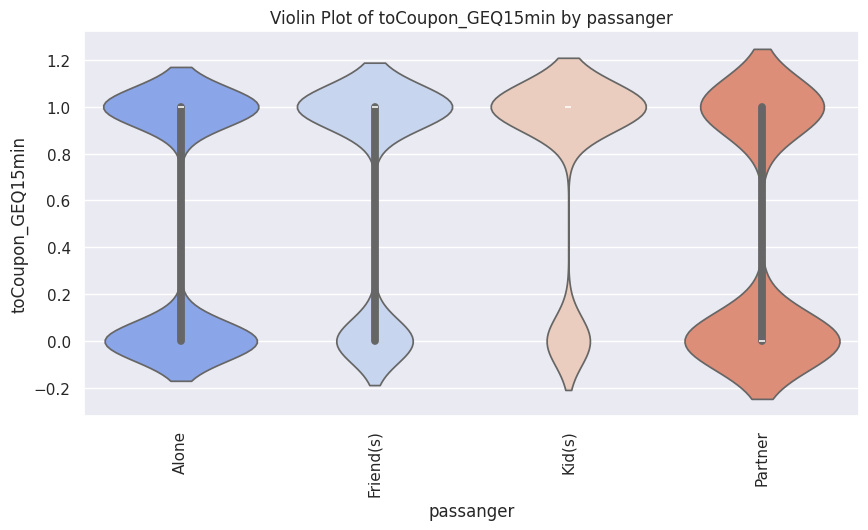


📌 **ANOVA Test:** F-Statistic = 173.2401, P-Value = 0.0000
✅ **Significant Relationship (p < 0.05)!**

🔹 **Analyzing toCoupon_GEQ15min vs weather**

📊 **Descriptive Statistics**:
          count      mean       std  min  25%  50%  75%  max
weather                                                     
Rainy    1202.0  0.672213  0.469602  0.0  0.0  1.0  1.0  1.0
Snowy    1329.0  0.698269  0.459182  0.0  0.0  1.0  1.0  1.0
Sunny    9862.0  0.532245  0.498984  0.0  0.0  1.0  1.0  1.0


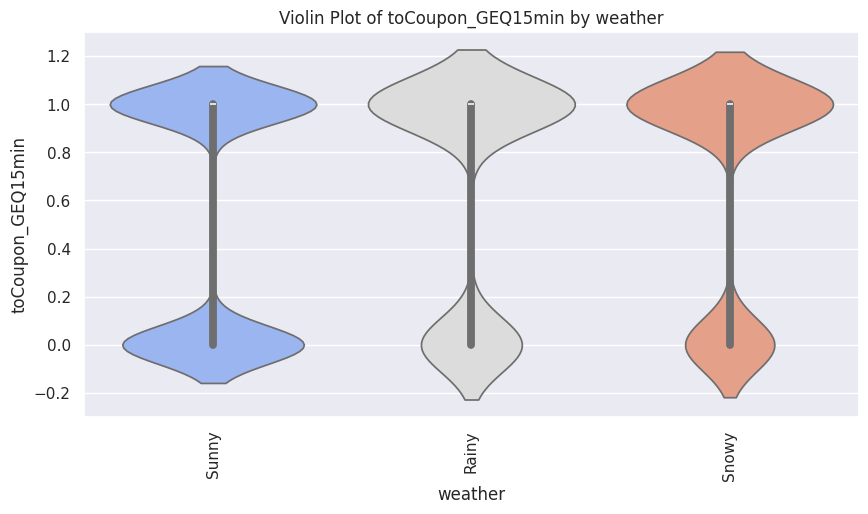


📌 **ANOVA Test:** F-Statistic = 99.0710, P-Value = 0.0000
✅ **Significant Relationship (p < 0.05)!**

🔹 **Analyzing toCoupon_GEQ15min vs coupon**

📊 **Descriptive Statistics**:
                        count      mean       std  min  25%  50%  75%  max
coupon                                                                    
Bar                    2010.0  0.663184  0.472739  0.0  0.0  1.0  1.0  1.0
Carry out & Take away  2275.0  0.616703  0.486297  0.0  0.0  1.0  1.0  1.0
Coffee House           3913.0  0.528239  0.499266  0.0  0.0  1.0  1.0  1.0
Restaurant(20-50)      1487.0  0.634163  0.481826  0.0  0.0  1.0  1.0  1.0
Restaurant(<20)        2708.0  0.457533  0.498285  0.0  0.0  0.0  1.0  1.0


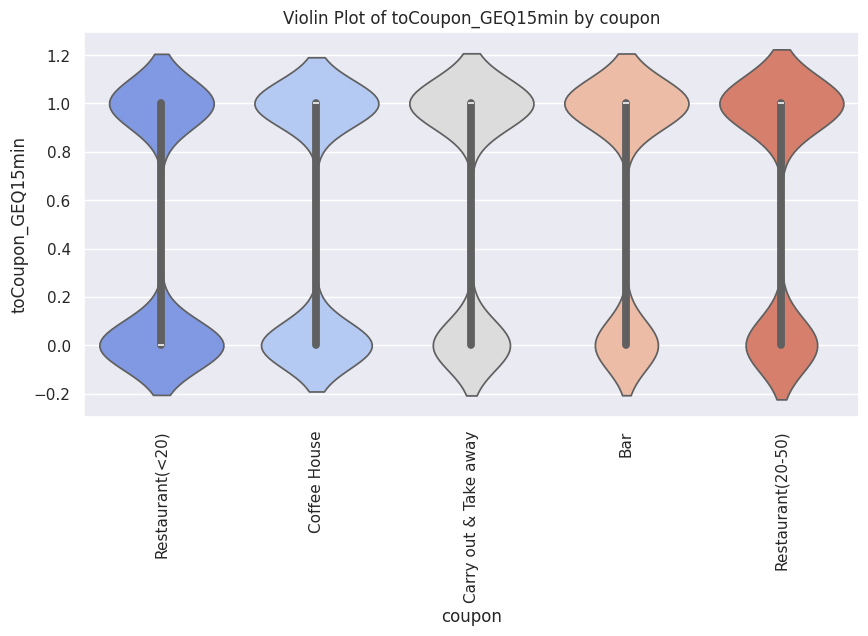


📌 **ANOVA Test:** F-Statistic = 71.8489, P-Value = 0.0000
✅ **Significant Relationship (p < 0.05)!**

🔹 **Analyzing toCoupon_GEQ15min vs expiration**

📊 **Descriptive Statistics**:
             count      mean       std  min  25%  50%  75%  max
expiration                                                     
1d          6938.0  0.536610  0.498694  0.0  0.0  1.0  1.0  1.0
2h          5455.0  0.597984  0.490350  0.0  0.0  1.0  1.0  1.0


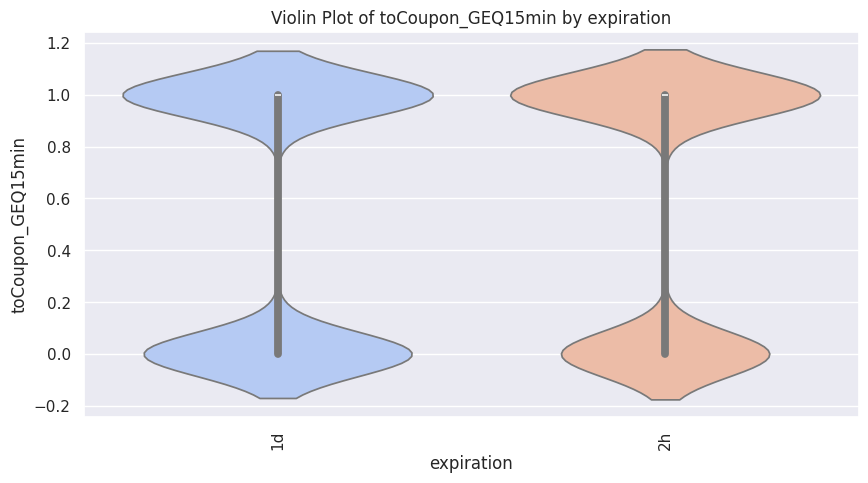


📌 **ANOVA Test:** F-Statistic = 46.9393, P-Value = 0.0000
✅ **Significant Relationship (p < 0.05)!**

🔹 **Analyzing toCoupon_GEQ15min vs gender**

📊 **Descriptive Statistics**:
         count      mean       std  min  25%  50%  75%  max
gender                                                     
Female  6355.0  0.567742  0.495429  0.0  0.0  1.0  1.0  1.0
Male    6038.0  0.559291  0.496513  0.0  0.0  1.0  1.0  1.0


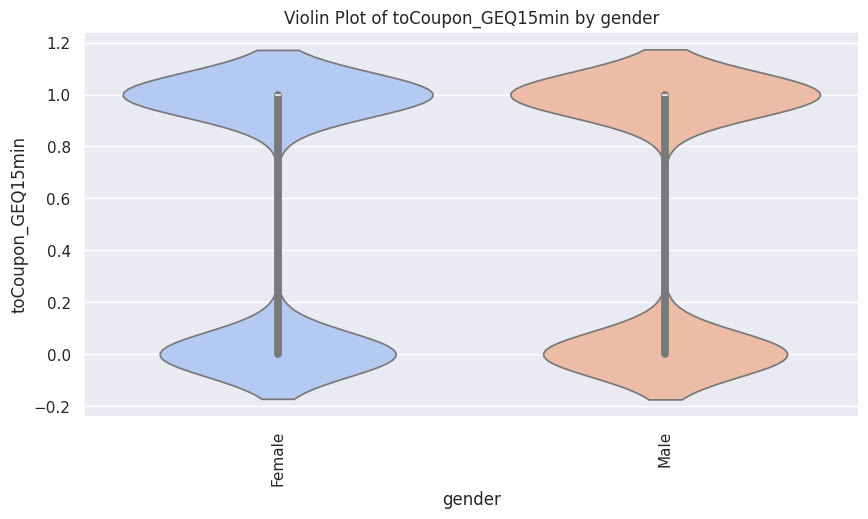


📌 **ANOVA Test:** F-Statistic = 0.8990, P-Value = 0.3431
❌ **No significant difference.**

🔹 **Analyzing toCoupon_GEQ15min vs age**

📊 **Descriptive Statistics**:
          count      mean       std  min  25%  50%  75%  max
age                                                         
21       2598.0  0.535797  0.498813  0.0  0.0  1.0  1.0  1.0
26       2486.0  0.554706  0.497098  0.0  0.0  1.0  1.0  1.0
31       1984.0  0.573085  0.494754  0.0  0.0  1.0  1.0  1.0
36       1293.0  0.580046  0.493742  0.0  0.0  1.0  1.0  1.0
41       1079.0  0.589435  0.492165  0.0  0.0  1.0  1.0  1.0
46        660.0  0.587879  0.492590  0.0  0.0  1.0  1.0  1.0
50plus   1756.0  0.577449  0.494106  0.0  0.0  1.0  1.0  1.0
below21   537.0  0.538175  0.499005  0.0  0.0  1.0  1.0  1.0


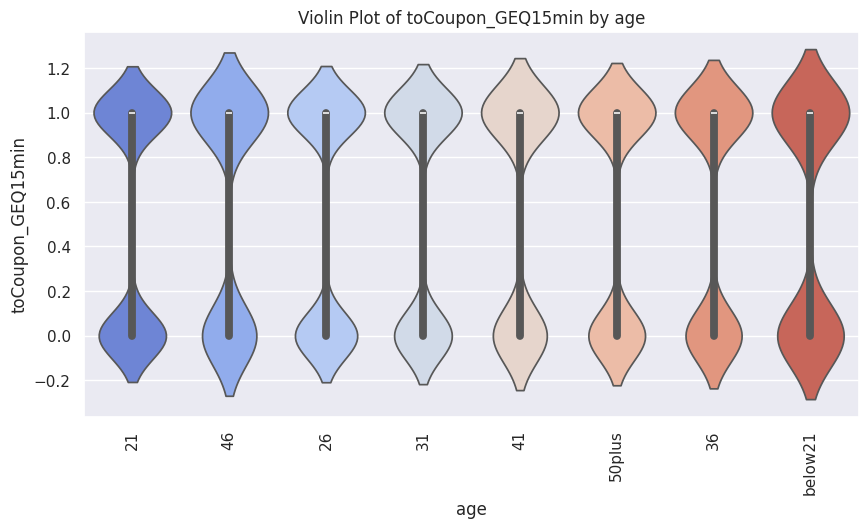


📌 **ANOVA Test:** F-Statistic = 2.6312, P-Value = 0.0103
✅ **Significant Relationship (p < 0.05)!**

🔹 **Analyzing toCoupon_GEQ15min vs maritalStatus**

📊 **Descriptive Statistics**:
                    count      mean       std  min  25%  50%  75%  max
maritalStatus                                                         
Divorced            505.0  0.594059  0.491560  0.0  0.0  1.0  1.0  1.0
Married partner    4994.0  0.590709  0.491752  0.0  0.0  1.0  1.0  1.0
Single             4610.0  0.547289  0.497813  0.0  0.0  1.0  1.0  1.0
Unmarried partner  2155.0  0.531787  0.499104  0.0  0.0  1.0  1.0  1.0
Widowed             129.0  0.511628  0.501814  0.0  0.0  1.0  1.0  1.0


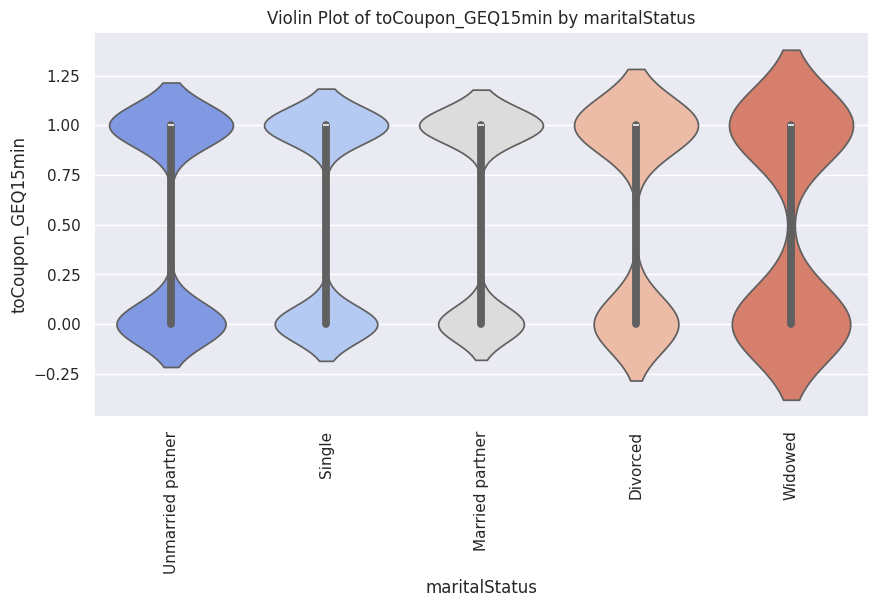


📌 **ANOVA Test:** F-Statistic = 8.0422, P-Value = 0.0000
✅ **Significant Relationship (p < 0.05)!**

🔹 **Analyzing toCoupon_GEQ15min vs education**

📊 **Descriptive Statistics**:
                                         count      mean       std  min  25%  \
education                                                                      
Associates degree                       1126.0  0.583481  0.493201  0.0  0.0   
Bachelors degree                        4247.0  0.563927  0.495955  0.0  0.0   
Graduate degree (Masters or Doctorate)  1793.0  0.583938  0.493042  0.0  0.0   
High School Graduate                     880.0  0.547727  0.498000  0.0  0.0   
Some High School                          87.0  0.517241  0.502599  0.0  0.0   
Some college - no degree                4260.0  0.553756  0.497160  0.0  0.0   

                                        50%  75%  max  
education                                              
Associates degree                       1.0  1.0  1.0  
Bachelors d

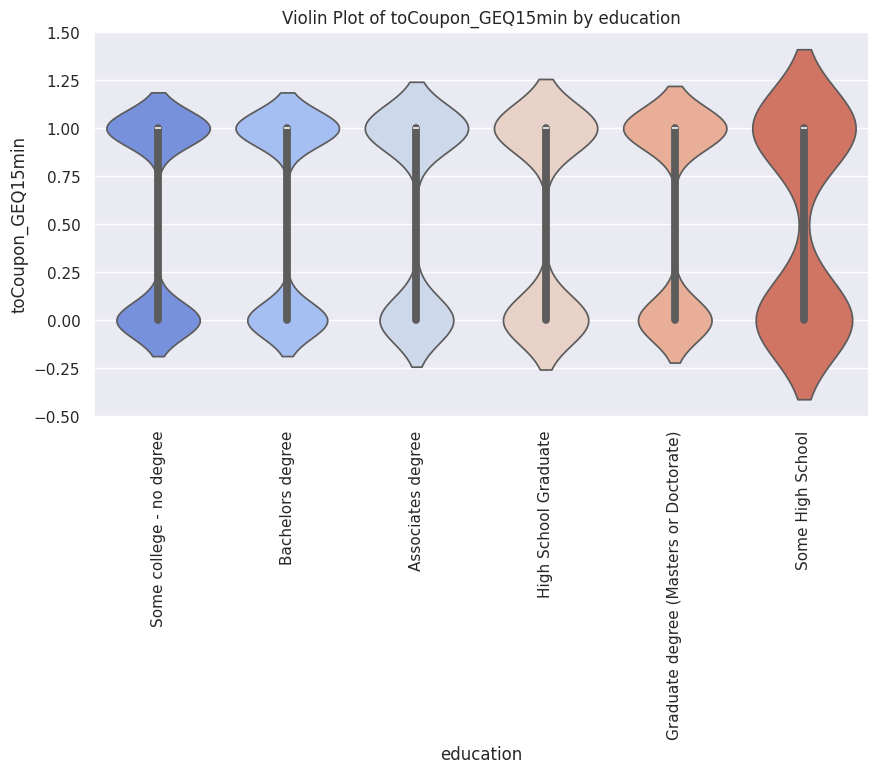


📌 **ANOVA Test:** F-Statistic = 1.6336, P-Value = 0.1473
❌ **No significant difference.**

🔹 **Analyzing toCoupon_GEQ15min vs occupation**

📊 **Descriptive Statistics**:
                                            count      mean       std  min  \
occupation                                                                   
Architecture & Engineering                  172.0  0.593023  0.492705  0.0   
Arts Design Entertainment Sports & Media    617.0  0.573744  0.494933  0.0   
Building & Grounds Cleaning & Maintenance    42.0  0.642857  0.484966  0.0   
Business & Financial                        536.0  0.583955  0.493362  0.0   
Community & Social Services                 236.0  0.559322  0.497524  0.0   
Computer & Mathematical                    1360.0  0.575735  0.494413  0.0   
Construction & Extraction                   150.0  0.573333  0.496250  0.0   
Education&Training&Library                  921.0  0.581976  0.493502  0.0   
Farming Fishing & Forestry                   41.0

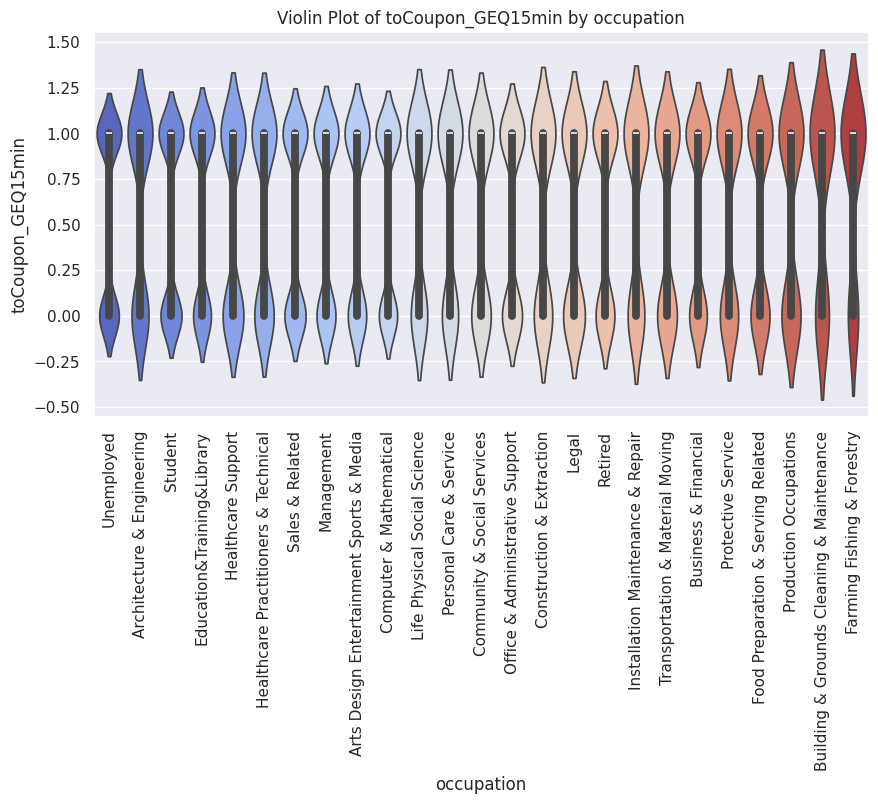


📌 **ANOVA Test:** F-Statistic = 0.7848, P-Value = 0.7606
❌ **No significant difference.**

🔹 **Analyzing toCoupon_GEQ15min vs income**

📊 **Descriptive Statistics**:
                   count      mean       std  min  25%  50%  75%  max
income                                                               
$100000 or More   1688.0  0.563981  0.496036  0.0  0.0  1.0  1.0  1.0
$12500 - $24999   1795.0  0.548189  0.497811  0.0  0.0  1.0  1.0  1.0
$25000 - $37499   1972.0  0.565923  0.495761  0.0  0.0  1.0  1.0  1.0
$37500 - $49999   1760.0  0.561364  0.496361  0.0  0.0  1.0  1.0  1.0
$50000 - $62499   1624.0  0.570197  0.495200  0.0  0.0  1.0  1.0  1.0
$62500 - $74999    832.0  0.576923  0.494345  0.0  0.0  1.0  1.0  1.0
$75000 - $87499    844.0  0.566351  0.495872  0.0  0.0  1.0  1.0  1.0
$87500 - $99999    865.0  0.596532  0.490877  0.0  0.0  1.0  1.0  1.0
Less than $12500  1013.0  0.538006  0.498800  0.0  0.0  1.0  1.0  1.0


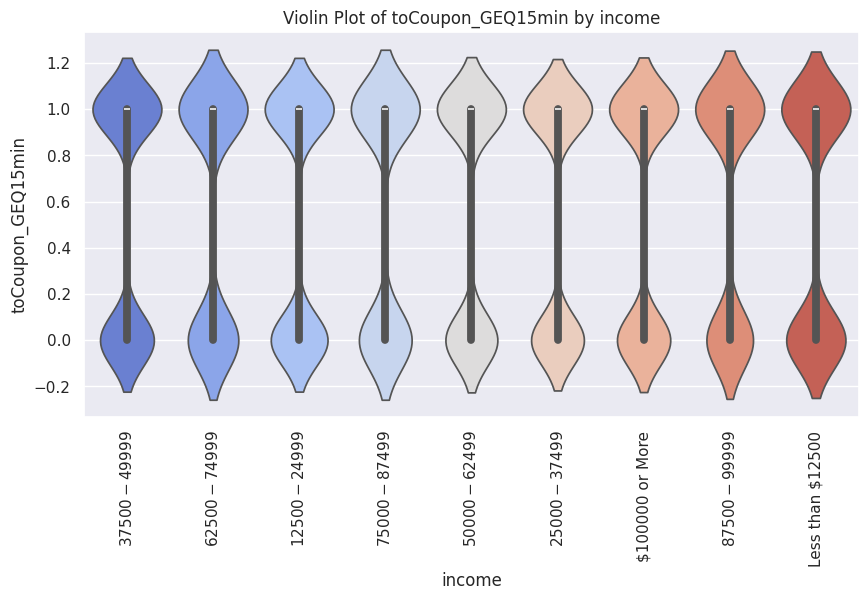


📌 **ANOVA Test:** F-Statistic = 1.1549, P-Value = 0.3226
❌ **No significant difference.**

🔹 **Analyzing toCoupon_GEQ15min vs Bar**

📊 **Descriptive Statistics**:
        count      mean       std  min  25%  50%  75%  max
Bar                                                       
1~3    2432.0  0.547286  0.497861  0.0  0.0  1.0  1.0  1.0
4~8    1045.0  0.564593  0.496048  0.0  0.0  1.0  1.0  1.0
gt8     338.0  0.520710  0.500312  0.0  0.0  1.0  1.0  1.0
less1  3383.0  0.559267  0.496548  0.0  0.0  1.0  1.0  1.0
never  5195.0  0.576708  0.494128  0.0  0.0  1.0  1.0  1.0


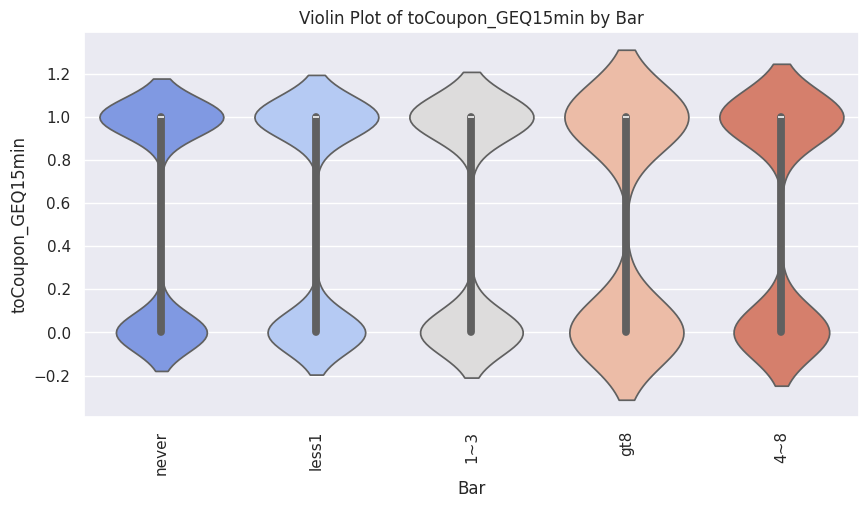


📌 **ANOVA Test:** F-Statistic = 2.2636, P-Value = 0.0598
❌ **No significant difference.**

🔹 **Analyzing toCoupon_GEQ15min vs CoffeeHouse**

📊 **Descriptive Statistics**:
              count      mean       std  min  25%  50%  75%  max
CoffeeHouse                                                     
1~3          3138.0  0.570427  0.495094  0.0  0.0  1.0  1.0  1.0
4~8          1752.0  0.564498  0.495964  0.0  0.0  1.0  1.0  1.0
gt8          1083.0  0.557710  0.496888  0.0  0.0  1.0  1.0  1.0
less1        3525.0  0.555177  0.497017  0.0  0.0  1.0  1.0  1.0
never        2895.0  0.568221  0.495410  0.0  0.0  1.0  1.0  1.0


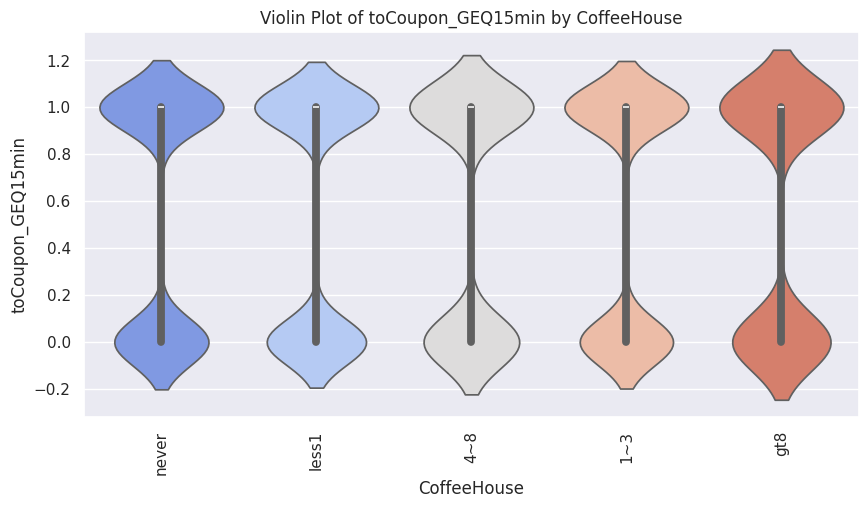


📌 **ANOVA Test:** F-Statistic = 0.5052, P-Value = 0.7319
❌ **No significant difference.**

🔹 **Analyzing toCoupon_GEQ15min vs CarryAway**

📊 **Descriptive Statistics**:
            count      mean       std  min  25%  50%  75%  max
CarryAway                                                     
1~3        4719.0  0.562831  0.496089  0.0  0.0  1.0  1.0  1.0
4~8        4171.0  0.565092  0.495804  0.0  0.0  1.0  1.0  1.0
gt8        1535.0  0.551140  0.497540  0.0  0.0  1.0  1.0  1.0
less1      1819.0  0.570093  0.495199  0.0  0.0  1.0  1.0  1.0
never       149.0  0.597315  0.492092  0.0  0.0  1.0  1.0  1.0


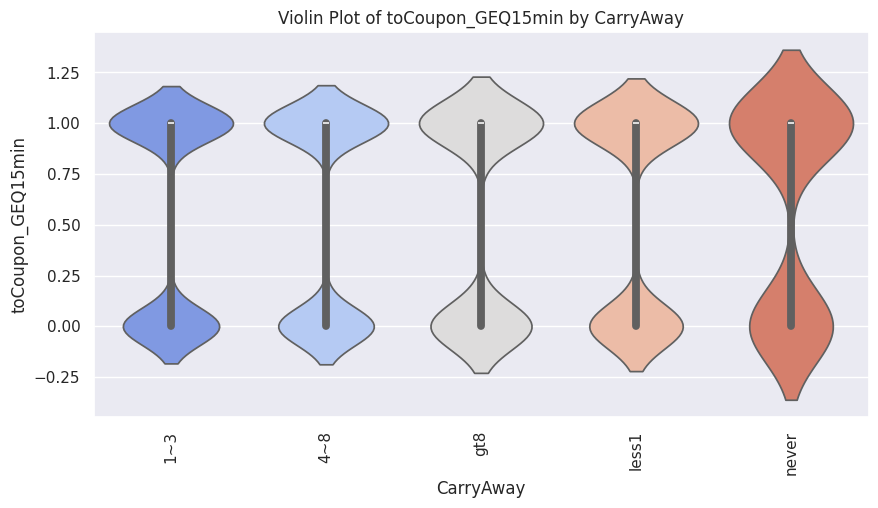


📌 **ANOVA Test:** F-Statistic = 0.5045, P-Value = 0.7324
❌ **No significant difference.**

🔹 **Analyzing toCoupon_GEQ15min vs RestaurantLessThan20**

📊 **Descriptive Statistics**:
                       count      mean       std  min  25%  50%  75%  max
RestaurantLessThan20                                                     
1~3                   5397.0  0.562349  0.496143  0.0  0.0  1.0  1.0  1.0
4~8                   3493.0  0.563126  0.496070  0.0  0.0  1.0  1.0  1.0
gt8                   1253.0  0.552275  0.497458  0.0  0.0  1.0  1.0  1.0
less1                 2034.0  0.574238  0.494580  0.0  0.0  1.0  1.0  1.0
never                  216.0  0.569444  0.496304  0.0  0.0  1.0  1.0  1.0


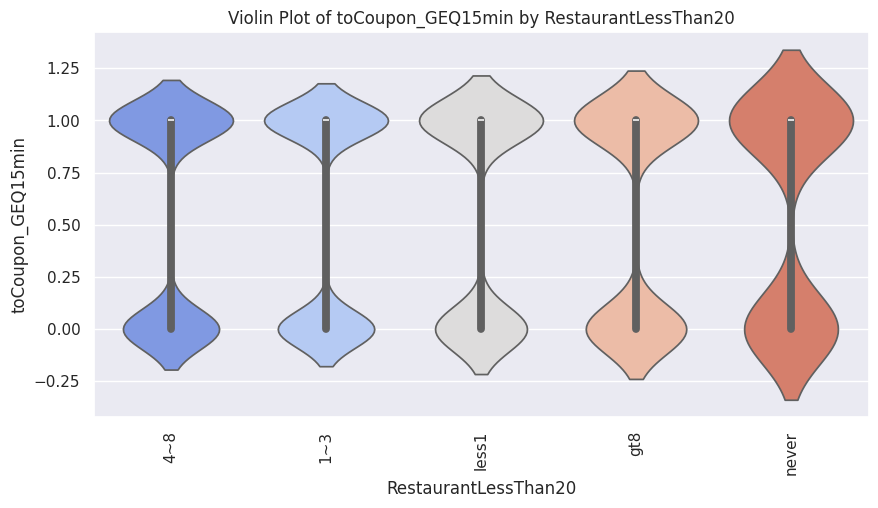


📌 **ANOVA Test:** F-Statistic = 0.4141, P-Value = 0.7986
❌ **No significant difference.**

🔹 **Analyzing toCoupon_GEQ15min vs Restaurant20To50**

📊 **Descriptive Statistics**:
                   count      mean       std  min  25%  50%  75%  max
Restaurant20To50                                                     
1~3               3204.0  0.567416  0.495512  0.0  0.0  1.0  1.0  1.0
4~8                718.0  0.548747  0.497965  0.0  0.0  1.0  1.0  1.0
gt8                254.0  0.531496  0.499992  0.0  0.0  1.0  1.0  1.0
less1             6134.0  0.565047  0.495791  0.0  0.0  1.0  1.0  1.0
never             2083.0  0.562650  0.496179  0.0  0.0  1.0  1.0  1.0


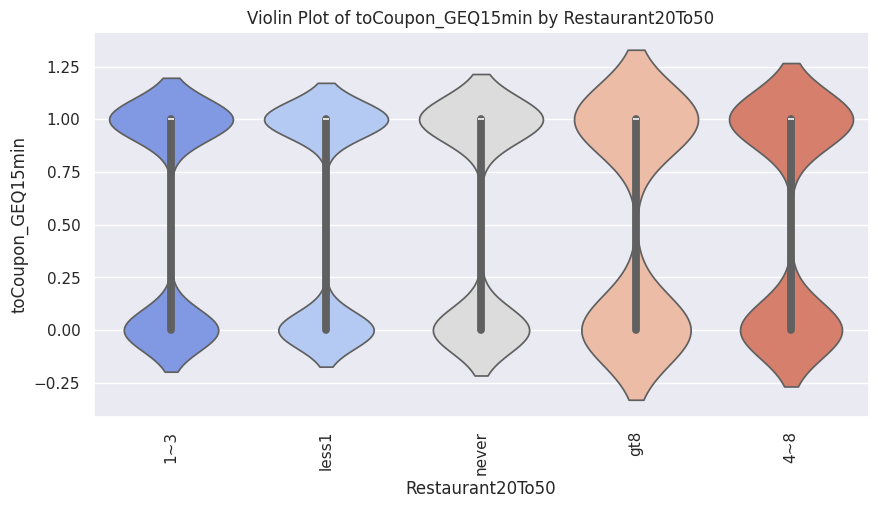


📌 **ANOVA Test:** F-Statistic = 0.4894, P-Value = 0.7436
❌ **No significant difference.**

🔹 **Analyzing toCoupon_GEQ25min vs destination**

📊 **Descriptive Statistics**:
                  count     mean       std  min  25%  50%  75%  max
destination                                                        
Home             3161.0  0.14932  0.356460  0.0  0.0  0.0  0.0  1.0
No Urgent Place  6118.0  0.00000  0.000000  0.0  0.0  0.0  0.0  0.0
Work             3114.0  0.31824  0.465868  0.0  0.0  0.0  1.0  1.0


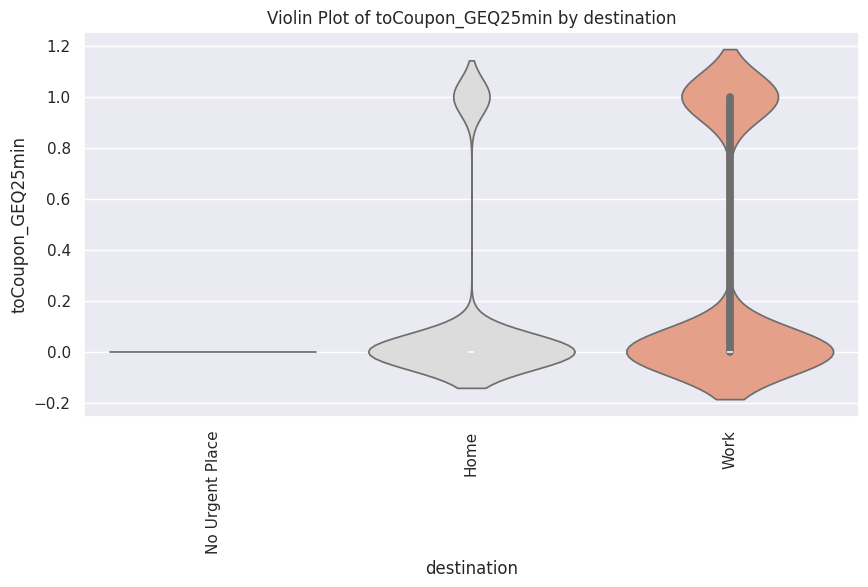


📌 **ANOVA Test:** F-Statistic = 1225.8761, P-Value = 0.0000
✅ **Significant Relationship (p < 0.05)!**

🔹 **Analyzing toCoupon_GEQ25min vs passanger**

📊 **Descriptive Statistics**:
            count      mean       std  min  25%  50%  75%  max
passanger                                                     
Alone      7178.0  0.191836  0.393772  0.0  0.0  0.0  0.0  1.0
Friend(s)  3166.0  0.000000  0.000000  0.0  0.0  0.0  0.0  0.0
Kid(s)      981.0  0.006116  0.078006  0.0  0.0  0.0  0.0  1.0
Partner    1068.0  0.074906  0.263364  0.0  0.0  0.0  0.0  1.0


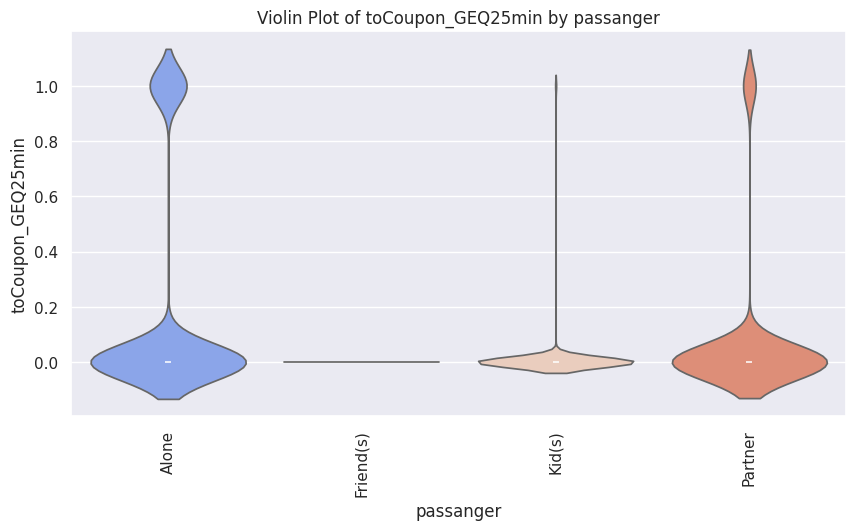


📌 **ANOVA Test:** F-Statistic = 337.4870, P-Value = 0.0000
✅ **Significant Relationship (p < 0.05)!**

🔹 **Analyzing toCoupon_GEQ25min vs weather**

📊 **Descriptive Statistics**:
          count      mean       std  min  25%  50%  75%  max
weather                                                     
Rainy    1202.0  0.238769  0.426509  0.0  0.0  0.0  0.0  1.0
Snowy    1329.0  0.302483  0.459506  0.0  0.0  0.0  1.0  1.0
Sunny    9862.0  0.078483  0.268944  0.0  0.0  0.0  0.0  1.0


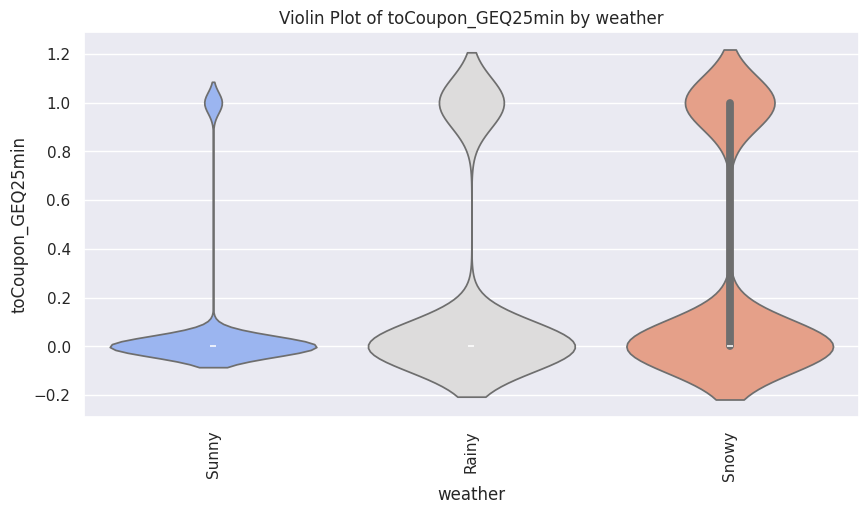


📌 **ANOVA Test:** F-Statistic = 399.4777, P-Value = 0.0000
✅ **Significant Relationship (p < 0.05)!**

🔹 **Analyzing toCoupon_GEQ25min vs coupon**

📊 **Descriptive Statistics**:
                        count      mean       std  min  25%  50%  75%  max
coupon                                                                    
Bar                    2010.0  0.253731  0.435254  0.0  0.0  0.0  1.0  1.0
Carry out & Take away  2275.0  0.097582  0.296814  0.0  0.0  0.0  0.0  1.0
Coffee House           3913.0  0.079223  0.270121  0.0  0.0  0.0  0.0  1.0
Restaurant(20-50)      1487.0  0.076664  0.266148  0.0  0.0  0.0  0.0  1.0
Restaurant(<20)        2708.0  0.113368  0.317100  0.0  0.0  0.0  0.0  1.0


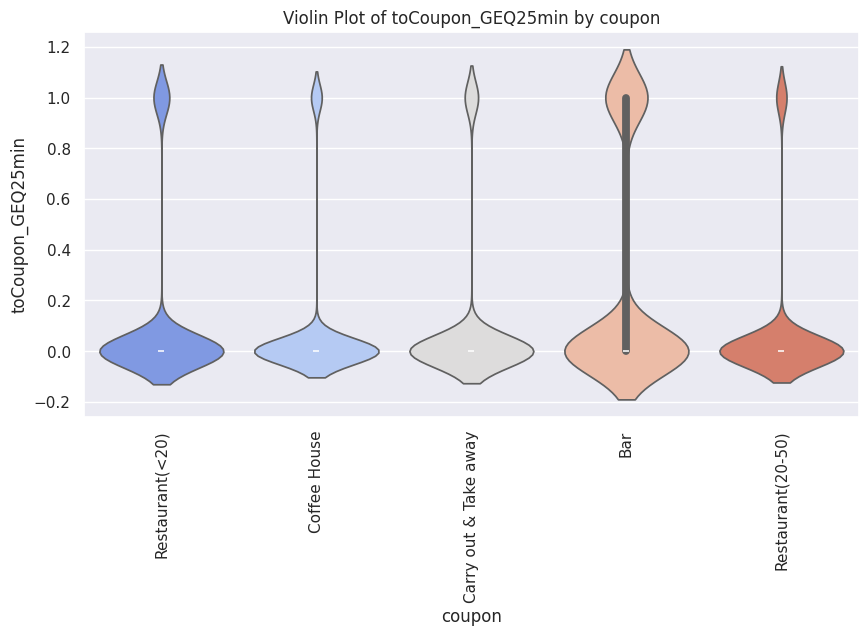


📌 **ANOVA Test:** F-Statistic = 115.6832, P-Value = 0.0000
✅ **Significant Relationship (p < 0.05)!**

🔹 **Analyzing toCoupon_GEQ25min vs expiration**

📊 **Descriptive Statistics**:
             count      mean       std  min  25%  50%  75%  max
expiration                                                     
1d          6938.0  0.124964  0.330702  0.0  0.0  0.0  0.0  1.0
2h          5455.0  0.109258  0.311991  0.0  0.0  0.0  0.0  1.0


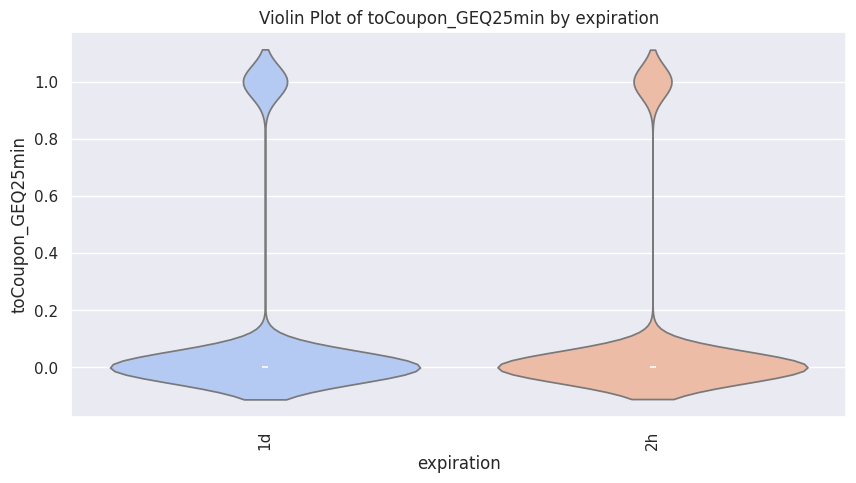


📌 **ANOVA Test:** F-Statistic = 7.2390, P-Value = 0.0071
✅ **Significant Relationship (p < 0.05)!**

🔹 **Analyzing toCoupon_GEQ25min vs gender**

📊 **Descriptive Statistics**:
         count      mean       std  min  25%  50%  75%  max
gender                                                     
Female  6355.0  0.116601  0.320970  0.0  0.0  0.0  0.0  1.0
Male    6038.0  0.119576  0.324492  0.0  0.0  0.0  0.0  1.0


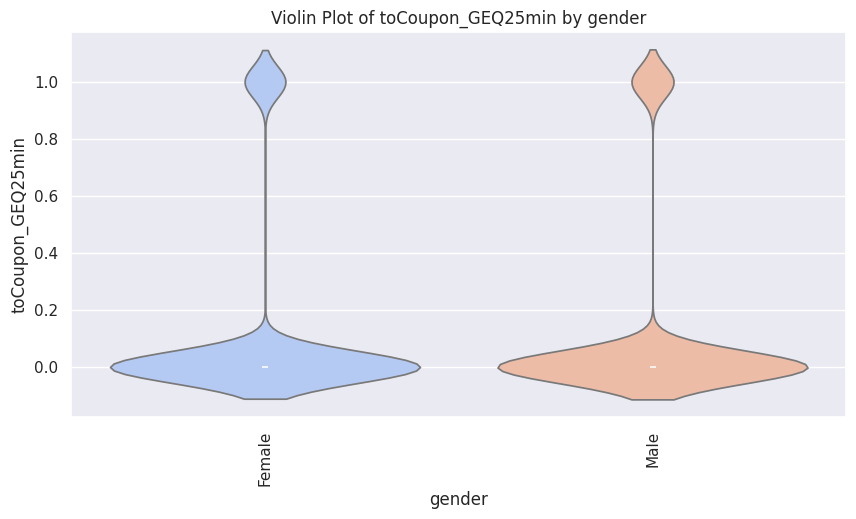


📌 **ANOVA Test:** F-Statistic = 0.2632, P-Value = 0.6080
❌ **No significant difference.**

🔹 **Analyzing toCoupon_GEQ25min vs age**

📊 **Descriptive Statistics**:
          count      mean       std  min  25%  50%  75%  max
age                                                         
21       2598.0  0.117783  0.322413  0.0  0.0  0.0  0.0  1.0
26       2486.0  0.122285  0.327680  0.0  0.0  0.0  0.0  1.0
31       1984.0  0.116935  0.321424  0.0  0.0  0.0  0.0  1.0
36       1293.0  0.115236  0.319430  0.0  0.0  0.0  0.0  1.0
41       1079.0  0.109361  0.312236  0.0  0.0  0.0  0.0  1.0
46        660.0  0.115152  0.319447  0.0  0.0  0.0  0.0  1.0
50plus   1756.0  0.121298  0.326567  0.0  0.0  0.0  0.0  1.0
below21   537.0  0.121043  0.326481  0.0  0.0  0.0  0.0  1.0


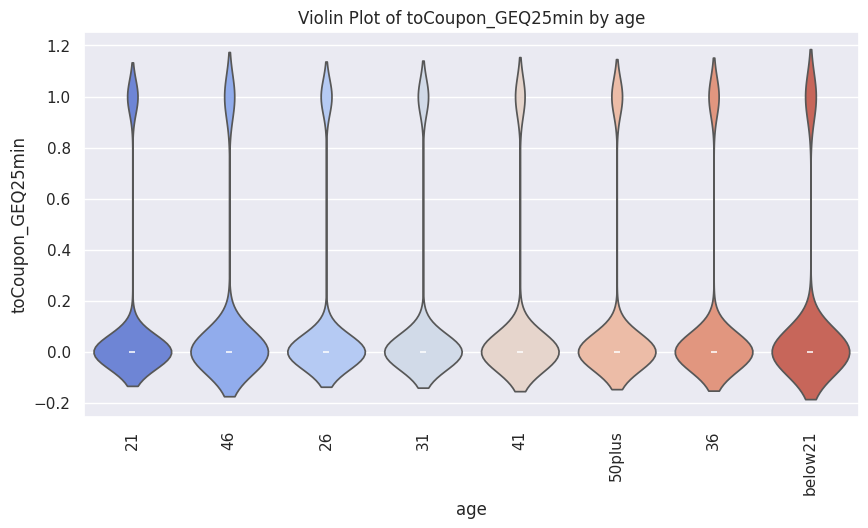


📌 **ANOVA Test:** F-Statistic = 0.2302, P-Value = 0.9782
❌ **No significant difference.**

🔹 **Analyzing toCoupon_GEQ25min vs maritalStatus**

📊 **Descriptive Statistics**:
                    count      mean       std  min  25%  50%  75%  max
maritalStatus                                                         
Divorced            505.0  0.120792  0.326209  0.0  0.0  0.0  0.0  1.0
Married partner    4994.0  0.112535  0.316055  0.0  0.0  0.0  0.0  1.0
Single             4610.0  0.125380  0.331185  0.0  0.0  0.0  0.0  1.0
Unmarried partner  2155.0  0.114617  0.318633  0.0  0.0  0.0  0.0  1.0
Widowed             129.0  0.116279  0.321809  0.0  0.0  0.0  0.0  1.0


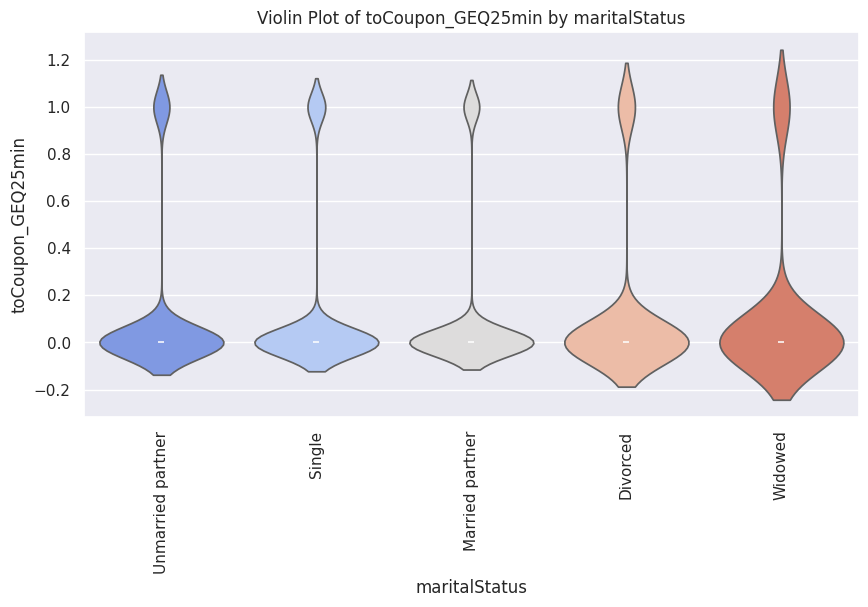


📌 **ANOVA Test:** F-Statistic = 1.0304, P-Value = 0.3898
❌ **No significant difference.**

🔹 **Analyzing toCoupon_GEQ25min vs education**

📊 **Descriptive Statistics**:
                                         count      mean       std  min  25%  \
education                                                                      
Associates degree                       1126.0  0.125222  0.331118  0.0  0.0   
Bachelors degree                        4247.0  0.118907  0.323718  0.0  0.0   
Graduate degree (Masters or Doctorate)  1793.0  0.119911  0.324948  0.0  0.0   
High School Graduate                     880.0  0.126136  0.332192  0.0  0.0   
Some High School                          87.0  0.126437  0.334268  0.0  0.0   
Some college - no degree                4260.0  0.112676  0.316234  0.0  0.0   

                                        50%  75%  max  
education                                              
Associates degree                       0.0  0.0  1.0  
Bachelors degree     

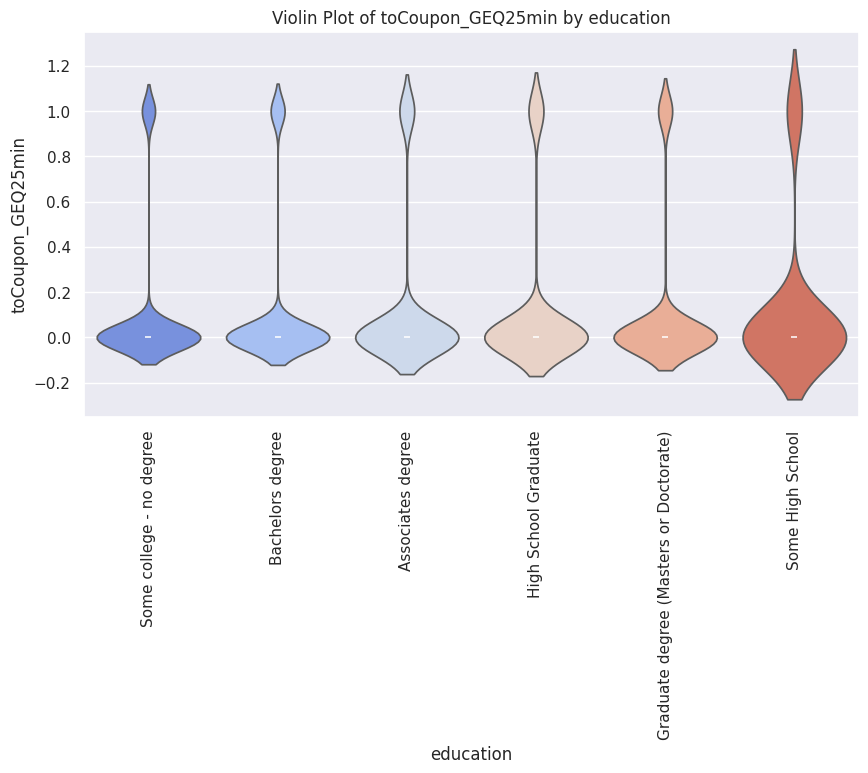


📌 **ANOVA Test:** F-Statistic = 0.4877, P-Value = 0.7857
❌ **No significant difference.**

🔹 **Analyzing toCoupon_GEQ25min vs occupation**

📊 **Descriptive Statistics**:
                                            count      mean       std  min  \
occupation                                                                   
Architecture & Engineering                  172.0  0.110465  0.314384  0.0   
Arts Design Entertainment Sports & Media    617.0  0.108590  0.311376  0.0   
Building & Grounds Cleaning & Maintenance    42.0  0.142857  0.354169  0.0   
Business & Financial                        536.0  0.125000  0.331028  0.0   
Community & Social Services                 236.0  0.131356  0.338507  0.0   
Computer & Mathematical                    1360.0  0.114706  0.318784  0.0   
Construction & Extraction                   150.0  0.120000  0.326050  0.0   
Education&Training&Library                  921.0  0.110749  0.313992  0.0   
Farming Fishing & Forestry                   41.0

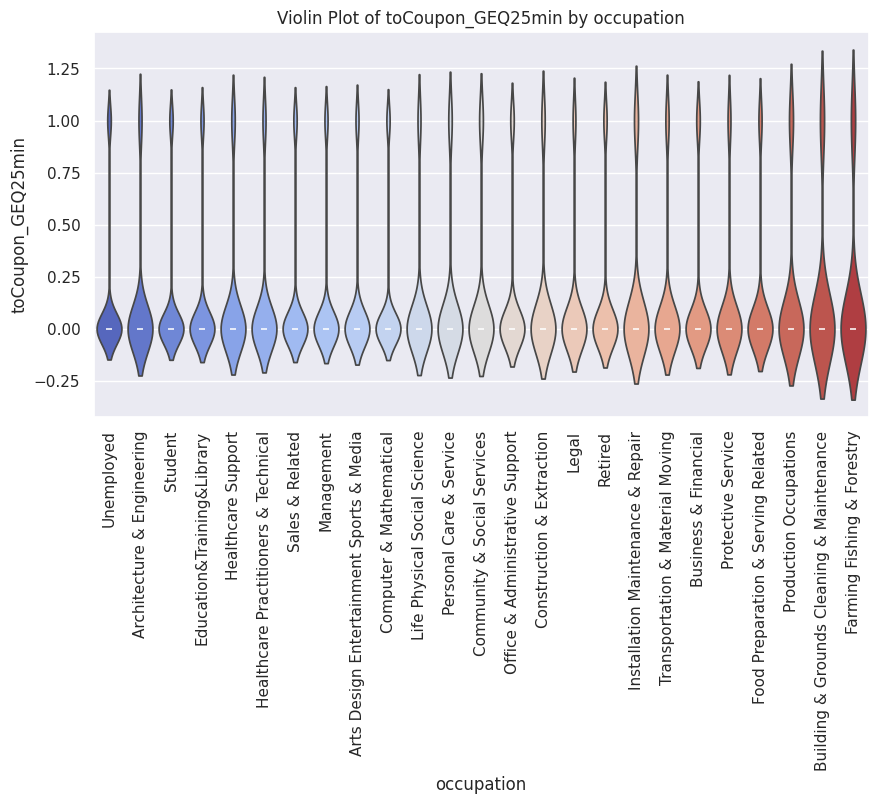


📌 **ANOVA Test:** F-Statistic = 0.2705, P-Value = 0.9999
❌ **No significant difference.**

🔹 **Analyzing toCoupon_GEQ25min vs income**

📊 **Descriptive Statistics**:
                   count      mean       std  min  25%  50%  75%  max
income                                                               
$100000 or More   1688.0  0.116706  0.321165  0.0  0.0  0.0  0.0  1.0
$12500 - $24999   1795.0  0.118663  0.323482  0.0  0.0  0.0  0.0  1.0
$25000 - $37499   1972.0  0.115112  0.319237  0.0  0.0  0.0  0.0  1.0
$37500 - $49999   1760.0  0.122159  0.327563  0.0  0.0  0.0  0.0  1.0
$50000 - $62499   1624.0  0.114532  0.318554  0.0  0.0  0.0  0.0  1.0
$62500 - $74999    832.0  0.120192  0.325382  0.0  0.0  0.0  0.0  1.0
$75000 - $87499    844.0  0.118483  0.323371  0.0  0.0  0.0  0.0  1.0
$87500 - $99999    865.0  0.114451  0.318542  0.0  0.0  0.0  0.0  1.0
Less than $12500  1013.0  0.124383  0.330181  0.0  0.0  0.0  0.0  1.0


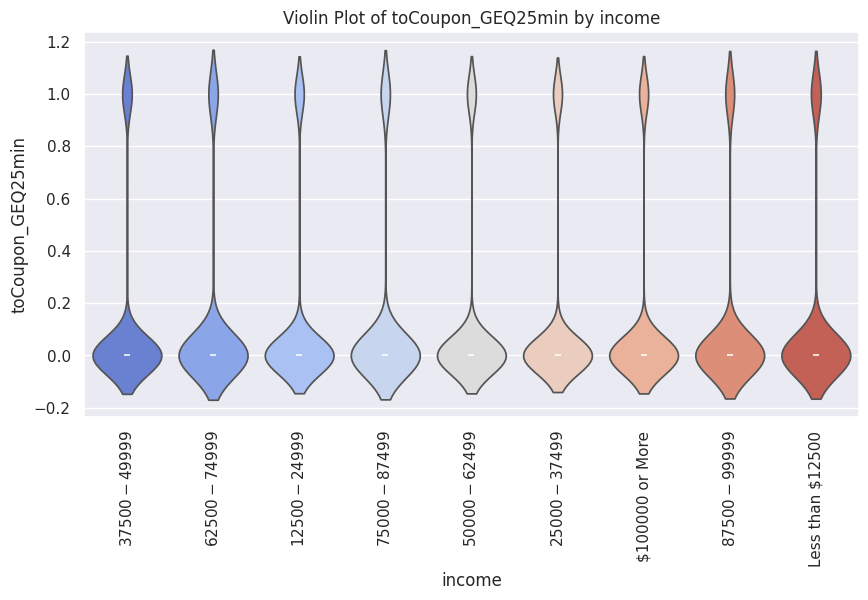


📌 **ANOVA Test:** F-Statistic = 0.1516, P-Value = 0.9965
❌ **No significant difference.**

🔹 **Analyzing toCoupon_GEQ25min vs Bar**

📊 **Descriptive Statistics**:
        count      mean       std  min  25%  50%  75%  max
Bar                                                       
1~3    2432.0  0.112253  0.315743  0.0  0.0  0.0  0.0  1.0
4~8    1045.0  0.129187  0.335567  0.0  0.0  0.0  0.0  1.0
gt8     338.0  0.106509  0.308945  0.0  0.0  0.0  0.0  1.0
less1  3383.0  0.119716  0.324677  0.0  0.0  0.0  0.0  1.0
never  5195.0  0.118191  0.322865  0.0  0.0  0.0  0.0  1.0


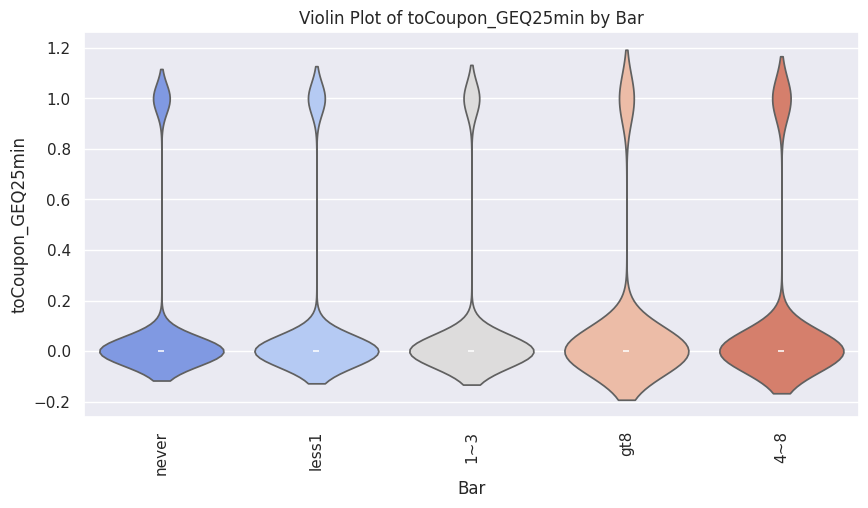


📌 **ANOVA Test:** F-Statistic = 0.6382, P-Value = 0.6352
❌ **No significant difference.**

🔹 **Analyzing toCoupon_GEQ25min vs CoffeeHouse**

📊 **Descriptive Statistics**:
              count      mean       std  min  25%  50%  75%  max
CoffeeHouse                                                     
1~3          3138.0  0.115041  0.319123  0.0  0.0  0.0  0.0  1.0
4~8          1752.0  0.125571  0.331460  0.0  0.0  0.0  0.0  1.0
gt8          1083.0  0.116343  0.320785  0.0  0.0  0.0  0.0  1.0
less1        3525.0  0.115461  0.319623  0.0  0.0  0.0  0.0  1.0
never        2895.0  0.120553  0.325663  0.0  0.0  0.0  0.0  1.0


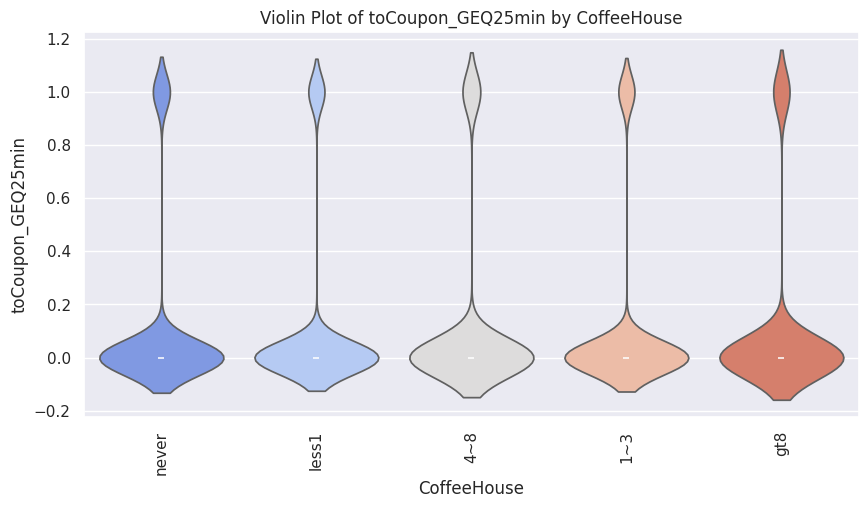


📌 **ANOVA Test:** F-Statistic = 0.4139, P-Value = 0.7988
❌ **No significant difference.**

🔹 **Analyzing toCoupon_GEQ25min vs CarryAway**

📊 **Descriptive Statistics**:
            count      mean       std  min  25%  50%  75%  max
CarryAway                                                     
1~3        4719.0  0.117822  0.322431  0.0  0.0  0.0  0.0  1.0
4~8        4171.0  0.116279  0.320598  0.0  0.0  0.0  0.0  1.0
gt8        1535.0  0.117264  0.321839  0.0  0.0  0.0  0.0  1.0
less1      1819.0  0.123145  0.328693  0.0  0.0  0.0  0.0  1.0
never       149.0  0.120805  0.327000  0.0  0.0  0.0  0.0  1.0


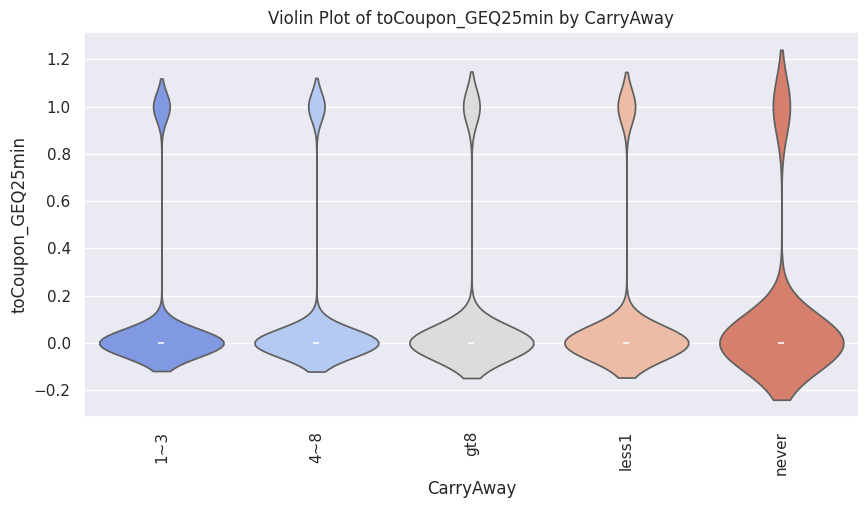


📌 **ANOVA Test:** F-Statistic = 0.1503, P-Value = 0.9629
❌ **No significant difference.**

🔹 **Analyzing toCoupon_GEQ25min vs RestaurantLessThan20**

📊 **Descriptive Statistics**:
                       count      mean       std  min  25%  50%  75%  max
RestaurantLessThan20                                                     
1~3                   5397.0  0.120437  0.325502  0.0  0.0  0.0  0.0  1.0
4~8                   3493.0  0.115087  0.319173  0.0  0.0  0.0  0.0  1.0
gt8                   1253.0  0.111732  0.315162  0.0  0.0  0.0  0.0  1.0
less1                 2034.0  0.120944  0.326142  0.0  0.0  0.0  0.0  1.0
never                  216.0  0.115741  0.320657  0.0  0.0  0.0  0.0  1.0


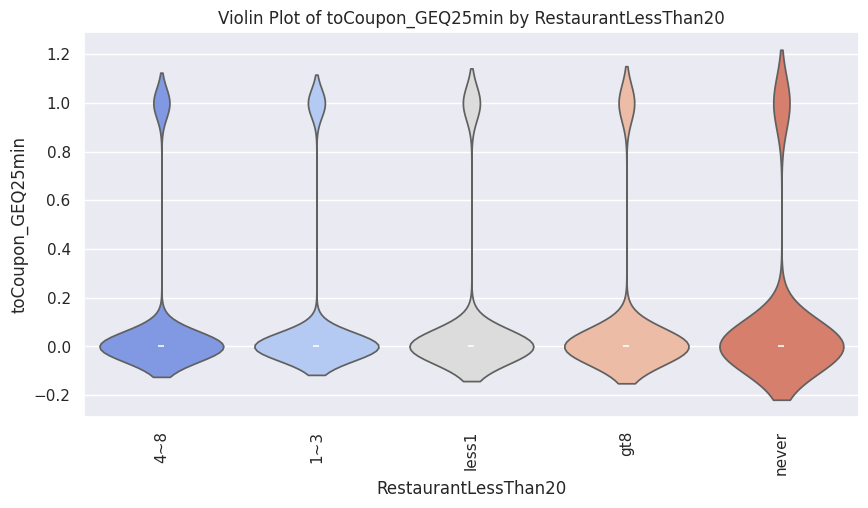


📌 **ANOVA Test:** F-Statistic = 0.3112, P-Value = 0.8707
❌ **No significant difference.**

🔹 **Analyzing toCoupon_GEQ25min vs Restaurant20To50**

📊 **Descriptive Statistics**:
                   count      mean       std  min  25%  50%  75%  max
Restaurant20To50                                                     
1~3               3204.0  0.117353  0.321891  0.0  0.0  0.0  0.0  1.0
4~8                718.0  0.110028  0.313143  0.0  0.0  0.0  0.0  1.0
gt8                254.0  0.114173  0.318649  0.0  0.0  0.0  0.0  1.0
less1             6134.0  0.117542  0.322091  0.0  0.0  0.0  0.0  1.0
never             2083.0  0.123860  0.329501  0.0  0.0  0.0  0.0  1.0


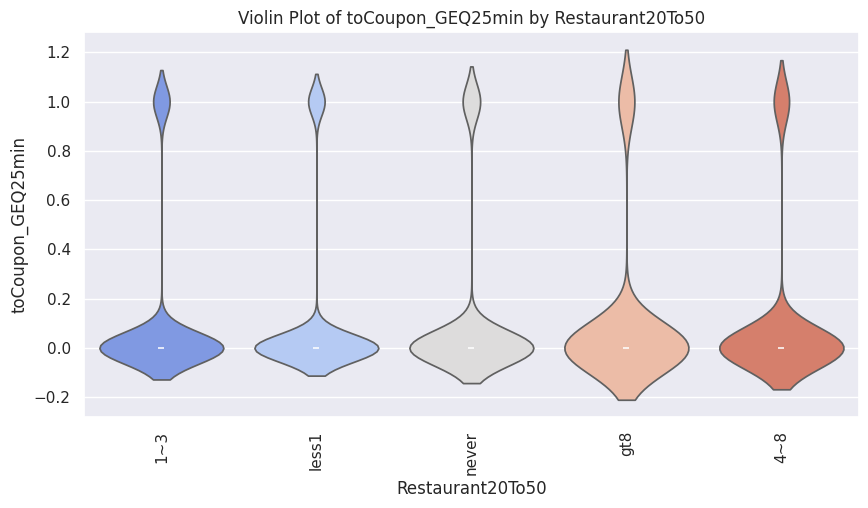


📌 **ANOVA Test:** F-Statistic = 0.2964, P-Value = 0.8805
❌ **No significant difference.**

🔹 **Analyzing direction_same vs destination**

📊 **Descriptive Statistics**:
                  count      mean       std  min  25%  50%  75%  max
destination                                                         
Home             3161.0  0.459032  0.498398  0.0  0.0  0.0  1.0  1.0
No Urgent Place  6118.0  0.000000  0.000000  0.0  0.0  0.0  0.0  0.0
Work             3114.0  0.384714  0.486606  0.0  0.0  0.0  1.0  1.0


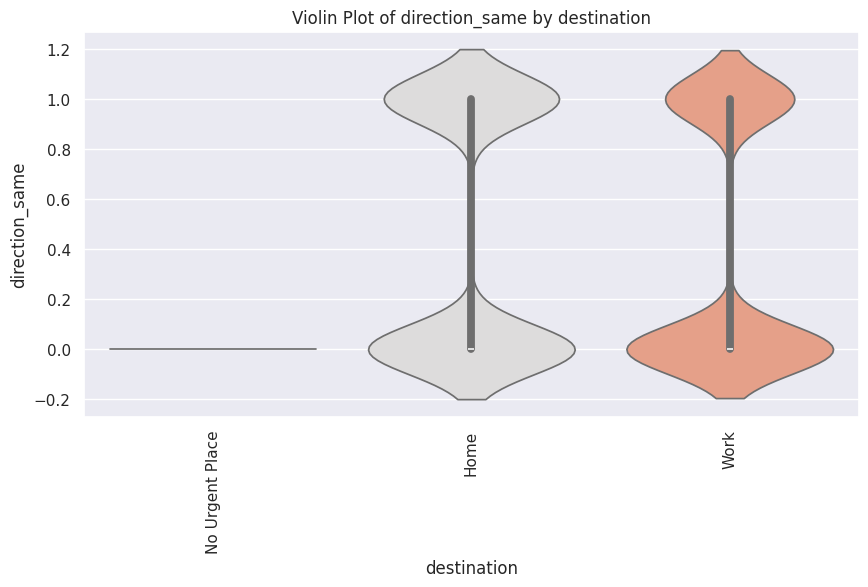


📌 **ANOVA Test:** F-Statistic = 2282.2144, P-Value = 0.0000
✅ **Significant Relationship (p < 0.05)!**

🔹 **Analyzing direction_same vs passanger**

📊 **Descriptive Statistics**:
            count      mean       std  min  25%  50%  75%  max
passanger                                                     
Alone      7178.0  0.342992  0.474742  0.0  0.0  0.0  1.0  1.0
Friend(s)  3166.0  0.000000  0.000000  0.0  0.0  0.0  0.0  0.0
Kid(s)      981.0  0.050968  0.220045  0.0  0.0  0.0  0.0  1.0
Partner    1068.0  0.128277  0.334555  0.0  0.0  0.0  0.0  1.0


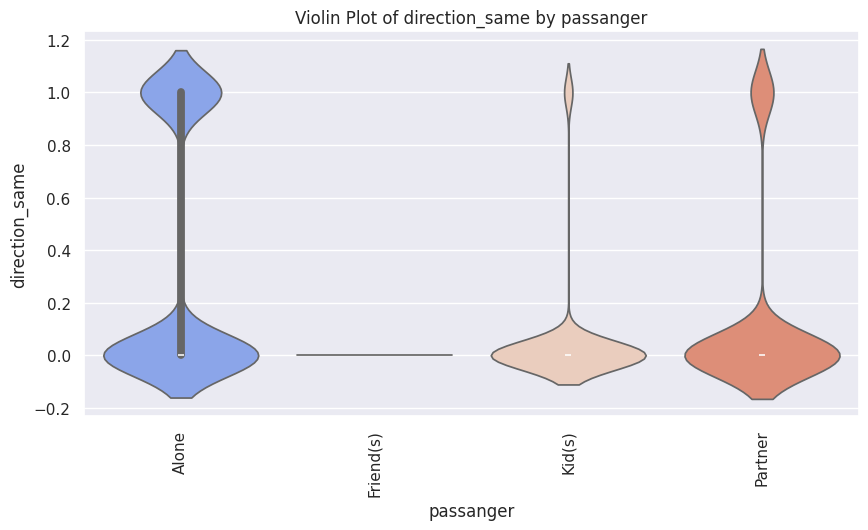


📌 **ANOVA Test:** F-Statistic = 690.4576, P-Value = 0.0000
✅ **Significant Relationship (p < 0.05)!**

🔹 **Analyzing direction_same vs weather**

📊 **Descriptive Statistics**:
          count      mean       std  min  25%  50%  75%  max
weather                                                     
Rainy    1202.0  0.238769  0.426509  0.0  0.0  0.0  0.0  1.0
Snowy    1329.0  0.142212  0.349399  0.0  0.0  0.0  0.0  1.0
Sunny    9862.0  0.220341  0.414497  0.0  0.0  0.0  0.0  1.0


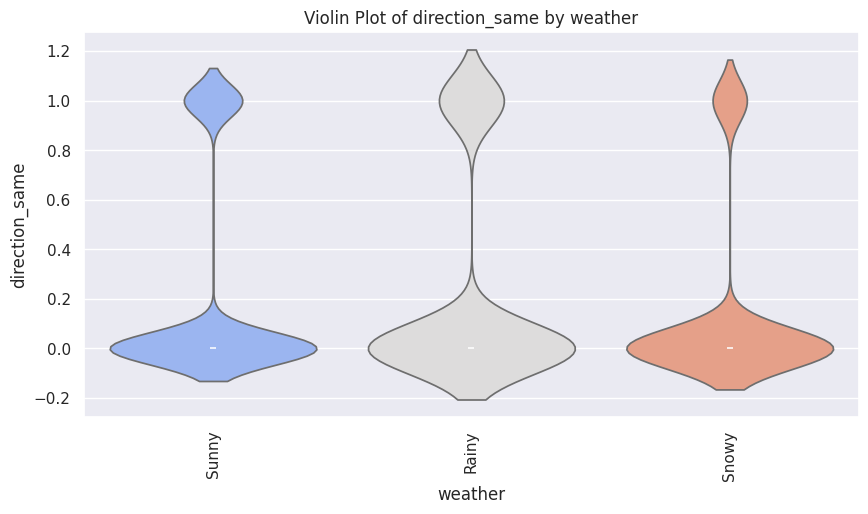


📌 **ANOVA Test:** F-Statistic = 23.8333, P-Value = 0.0000
✅ **Significant Relationship (p < 0.05)!**

🔹 **Analyzing direction_same vs coupon**

📊 **Descriptive Statistics**:
                        count      mean       std  min  25%  50%  75%  max
coupon                                                                    
Bar                    2010.0  0.208955  0.406664  0.0  0.0  0.0  0.0  1.0
Carry out & Take away  2275.0  0.348132  0.476483  0.0  0.0  0.0  1.0  1.0
Coffee House           3913.0  0.191413  0.393464  0.0  0.0  0.0  0.0  1.0
Restaurant(20-50)      1487.0  0.172831  0.378228  0.0  0.0  0.0  0.0  1.0
Restaurant(<20)        2708.0  0.159158  0.365891  0.0  0.0  0.0  0.0  1.0


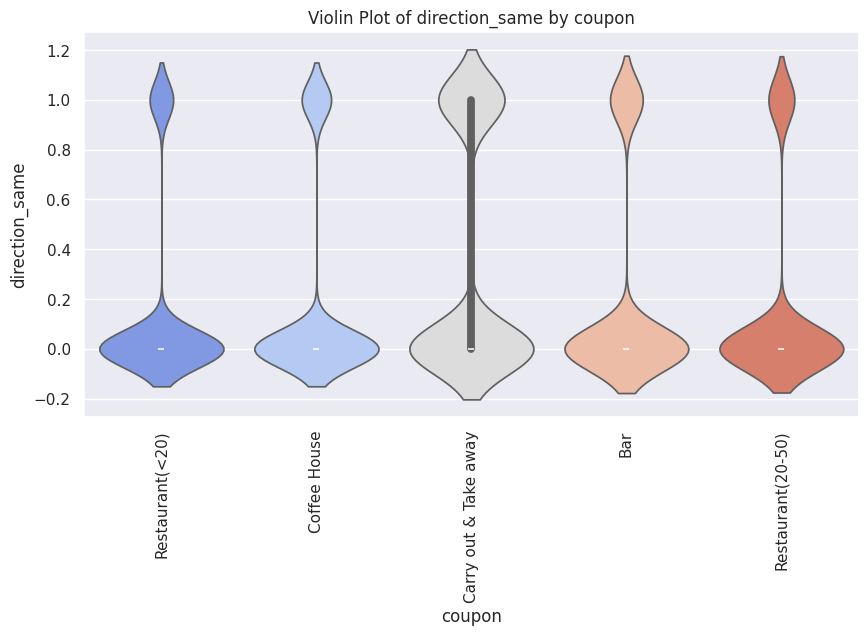


📌 **ANOVA Test:** F-Statistic = 81.8719, P-Value = 0.0000
✅ **Significant Relationship (p < 0.05)!**

🔹 **Analyzing direction_same vs expiration**

📊 **Descriptive Statistics**:
             count      mean       std  min  25%  50%  75%  max
expiration                                                     
1d          6938.0  0.206544  0.404854  0.0  0.0  0.0  0.0  1.0
2h          5455.0  0.222915  0.416240  0.0  0.0  0.0  0.0  1.0


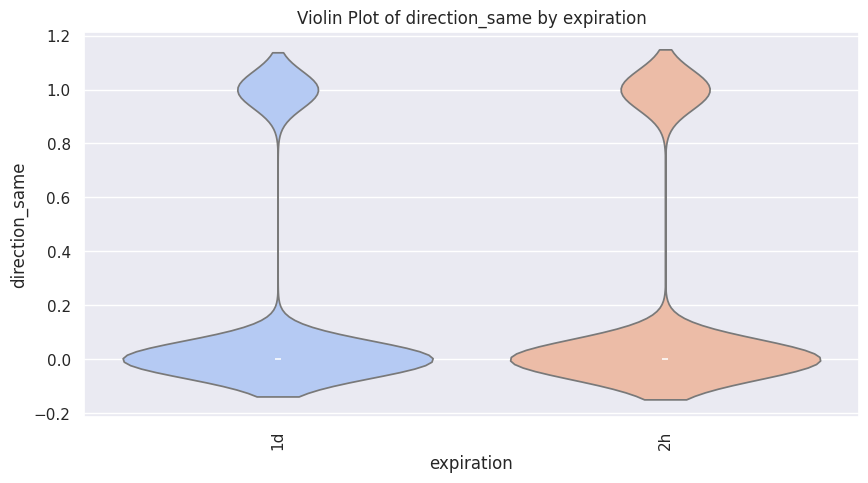


📌 **ANOVA Test:** F-Statistic = 4.8713, P-Value = 0.0273
✅ **Significant Relationship (p < 0.05)!**

🔹 **Analyzing direction_same vs gender**

📊 **Descriptive Statistics**:
         count      mean       std  min  25%  50%  75%  max
gender                                                     
Female  6355.0  0.214634  0.410601  0.0  0.0  0.0  0.0  1.0
Male    6038.0  0.212819  0.409334  0.0  0.0  0.0  0.0  1.0


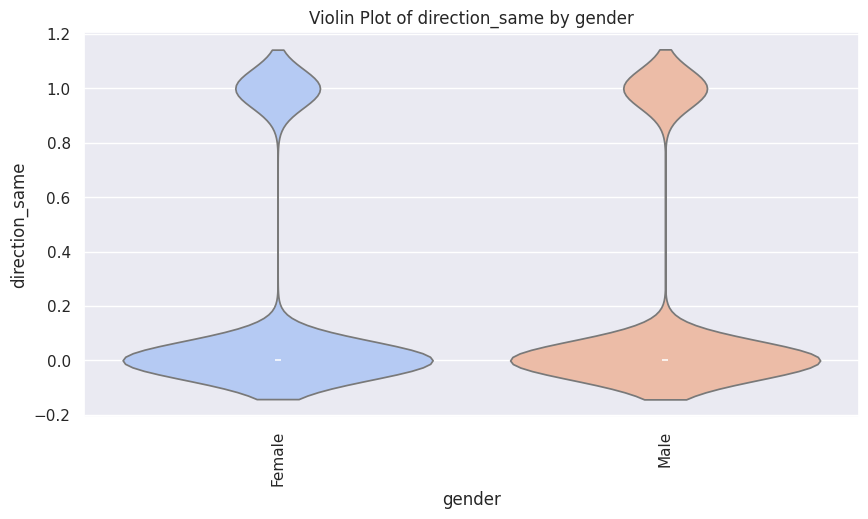


📌 **ANOVA Test:** F-Statistic = 0.0607, P-Value = 0.8054
❌ **No significant difference.**

🔹 **Analyzing direction_same vs age**

📊 **Descriptive Statistics**:
          count      mean       std  min  25%  50%  75%  max
age                                                         
21       2598.0  0.220939  0.414959  0.0  0.0  0.0  0.0  1.0
26       2486.0  0.214803  0.410768  0.0  0.0  0.0  0.0  1.0
31       1984.0  0.222278  0.415882  0.0  0.0  0.0  0.0  1.0
36       1293.0  0.215777  0.411520  0.0  0.0  0.0  0.0  1.0
41       1079.0  0.185357  0.388767  0.0  0.0  0.0  0.0  1.0
46        660.0  0.181818  0.385987  0.0  0.0  0.0  0.0  1.0
50plus   1756.0  0.202733  0.402150  0.0  0.0  0.0  0.0  1.0
below21   537.0  0.270019  0.444383  0.0  0.0  0.0  1.0  1.0


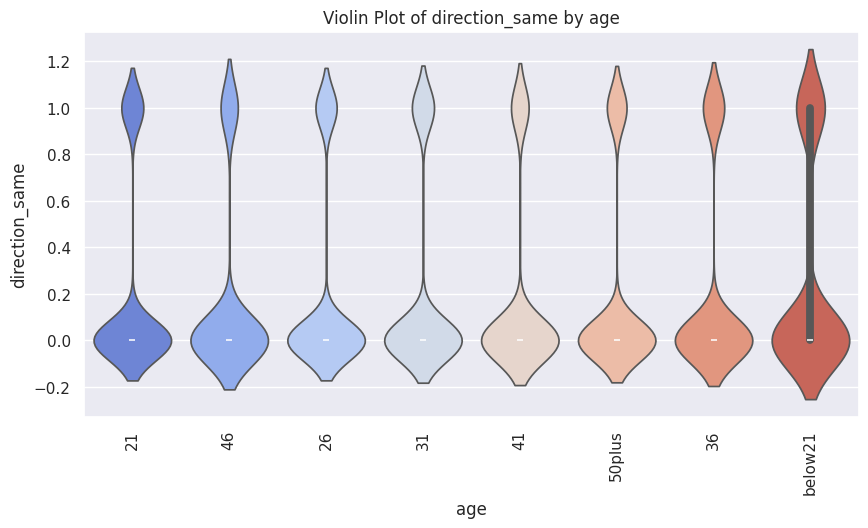


📌 **ANOVA Test:** F-Statistic = 3.1852, P-Value = 0.0023
✅ **Significant Relationship (p < 0.05)!**

🔹 **Analyzing direction_same vs maritalStatus**

📊 **Descriptive Statistics**:
                    count      mean       std  min  25%  50%  75%  max
maritalStatus                                                         
Divorced            505.0  0.231683  0.422326  0.0  0.0  0.0  0.0  1.0
Married partner    4994.0  0.200441  0.400370  0.0  0.0  0.0  0.0  1.0
Single             4610.0  0.222126  0.415720  0.0  0.0  0.0  0.0  1.0
Unmarried partner  2155.0  0.222738  0.416180  0.0  0.0  0.0  0.0  1.0
Widowed             129.0  0.209302  0.408397  0.0  0.0  0.0  0.0  1.0


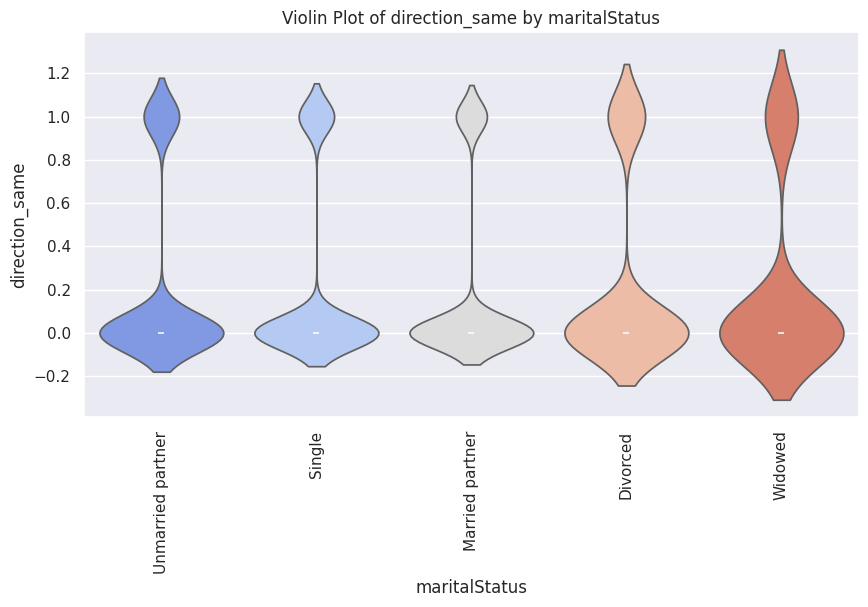


📌 **ANOVA Test:** F-Statistic = 2.3022, P-Value = 0.0562
❌ **No significant difference.**

🔹 **Analyzing direction_same vs education**

📊 **Descriptive Statistics**:
                                         count      mean       std  min  25%  \
education                                                                      
Associates degree                       1126.0  0.207815  0.405924  0.0  0.0   
Bachelors degree                        4247.0  0.210972  0.408047  0.0  0.0   
Graduate degree (Masters or Doctorate)  1793.0  0.220301  0.414565  0.0  0.0   
High School Graduate                     880.0  0.237500  0.425793  0.0  0.0   
Some High School                          87.0  0.264368  0.443553  0.0  0.0   
Some college - no degree                4260.0  0.209390  0.406921  0.0  0.0   

                                        50%  75%  max  
education                                              
Associates degree                       0.0  0.0  1.0  
Bachelors degree        

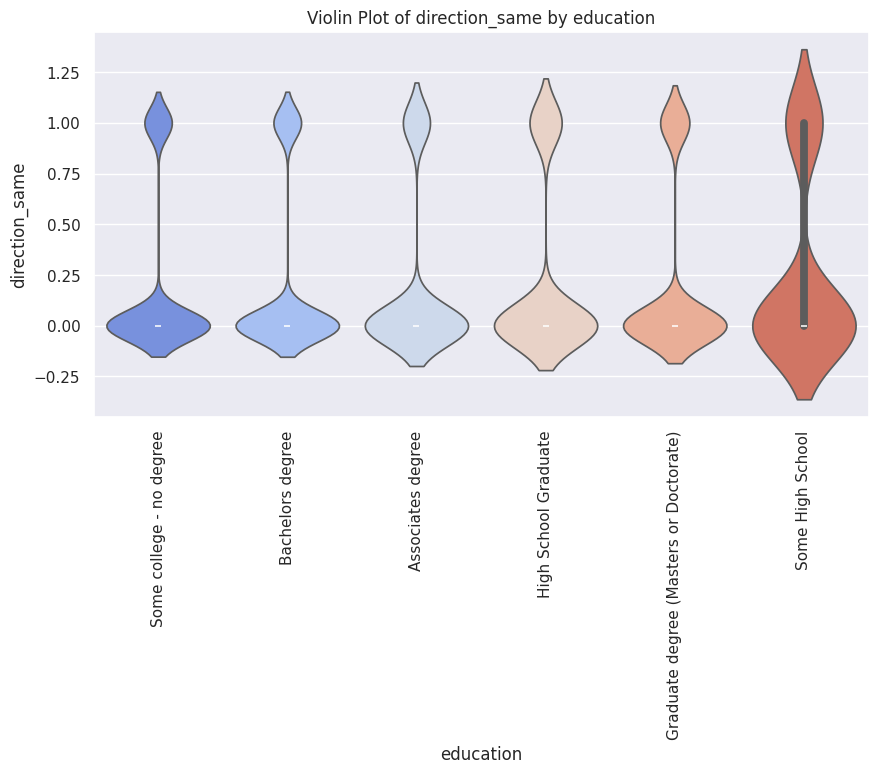


📌 **ANOVA Test:** F-Statistic = 1.1301, P-Value = 0.3418
❌ **No significant difference.**

🔹 **Analyzing direction_same vs occupation**

📊 **Descriptive Statistics**:
                                            count      mean       std  min  \
occupation                                                                   
Architecture & Engineering                  172.0  0.162791  0.370252  0.0   
Arts Design Entertainment Sports & Media    617.0  0.186386  0.389734  0.0   
Building & Grounds Cleaning & Maintenance    42.0  0.166667  0.377195  0.0   
Business & Financial                        536.0  0.199627  0.400093  0.0   
Community & Social Services                 236.0  0.271186  0.445517  0.0   
Computer & Mathematical                    1360.0  0.202206  0.401793  0.0   
Construction & Extraction                   150.0  0.160000  0.367834  0.0   
Education&Training&Library                  921.0  0.204126  0.403280  0.0   
Farming Fishing & Forestry                   41.0  0

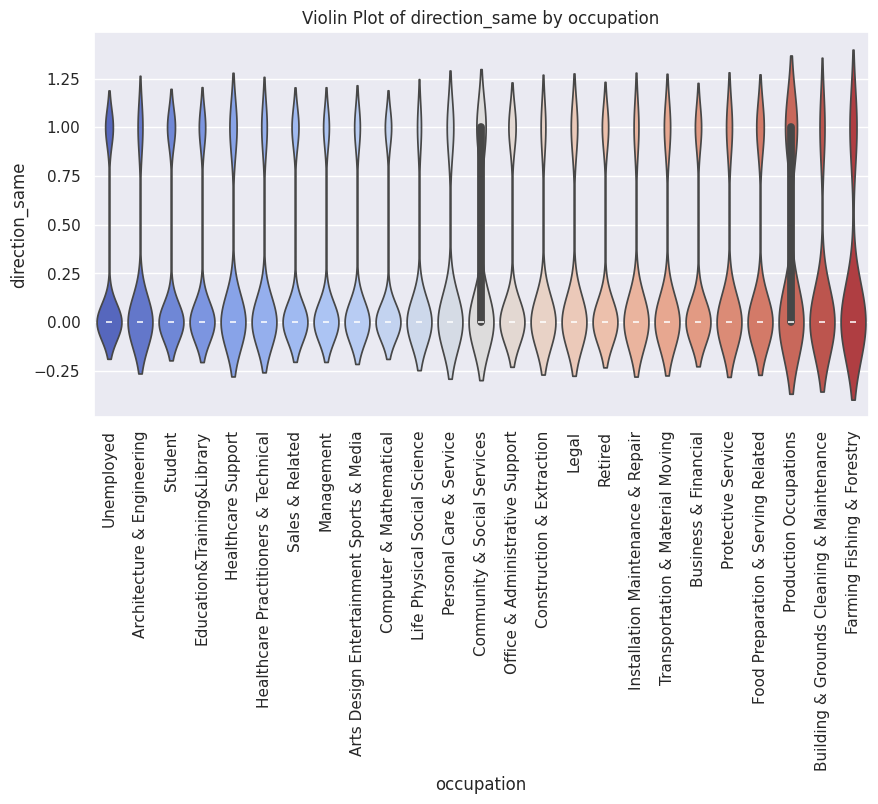


📌 **ANOVA Test:** F-Statistic = 2.1277, P-Value = 0.0011
✅ **Significant Relationship (p < 0.05)!**

🔹 **Analyzing direction_same vs income**

📊 **Descriptive Statistics**:
                   count      mean       std  min  25%  50%  75%  max
income                                                               
$100000 or More   1688.0  0.203791  0.402935  0.0  0.0  0.0  0.0  1.0
$12500 - $24999   1795.0  0.208914  0.406646  0.0  0.0  0.0  0.0  1.0
$25000 - $37499   1972.0  0.213489  0.409874  0.0  0.0  0.0  0.0  1.0
$37500 - $49999   1760.0  0.227273  0.419189  0.0  0.0  0.0  0.0  1.0
$50000 - $62499   1624.0  0.189655  0.392149  0.0  0.0  0.0  0.0  1.0
$62500 - $74999    832.0  0.219952  0.414463  0.0  0.0  0.0  0.0  1.0
$75000 - $87499    844.0  0.208531  0.406499  0.0  0.0  0.0  0.0  1.0
$87500 - $99999    865.0  0.202312  0.401956  0.0  0.0  0.0  0.0  1.0
Less than $12500  1013.0  0.263574  0.440788  0.0  0.0  0.0  1.0  1.0


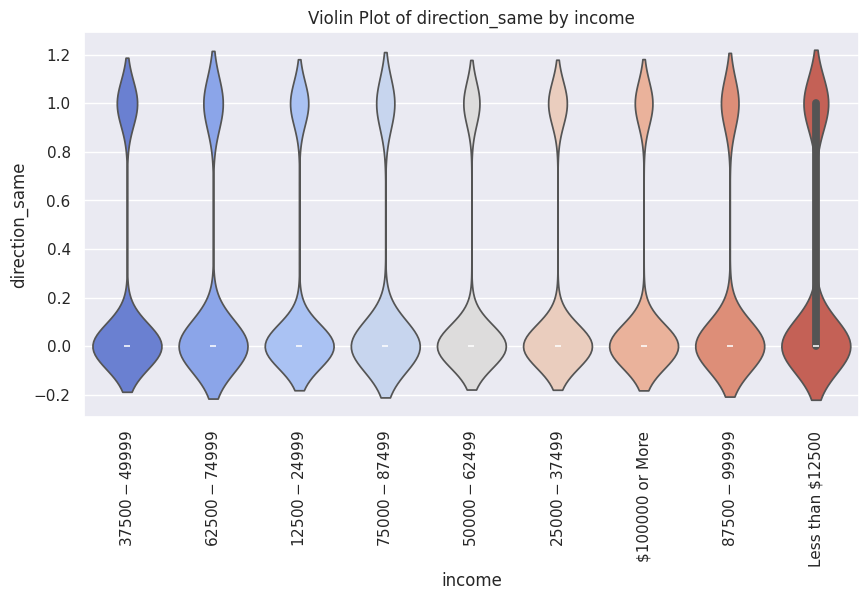


📌 **ANOVA Test:** F-Statistic = 3.0958, P-Value = 0.0017
✅ **Significant Relationship (p < 0.05)!**

🔹 **Analyzing direction_same vs Bar**

📊 **Descriptive Statistics**:
        count      mean       std  min  25%  50%  75%  max
Bar                                                       
1~3    2432.0  0.213816  0.410083  0.0  0.0  0.0  0.0  1.0
4~8    1045.0  0.214354  0.410570  0.0  0.0  0.0  0.0  1.0
gt8     338.0  0.174556  0.380150  0.0  0.0  0.0  0.0  1.0
less1  3383.0  0.224653  0.417415  0.0  0.0  0.0  0.0  1.0
never  5195.0  0.209047  0.406667  0.0  0.0  0.0  0.0  1.0


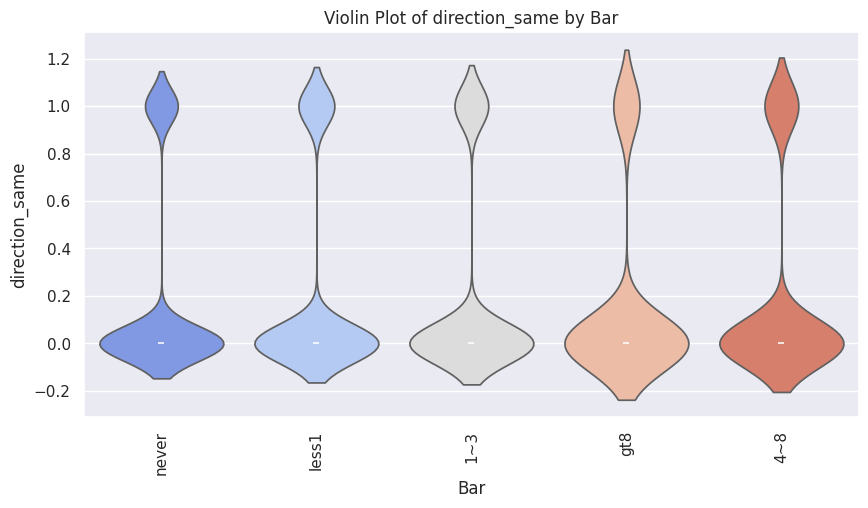


📌 **ANOVA Test:** F-Statistic = 1.5422, P-Value = 0.1870
❌ **No significant difference.**

🔹 **Analyzing direction_same vs CoffeeHouse**

📊 **Descriptive Statistics**:
              count      mean       std  min  25%  50%  75%  max
CoffeeHouse                                                     
1~3          3138.0  0.199490  0.399681  0.0  0.0  0.0  0.0  1.0
4~8          1752.0  0.220890  0.414965  0.0  0.0  0.0  0.0  1.0
gt8          1083.0  0.224377  0.417364  0.0  0.0  0.0  0.0  1.0
less1        3525.0  0.209645  0.407113  0.0  0.0  0.0  0.0  1.0
never        2895.0  0.225907  0.418250  0.0  0.0  0.0  0.0  1.0


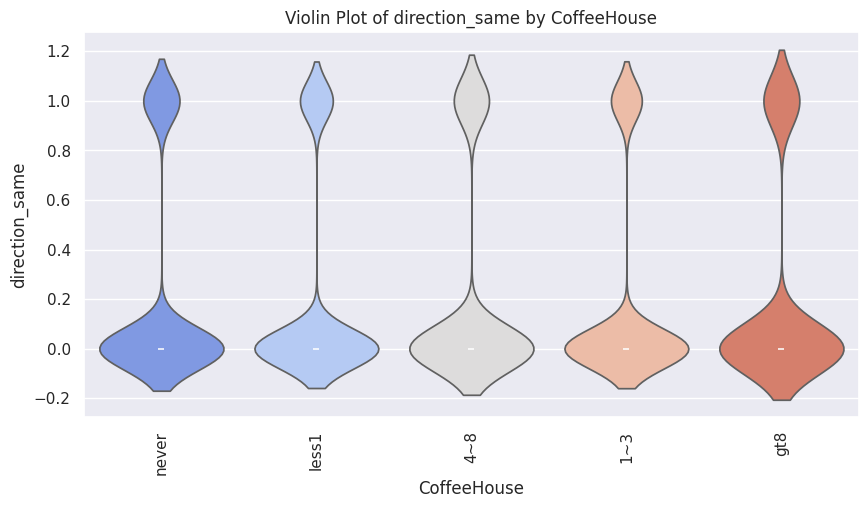


📌 **ANOVA Test:** F-Statistic = 1.9893, P-Value = 0.0932
❌ **No significant difference.**

🔹 **Analyzing direction_same vs CarryAway**

📊 **Descriptive Statistics**:
            count      mean       std  min  25%  50%  75%  max
CarryAway                                                     
1~3        4719.0  0.206188  0.404610  0.0  0.0  0.0  0.0  1.0
4~8        4171.0  0.222009  0.415647  0.0  0.0  0.0  0.0  1.0
gt8        1535.0  0.205212  0.403988  0.0  0.0  0.0  0.0  1.0
less1      1819.0  0.220451  0.414665  0.0  0.0  0.0  0.0  1.0
never       149.0  0.228188  0.421080  0.0  0.0  0.0  0.0  1.0


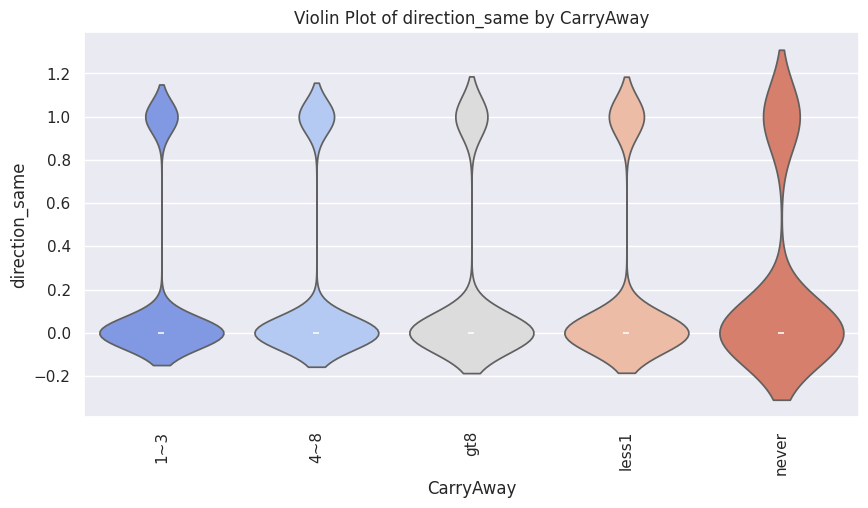


📌 **ANOVA Test:** F-Statistic = 1.1588, P-Value = 0.3269
❌ **No significant difference.**

🔹 **Analyzing direction_same vs RestaurantLessThan20**

📊 **Descriptive Statistics**:
                       count      mean       std  min  25%  50%  75%  max
RestaurantLessThan20                                                     
1~3                   5397.0  0.214564  0.410557  0.0  0.0  0.0  0.0  1.0
4~8                   3493.0  0.212139  0.408881  0.0  0.0  0.0  0.0  1.0
gt8                   1253.0  0.202713  0.402181  0.0  0.0  0.0  0.0  1.0
less1                 2034.0  0.217797  0.412850  0.0  0.0  0.0  0.0  1.0
never                  216.0  0.245370  0.431306  0.0  0.0  0.0  0.0  1.0


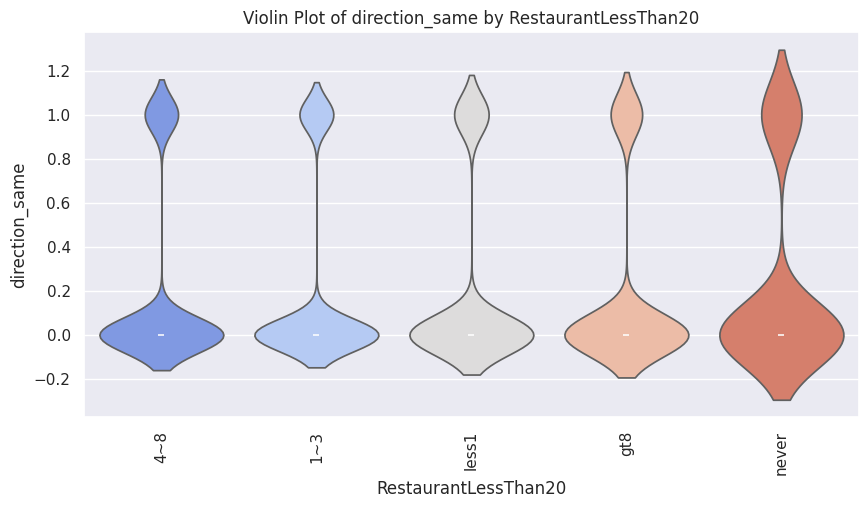


📌 **ANOVA Test:** F-Statistic = 0.6165, P-Value = 0.6507
❌ **No significant difference.**

🔹 **Analyzing direction_same vs Restaurant20To50**

📊 **Descriptive Statistics**:
                   count      mean       std  min  25%  50%  75%  max
Restaurant20To50                                                     
1~3               3204.0  0.208801  0.406516  0.0  0.0  0.0  0.0  1.0
4~8                718.0  0.235376  0.424529  0.0  0.0  0.0  0.0  1.0
gt8                254.0  0.196850  0.398403  0.0  0.0  0.0  0.0  1.0
less1             6134.0  0.209162  0.406743  0.0  0.0  0.0  0.0  1.0
never             2083.0  0.229477  0.420597  0.0  0.0  0.0  0.0  1.0


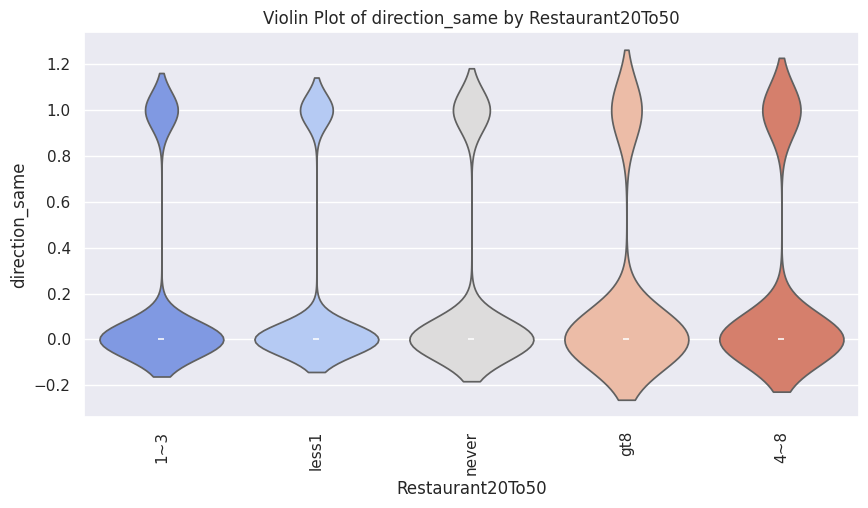


📌 **ANOVA Test:** F-Statistic = 1.6828, P-Value = 0.1509
❌ **No significant difference.**

🔹 **Analyzing direction_opp vs destination**

📊 **Descriptive Statistics**:
                  count      mean       std  min  25%  50%  75%  max
destination                                                         
Home             3161.0  0.540968  0.498398  0.0  0.0  1.0  1.0  1.0
No Urgent Place  6118.0  1.000000  0.000000  1.0  1.0  1.0  1.0  1.0
Work             3114.0  0.615286  0.486606  0.0  0.0  1.0  1.0  1.0


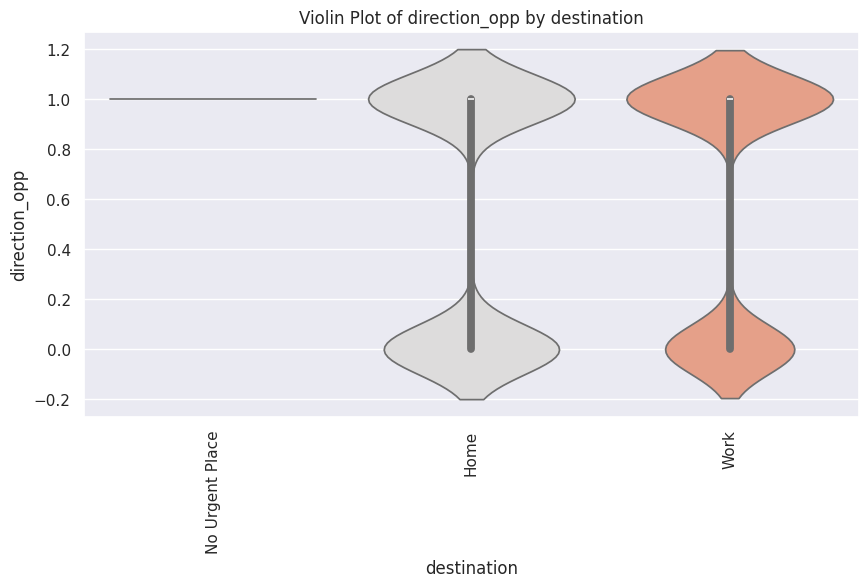


📌 **ANOVA Test:** F-Statistic = 2282.2144, P-Value = 0.0000
✅ **Significant Relationship (p < 0.05)!**

🔹 **Analyzing direction_opp vs passanger**

📊 **Descriptive Statistics**:
            count      mean       std  min  25%  50%  75%  max
passanger                                                     
Alone      7178.0  0.657008  0.474742  0.0  0.0  1.0  1.0  1.0
Friend(s)  3166.0  1.000000  0.000000  1.0  1.0  1.0  1.0  1.0
Kid(s)      981.0  0.949032  0.220045  0.0  1.0  1.0  1.0  1.0
Partner    1068.0  0.871723  0.334555  0.0  1.0  1.0  1.0  1.0


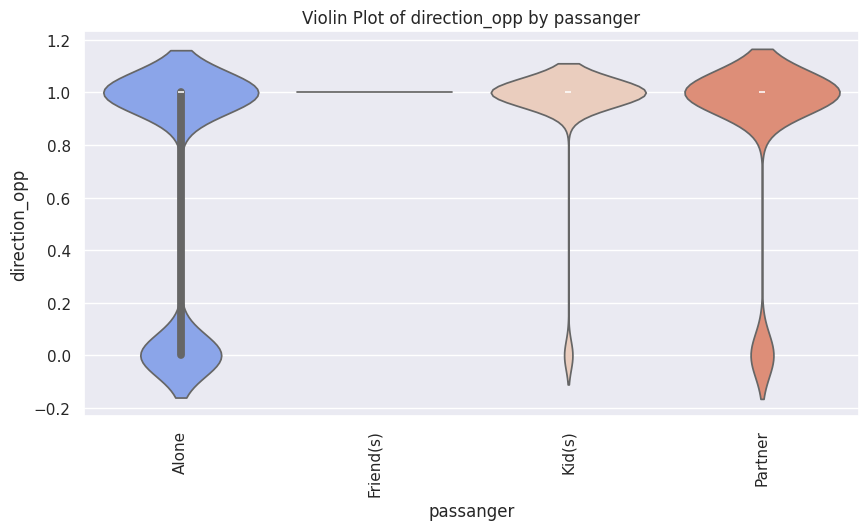


📌 **ANOVA Test:** F-Statistic = 690.4576, P-Value = 0.0000
✅ **Significant Relationship (p < 0.05)!**

🔹 **Analyzing direction_opp vs weather**

📊 **Descriptive Statistics**:
          count      mean       std  min  25%  50%  75%  max
weather                                                     
Rainy    1202.0  0.761231  0.426509  0.0  1.0  1.0  1.0  1.0
Snowy    1329.0  0.857788  0.349399  0.0  1.0  1.0  1.0  1.0
Sunny    9862.0  0.779659  0.414497  0.0  1.0  1.0  1.0  1.0


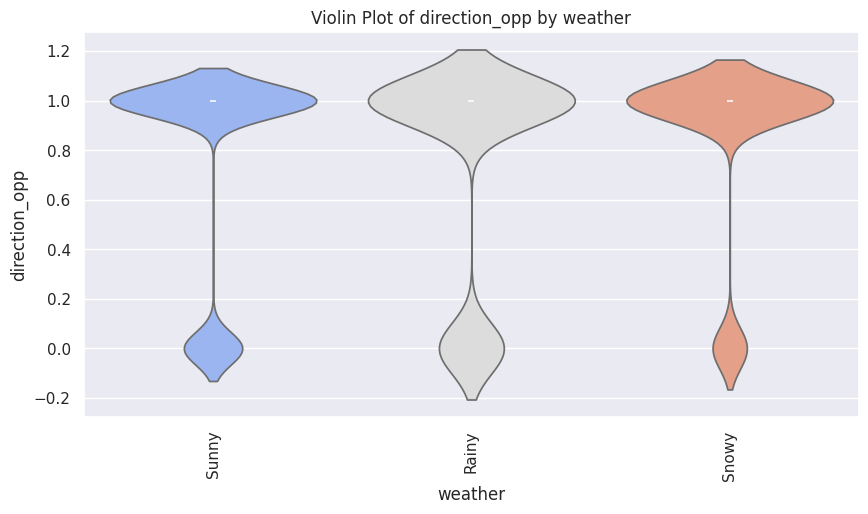


📌 **ANOVA Test:** F-Statistic = 23.8333, P-Value = 0.0000
✅ **Significant Relationship (p < 0.05)!**

🔹 **Analyzing direction_opp vs coupon**

📊 **Descriptive Statistics**:
                        count      mean       std  min  25%  50%  75%  max
coupon                                                                    
Bar                    2010.0  0.791045  0.406664  0.0  1.0  1.0  1.0  1.0
Carry out & Take away  2275.0  0.651868  0.476483  0.0  0.0  1.0  1.0  1.0
Coffee House           3913.0  0.808587  0.393464  0.0  1.0  1.0  1.0  1.0
Restaurant(20-50)      1487.0  0.827169  0.378228  0.0  1.0  1.0  1.0  1.0
Restaurant(<20)        2708.0  0.840842  0.365891  0.0  1.0  1.0  1.0  1.0


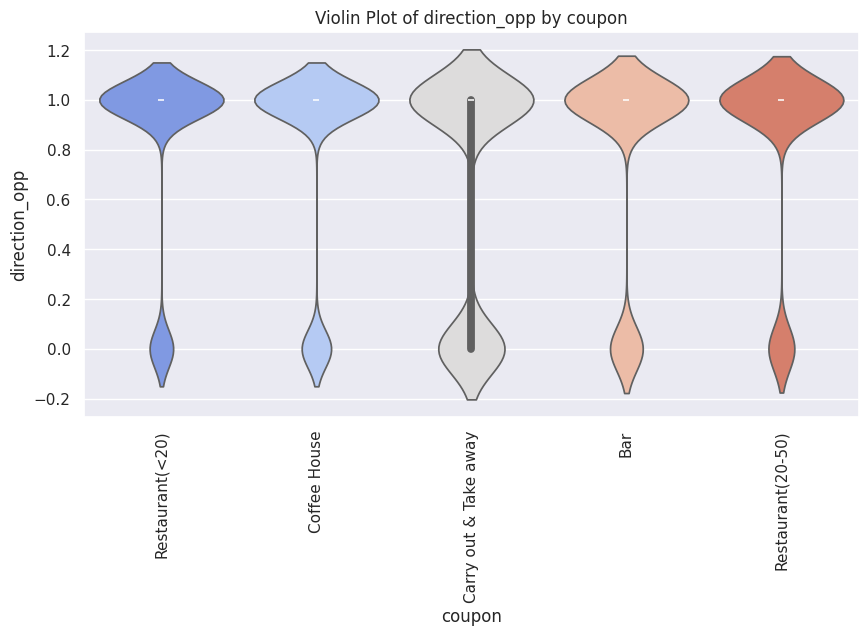


📌 **ANOVA Test:** F-Statistic = 81.8719, P-Value = 0.0000
✅ **Significant Relationship (p < 0.05)!**

🔹 **Analyzing direction_opp vs expiration**

📊 **Descriptive Statistics**:
             count      mean       std  min  25%  50%  75%  max
expiration                                                     
1d          6938.0  0.793456  0.404854  0.0  1.0  1.0  1.0  1.0
2h          5455.0  0.777085  0.416240  0.0  1.0  1.0  1.0  1.0


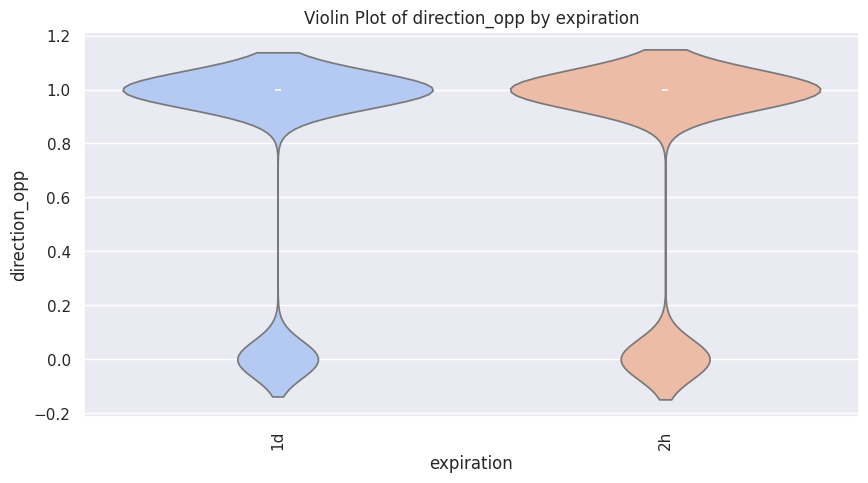


📌 **ANOVA Test:** F-Statistic = 4.8713, P-Value = 0.0273
✅ **Significant Relationship (p < 0.05)!**

🔹 **Analyzing direction_opp vs gender**

📊 **Descriptive Statistics**:
         count      mean       std  min  25%  50%  75%  max
gender                                                     
Female  6355.0  0.785366  0.410601  0.0  1.0  1.0  1.0  1.0
Male    6038.0  0.787181  0.409334  0.0  1.0  1.0  1.0  1.0


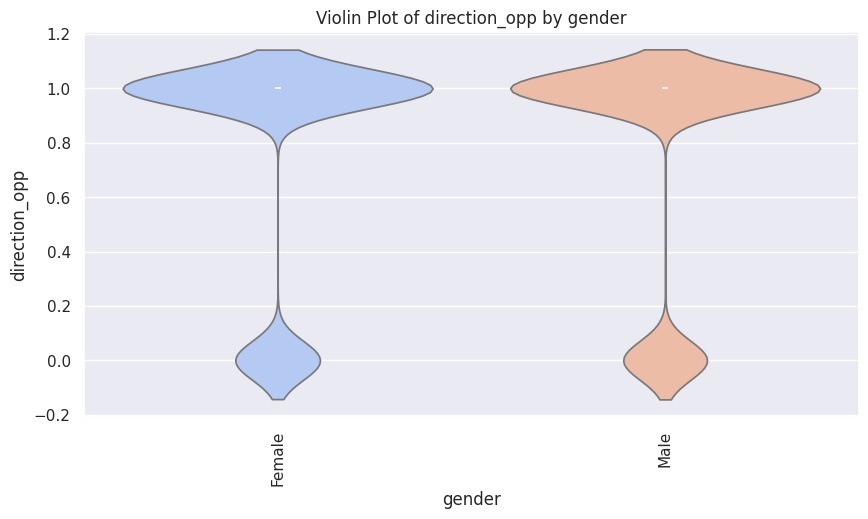


📌 **ANOVA Test:** F-Statistic = 0.0607, P-Value = 0.8054
❌ **No significant difference.**

🔹 **Analyzing direction_opp vs age**

📊 **Descriptive Statistics**:
          count      mean       std  min  25%  50%  75%  max
age                                                         
21       2598.0  0.779061  0.414959  0.0  1.0  1.0  1.0  1.0
26       2486.0  0.785197  0.410768  0.0  1.0  1.0  1.0  1.0
31       1984.0  0.777722  0.415882  0.0  1.0  1.0  1.0  1.0
36       1293.0  0.784223  0.411520  0.0  1.0  1.0  1.0  1.0
41       1079.0  0.814643  0.388767  0.0  1.0  1.0  1.0  1.0
46        660.0  0.818182  0.385987  0.0  1.0  1.0  1.0  1.0
50plus   1756.0  0.797267  0.402150  0.0  1.0  1.0  1.0  1.0
below21   537.0  0.729981  0.444383  0.0  0.0  1.0  1.0  1.0


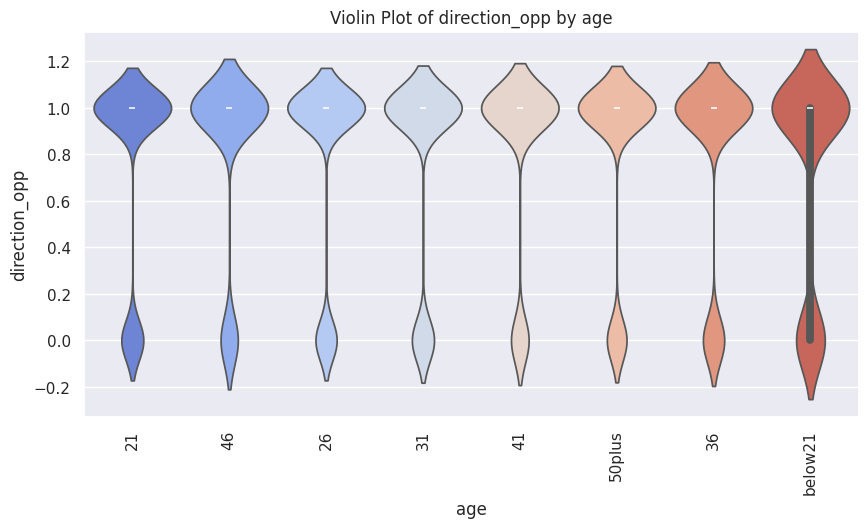


📌 **ANOVA Test:** F-Statistic = 3.1852, P-Value = 0.0023
✅ **Significant Relationship (p < 0.05)!**

🔹 **Analyzing direction_opp vs maritalStatus**

📊 **Descriptive Statistics**:
                    count      mean       std  min  25%  50%  75%  max
maritalStatus                                                         
Divorced            505.0  0.768317  0.422326  0.0  1.0  1.0  1.0  1.0
Married partner    4994.0  0.799559  0.400370  0.0  1.0  1.0  1.0  1.0
Single             4610.0  0.777874  0.415720  0.0  1.0  1.0  1.0  1.0
Unmarried partner  2155.0  0.777262  0.416180  0.0  1.0  1.0  1.0  1.0
Widowed             129.0  0.790698  0.408397  0.0  1.0  1.0  1.0  1.0


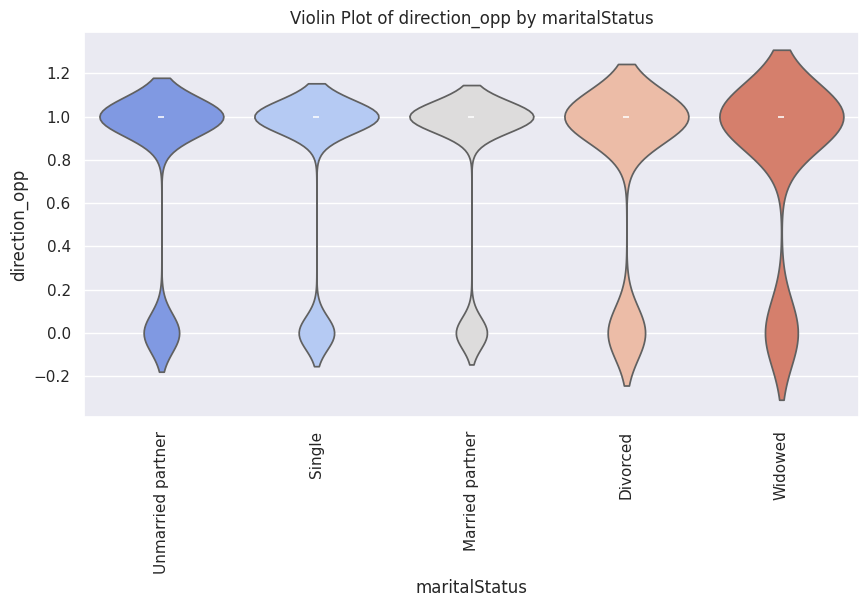


📌 **ANOVA Test:** F-Statistic = 2.3022, P-Value = 0.0562
❌ **No significant difference.**

🔹 **Analyzing direction_opp vs education**

📊 **Descriptive Statistics**:
                                         count      mean       std  min  25%  \
education                                                                      
Associates degree                       1126.0  0.792185  0.405924  0.0  1.0   
Bachelors degree                        4247.0  0.789028  0.408047  0.0  1.0   
Graduate degree (Masters or Doctorate)  1793.0  0.779699  0.414565  0.0  1.0   
High School Graduate                     880.0  0.762500  0.425793  0.0  1.0   
Some High School                          87.0  0.735632  0.443553  0.0  0.0   
Some college - no degree                4260.0  0.790610  0.406921  0.0  1.0   

                                        50%  75%  max  
education                                              
Associates degree                       1.0  1.0  1.0  
Bachelors degree         

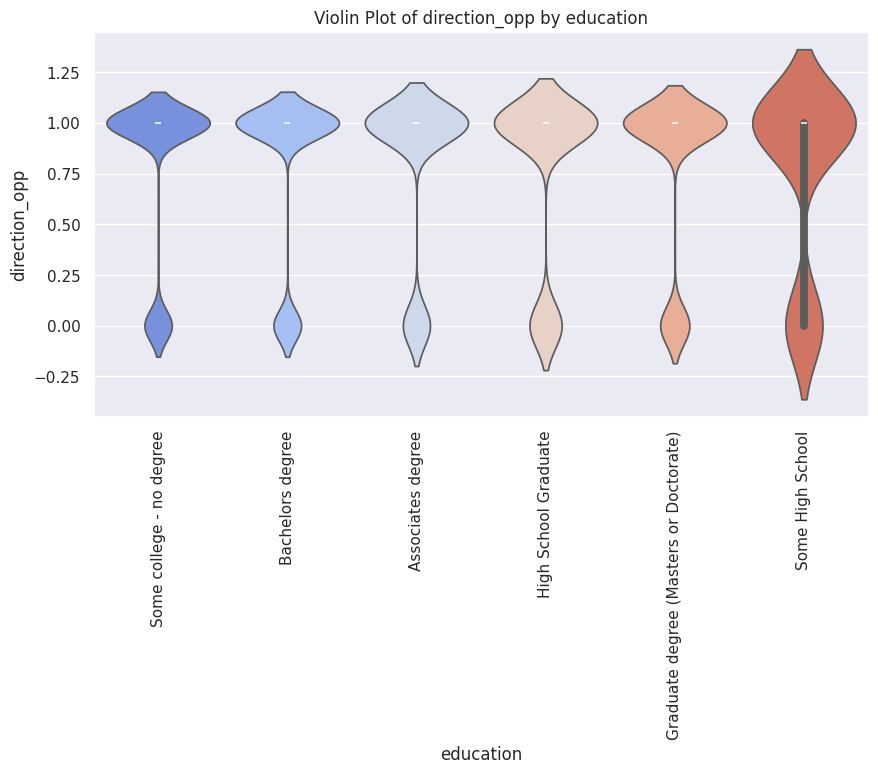


📌 **ANOVA Test:** F-Statistic = 1.1301, P-Value = 0.3418
❌ **No significant difference.**

🔹 **Analyzing direction_opp vs occupation**

📊 **Descriptive Statistics**:
                                            count      mean       std  min  \
occupation                                                                   
Architecture & Engineering                  172.0  0.837209  0.370252  0.0   
Arts Design Entertainment Sports & Media    617.0  0.813614  0.389734  0.0   
Building & Grounds Cleaning & Maintenance    42.0  0.833333  0.377195  0.0   
Business & Financial                        536.0  0.800373  0.400093  0.0   
Community & Social Services                 236.0  0.728814  0.445517  0.0   
Computer & Mathematical                    1360.0  0.797794  0.401793  0.0   
Construction & Extraction                   150.0  0.840000  0.367834  0.0   
Education&Training&Library                  921.0  0.795874  0.403280  0.0   
Farming Fishing & Forestry                   41.0  0.

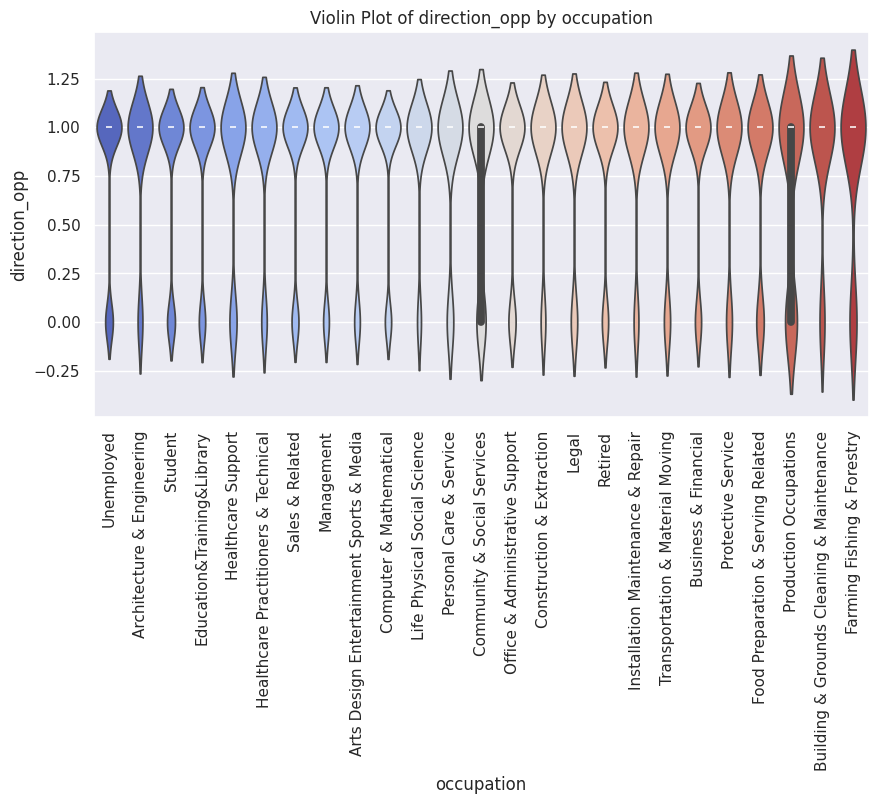


📌 **ANOVA Test:** F-Statistic = 2.1277, P-Value = 0.0011
✅ **Significant Relationship (p < 0.05)!**

🔹 **Analyzing direction_opp vs income**

📊 **Descriptive Statistics**:
                   count      mean       std  min  25%  50%  75%  max
income                                                               
$100000 or More   1688.0  0.796209  0.402935  0.0  1.0  1.0  1.0  1.0
$12500 - $24999   1795.0  0.791086  0.406646  0.0  1.0  1.0  1.0  1.0
$25000 - $37499   1972.0  0.786511  0.409874  0.0  1.0  1.0  1.0  1.0
$37500 - $49999   1760.0  0.772727  0.419189  0.0  1.0  1.0  1.0  1.0
$50000 - $62499   1624.0  0.810345  0.392149  0.0  1.0  1.0  1.0  1.0
$62500 - $74999    832.0  0.780048  0.414463  0.0  1.0  1.0  1.0  1.0
$75000 - $87499    844.0  0.791469  0.406499  0.0  1.0  1.0  1.0  1.0
$87500 - $99999    865.0  0.797688  0.401956  0.0  1.0  1.0  1.0  1.0
Less than $12500  1013.0  0.736426  0.440788  0.0  0.0  1.0  1.0  1.0


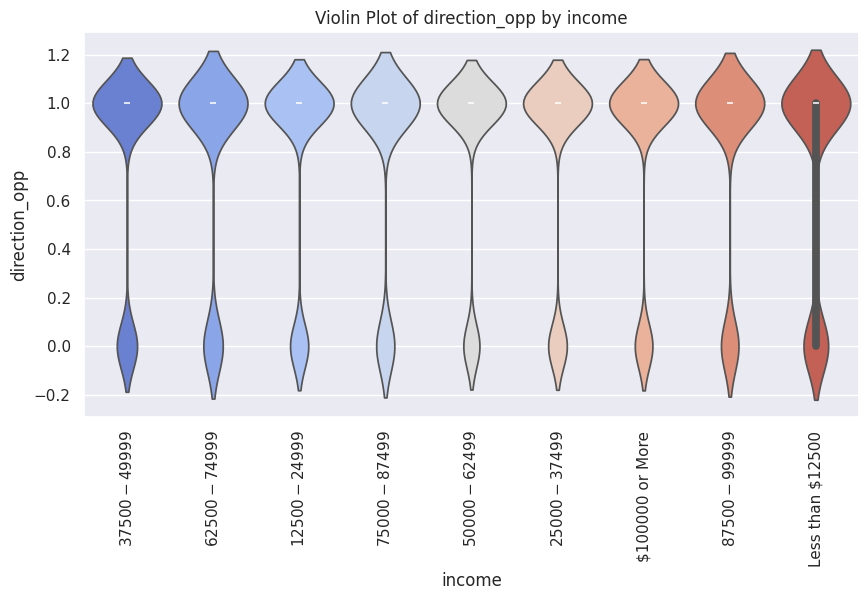


📌 **ANOVA Test:** F-Statistic = 3.0958, P-Value = 0.0017
✅ **Significant Relationship (p < 0.05)!**

🔹 **Analyzing direction_opp vs Bar**

📊 **Descriptive Statistics**:
        count      mean       std  min  25%  50%  75%  max
Bar                                                       
1~3    2432.0  0.786184  0.410083  0.0  1.0  1.0  1.0  1.0
4~8    1045.0  0.785646  0.410570  0.0  1.0  1.0  1.0  1.0
gt8     338.0  0.825444  0.380150  0.0  1.0  1.0  1.0  1.0
less1  3383.0  0.775347  0.417415  0.0  1.0  1.0  1.0  1.0
never  5195.0  0.790953  0.406667  0.0  1.0  1.0  1.0  1.0


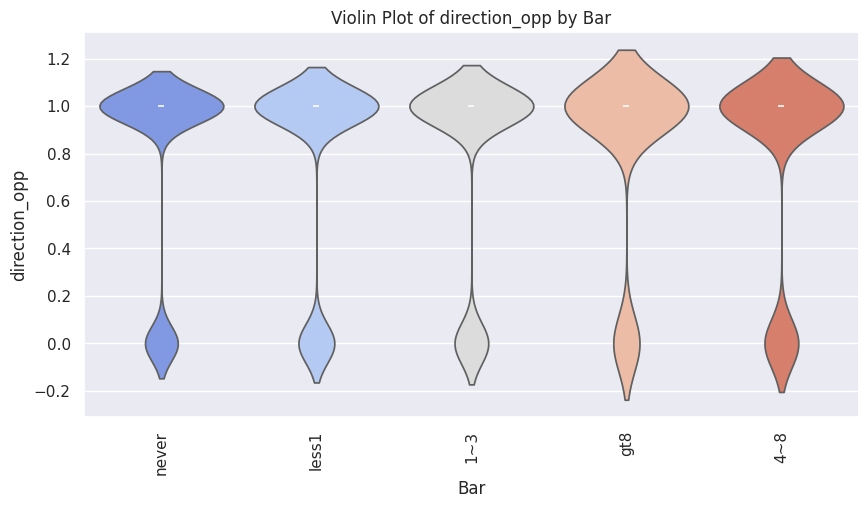


📌 **ANOVA Test:** F-Statistic = 1.5422, P-Value = 0.1870
❌ **No significant difference.**

🔹 **Analyzing direction_opp vs CoffeeHouse**

📊 **Descriptive Statistics**:
              count      mean       std  min  25%  50%  75%  max
CoffeeHouse                                                     
1~3          3138.0  0.800510  0.399681  0.0  1.0  1.0  1.0  1.0
4~8          1752.0  0.779110  0.414965  0.0  1.0  1.0  1.0  1.0
gt8          1083.0  0.775623  0.417364  0.0  1.0  1.0  1.0  1.0
less1        3525.0  0.790355  0.407113  0.0  1.0  1.0  1.0  1.0
never        2895.0  0.774093  0.418250  0.0  1.0  1.0  1.0  1.0


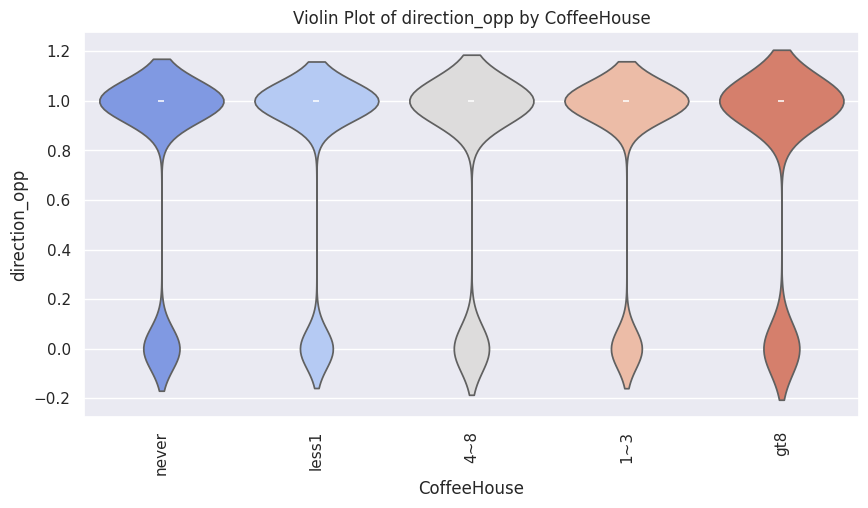


📌 **ANOVA Test:** F-Statistic = 1.9893, P-Value = 0.0932
❌ **No significant difference.**

🔹 **Analyzing direction_opp vs CarryAway**

📊 **Descriptive Statistics**:
            count      mean       std  min  25%  50%  75%  max
CarryAway                                                     
1~3        4719.0  0.793812  0.404610  0.0  1.0  1.0  1.0  1.0
4~8        4171.0  0.777991  0.415647  0.0  1.0  1.0  1.0  1.0
gt8        1535.0  0.794788  0.403988  0.0  1.0  1.0  1.0  1.0
less1      1819.0  0.779549  0.414665  0.0  1.0  1.0  1.0  1.0
never       149.0  0.771812  0.421080  0.0  1.0  1.0  1.0  1.0


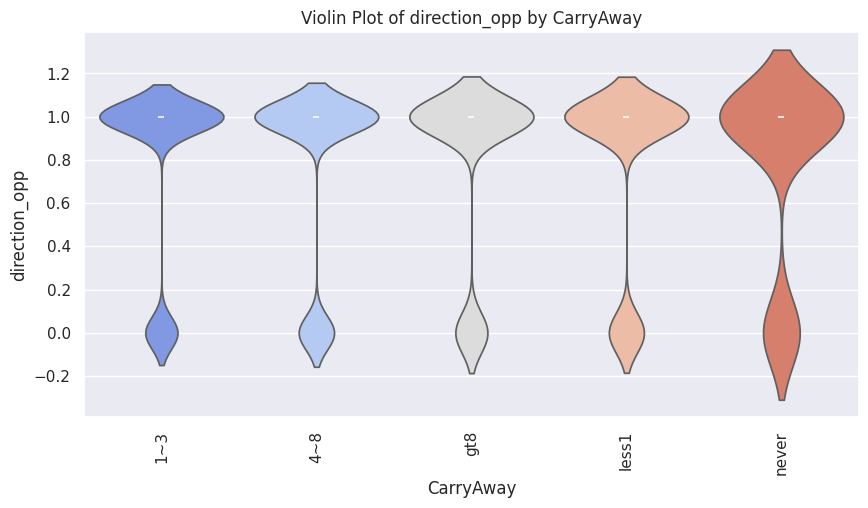


📌 **ANOVA Test:** F-Statistic = 1.1588, P-Value = 0.3269
❌ **No significant difference.**

🔹 **Analyzing direction_opp vs RestaurantLessThan20**

📊 **Descriptive Statistics**:
                       count      mean       std  min  25%  50%  75%  max
RestaurantLessThan20                                                     
1~3                   5397.0  0.785436  0.410557  0.0  1.0  1.0  1.0  1.0
4~8                   3493.0  0.787861  0.408881  0.0  1.0  1.0  1.0  1.0
gt8                   1253.0  0.797287  0.402181  0.0  1.0  1.0  1.0  1.0
less1                 2034.0  0.782203  0.412850  0.0  1.0  1.0  1.0  1.0
never                  216.0  0.754630  0.431306  0.0  1.0  1.0  1.0  1.0


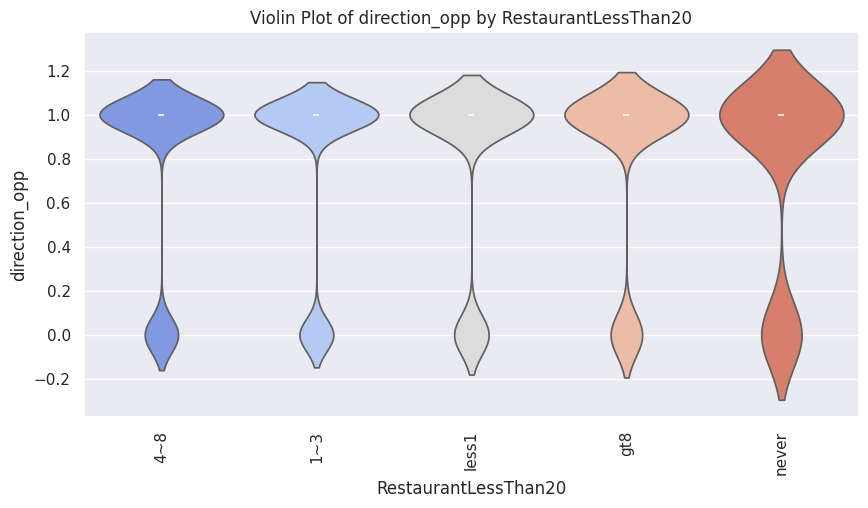


📌 **ANOVA Test:** F-Statistic = 0.6165, P-Value = 0.6507
❌ **No significant difference.**

🔹 **Analyzing direction_opp vs Restaurant20To50**

📊 **Descriptive Statistics**:
                   count      mean       std  min  25%  50%  75%  max
Restaurant20To50                                                     
1~3               3204.0  0.791199  0.406516  0.0  1.0  1.0  1.0  1.0
4~8                718.0  0.764624  0.424529  0.0  1.0  1.0  1.0  1.0
gt8                254.0  0.803150  0.398403  0.0  1.0  1.0  1.0  1.0
less1             6134.0  0.790838  0.406743  0.0  1.0  1.0  1.0  1.0
never             2083.0  0.770523  0.420597  0.0  1.0  1.0  1.0  1.0


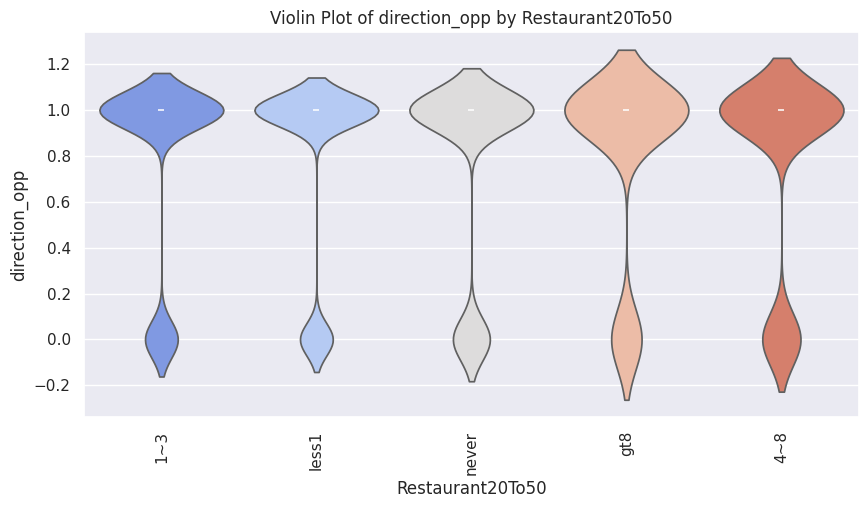


📌 **ANOVA Test:** F-Statistic = 1.6828, P-Value = 0.1509
❌ **No significant difference.**

🔹 **Analyzing Accept(Y/N?) vs destination**

📊 **Descriptive Statistics**:
                  count      mean       std  min  25%  50%  75%  max
destination                                                         
Home             3161.0  0.504271  0.500061  0.0  0.0  1.0  1.0  1.0
No Urgent Place  6118.0  0.631742  0.482371  0.0  0.0  1.0  1.0  1.0
Work             3114.0  0.498715  0.500079  0.0  0.0  0.0  1.0  1.0


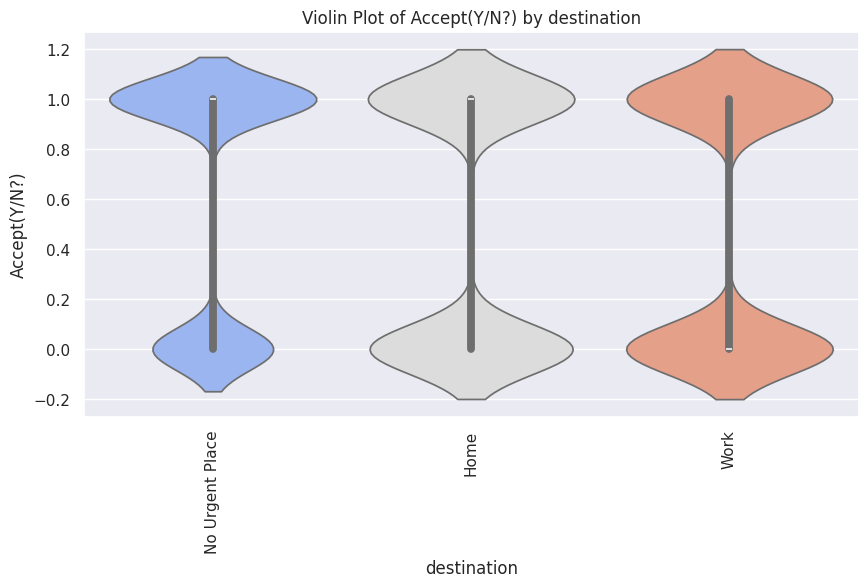


📌 **ANOVA Test:** F-Statistic = 108.8774, P-Value = 0.0000
✅ **Significant Relationship (p < 0.05)!**

🔹 **Analyzing Accept(Y/N?) vs passanger**

📊 **Descriptive Statistics**:
            count      mean       std  min  25%  50%  75%  max
passanger                                                     
Alone      7178.0  0.523823  0.499467  0.0  0.0  1.0  1.0  1.0
Friend(s)  3166.0  0.671826  0.469623  0.0  0.0  1.0  1.0  1.0
Kid(s)      981.0  0.500510  0.500255  0.0  0.0  1.0  1.0  1.0
Partner    1068.0  0.593633  0.491385  0.0  0.0  1.0  1.0  1.0


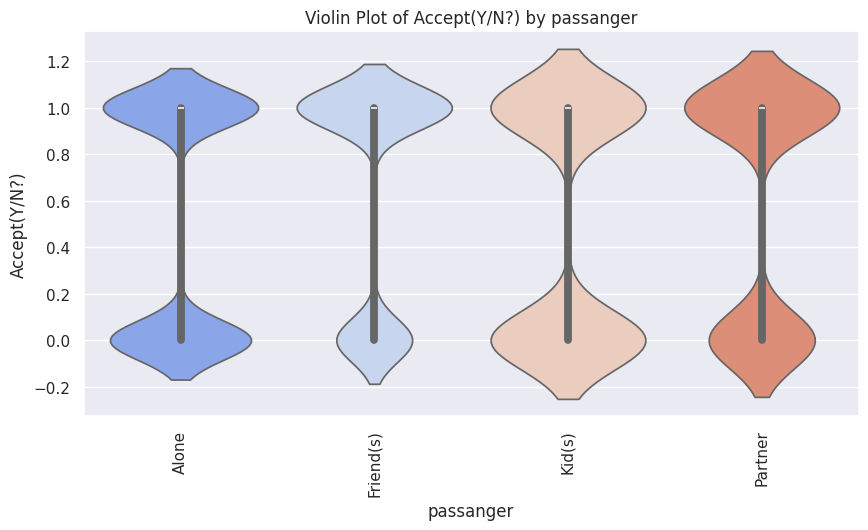


📌 **ANOVA Test:** F-Statistic = 73.5108, P-Value = 0.0000
✅ **Significant Relationship (p < 0.05)!**

🔹 **Analyzing Accept(Y/N?) vs weather**

📊 **Descriptive Statistics**:
          count      mean       std  min  25%  50%  75%  max
weather                                                     
Rainy    1202.0  0.463394  0.498866  0.0  0.0  0.0  1.0  1.0
Snowy    1329.0  0.455229  0.498179  0.0  0.0  0.0  1.0  1.0
Sunny    9862.0  0.593186  0.491265  0.0  0.0  1.0  1.0  1.0


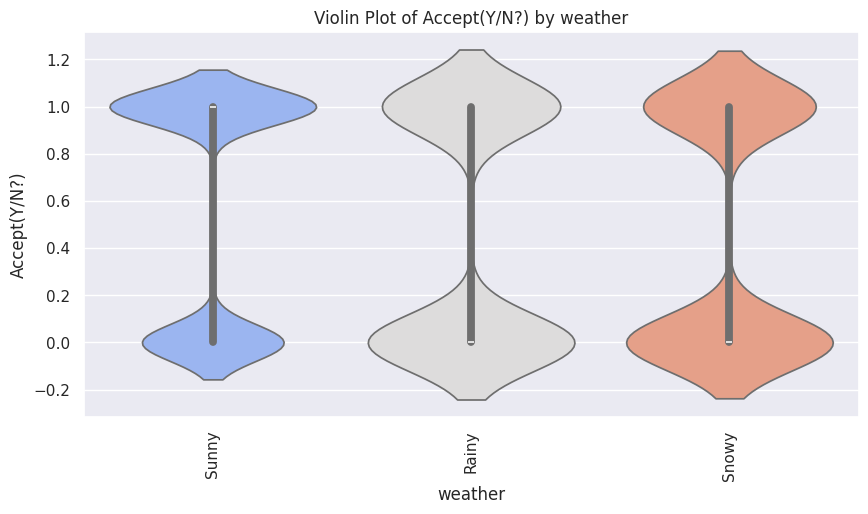


📌 **ANOVA Test:** F-Statistic = 74.6484, P-Value = 0.0000
✅ **Significant Relationship (p < 0.05)!**

🔹 **Analyzing Accept(Y/N?) vs coupon**

📊 **Descriptive Statistics**:
                        count      mean       std  min  25%  50%  75%  max
coupon                                                                    
Bar                    2010.0  0.409950  0.491947  0.0  0.0  0.0  1.0  1.0
Carry out & Take away  2275.0  0.731868  0.443084  0.0  0.0  1.0  1.0  1.0
Coffee House           3913.0  0.496550  0.500052  0.0  0.0  0.0  1.0  1.0
Restaurant(20-50)      1487.0  0.441157  0.496692  0.0  0.0  0.0  1.0  1.0
Restaurant(<20)        2708.0  0.710487  0.453620  0.0  0.0  1.0  1.0  1.0


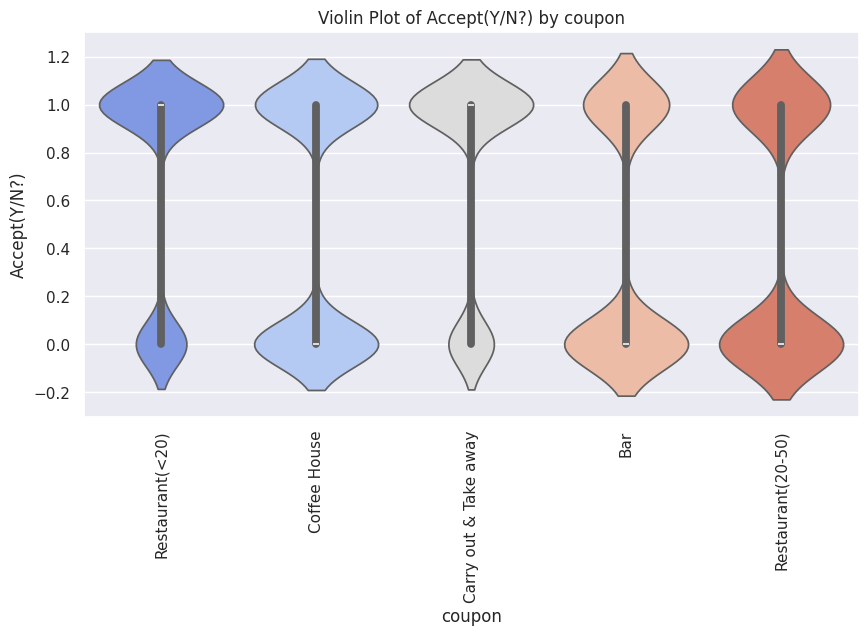


📌 **ANOVA Test:** F-Statistic = 229.5817, P-Value = 0.0000
✅ **Significant Relationship (p < 0.05)!**

🔹 **Analyzing Accept(Y/N?) vs expiration**

📊 **Descriptive Statistics**:
             count      mean       std  min  25%  50%  75%  max
expiration                                                     
1d          6938.0  0.622225  0.484866  0.0  0.0  1.0  1.0  1.0
2h          5455.0  0.494042  0.500010  0.0  0.0  0.0  1.0  1.0


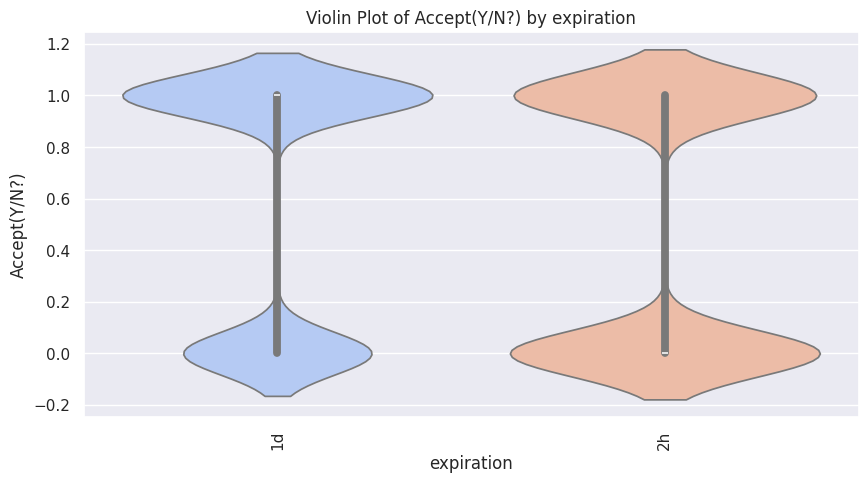


📌 **ANOVA Test:** F-Statistic = 207.6397, P-Value = 0.0000
✅ **Significant Relationship (p < 0.05)!**

🔹 **Analyzing Accept(Y/N?) vs gender**

📊 **Descriptive Statistics**:
         count      mean       std  min  25%  50%  75%  max
gender                                                     
Female  6355.0  0.544453  0.498059  0.0  0.0  1.0  1.0  1.0
Male    6038.0  0.588274  0.492187  0.0  0.0  1.0  1.0  1.0


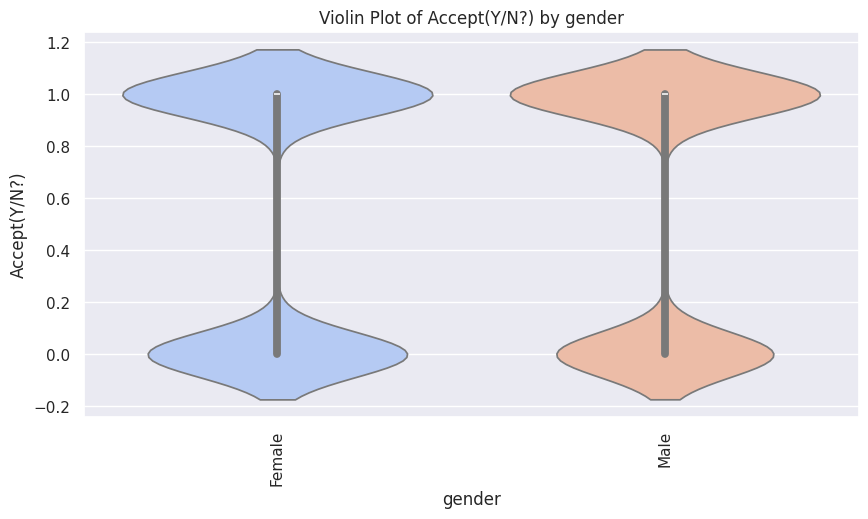


📌 **ANOVA Test:** F-Statistic = 24.2452, P-Value = 0.0000
✅ **Significant Relationship (p < 0.05)!**

🔹 **Analyzing Accept(Y/N?) vs age**

📊 **Descriptive Statistics**:
          count      mean       std  min  25%  50%  75%  max
age                                                         
21       2598.0  0.596228  0.490747  0.0  0.0  1.0  1.0  1.0
26       2486.0  0.593323  0.491313  0.0  0.0  1.0  1.0  1.0
31       1984.0  0.543851  0.498199  0.0  0.0  1.0  1.0  1.0
36       1293.0  0.531323  0.499211  0.0  0.0  1.0  1.0  1.0
41       1079.0  0.572753  0.494908  0.0  0.0  1.0  1.0  1.0
46        660.0  0.572727  0.495058  0.0  0.0  1.0  1.0  1.0
50plus   1756.0  0.505695  0.500110  0.0  0.0  1.0  1.0  1.0
below21   537.0  0.629423  0.483410  0.0  0.0  1.0  1.0  1.0


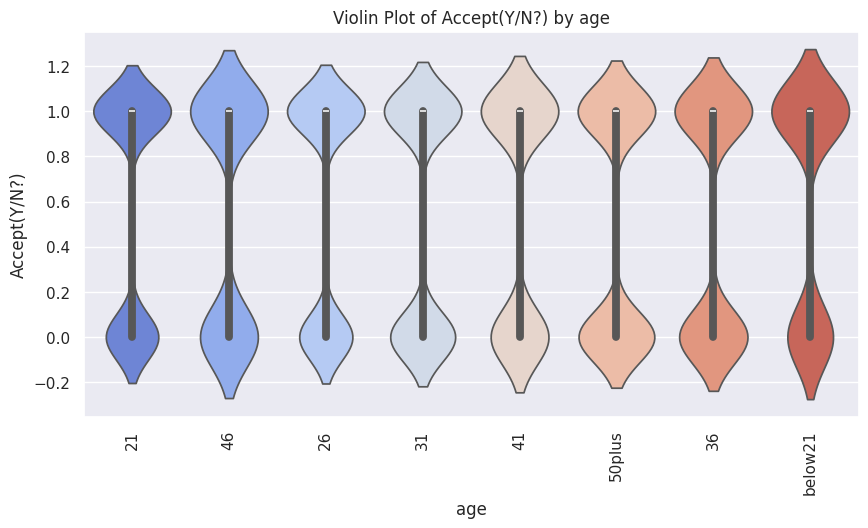


📌 **ANOVA Test:** F-Statistic = 8.9846, P-Value = 0.0000
✅ **Significant Relationship (p < 0.05)!**

🔹 **Analyzing Accept(Y/N?) vs maritalStatus**

📊 **Descriptive Statistics**:
                    count      mean       std  min  25%  50%  75%  max
maritalStatus                                                         
Divorced            505.0  0.526733  0.499780  0.0  0.0  1.0  1.0  1.0
Married partner    4994.0  0.540048  0.498443  0.0  0.0  1.0  1.0  1.0
Single             4610.0  0.603905  0.489138  0.0  0.0  1.0  1.0  1.0
Unmarried partner  2155.0  0.558237  0.496712  0.0  0.0  1.0  1.0  1.0
Widowed             129.0  0.480620  0.501572  0.0  0.0  0.0  1.0  1.0


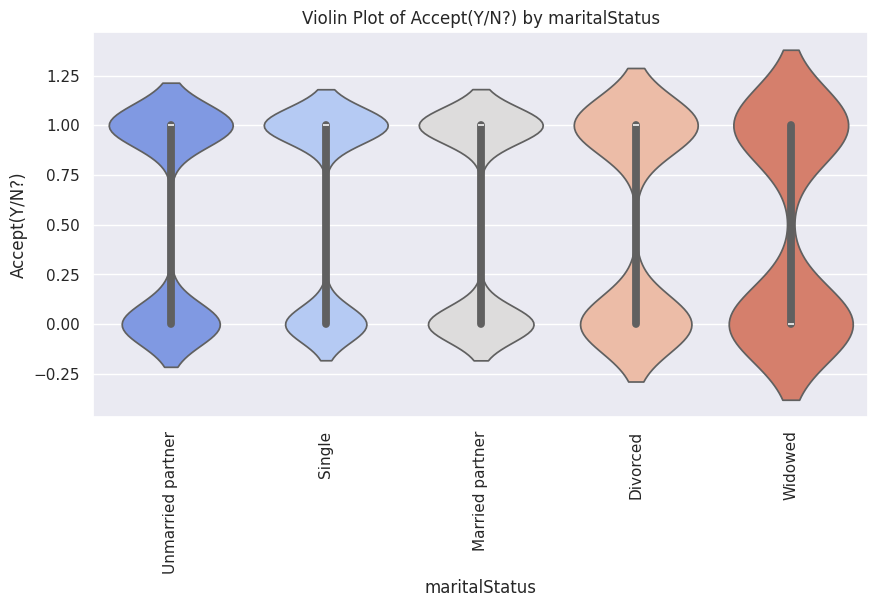


📌 **ANOVA Test:** F-Statistic = 12.0861, P-Value = 0.0000
✅ **Significant Relationship (p < 0.05)!**

🔹 **Analyzing Accept(Y/N?) vs education**

📊 **Descriptive Statistics**:
                                         count      mean       std  min  25%  \
education                                                                      
Associates degree                       1126.0  0.545293  0.498166  0.0  0.0   
Bachelors degree                        4247.0  0.551919  0.497356  0.0  0.0   
Graduate degree (Masters or Doctorate)  1793.0  0.523703  0.499577  0.0  0.0   
High School Graduate                     880.0  0.589773  0.492155  0.0  0.0   
Some High School                          87.0  0.712644  0.455153  0.0  0.0   
Some college - no degree                4260.0  0.594836  0.490981  0.0  0.0   

                                        50%  75%  max  
education                                              
Associates degree                       1.0  1.0  1.0  
Bachelors degre

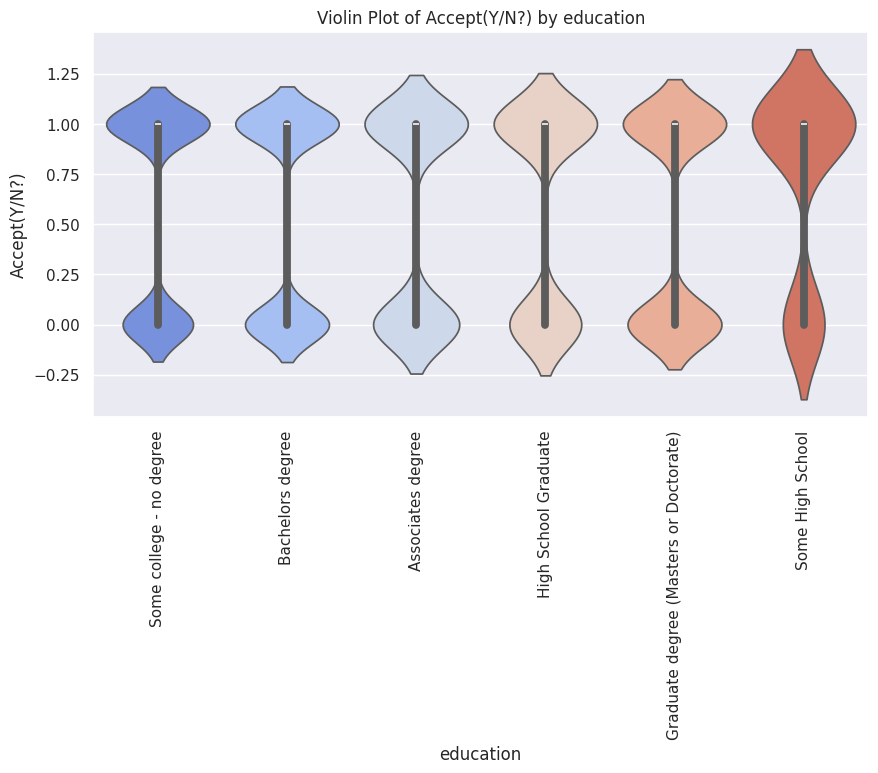


📌 **ANOVA Test:** F-Statistic = 8.5264, P-Value = 0.0000
✅ **Significant Relationship (p < 0.05)!**

🔹 **Analyzing Accept(Y/N?) vs occupation**

📊 **Descriptive Statistics**:
                                            count      mean       std  min  \
occupation                                                                   
Architecture & Engineering                  172.0  0.639535  0.481537  0.0   
Arts Design Entertainment Sports & Media    617.0  0.517018  0.500116  0.0   
Building & Grounds Cleaning & Maintenance    42.0  0.571429  0.500870  0.0   
Business & Financial                        536.0  0.569030  0.495675  0.0   
Community & Social Services                 236.0  0.487288  0.500901  0.0   
Computer & Mathematical                    1360.0  0.564706  0.495978  0.0   
Construction & Extraction                   150.0  0.686667  0.465403  0.0   
Education&Training&Library                  921.0  0.517915  0.499950  0.0   
Farming Fishing & Forestry                  

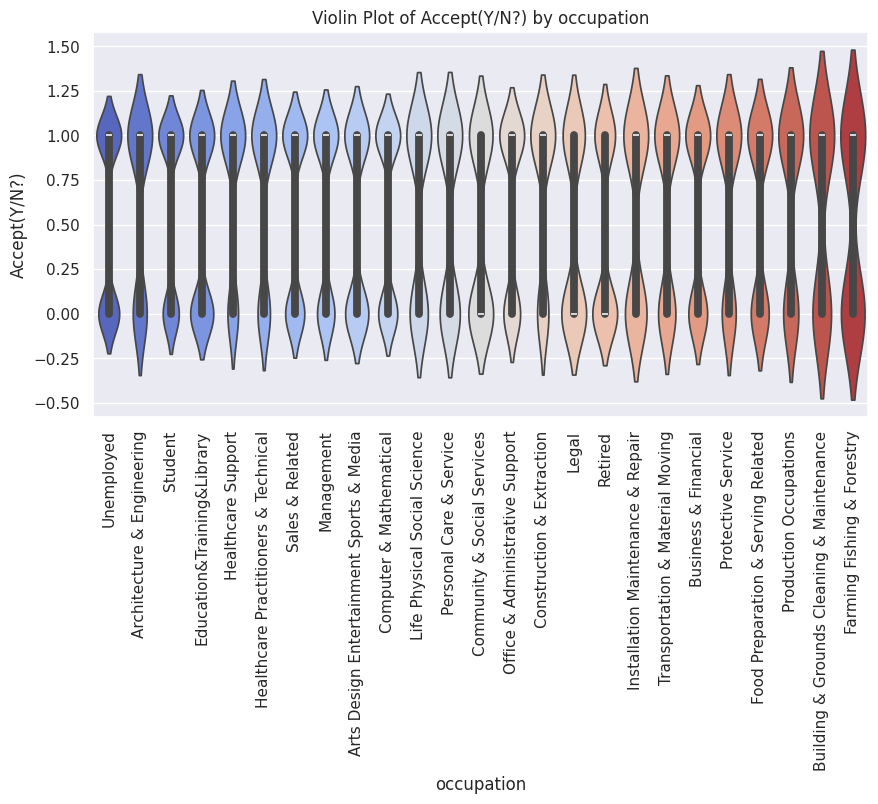


📌 **ANOVA Test:** F-Statistic = 4.9944, P-Value = 0.0000
✅ **Significant Relationship (p < 0.05)!**

🔹 **Analyzing Accept(Y/N?) vs income**

📊 **Descriptive Statistics**:
                   count      mean       std  min  25%  50%  75%  max
income                                                               
$100000 or More   1688.0  0.577014  0.494180  0.0  0.0  1.0  1.0  1.0
$12500 - $24999   1795.0  0.573259  0.494742  0.0  0.0  1.0  1.0  1.0
$25000 - $37499   1972.0  0.590771  0.491816  0.0  0.0  1.0  1.0  1.0
$37500 - $49999   1760.0  0.560795  0.496431  0.0  0.0  1.0  1.0  1.0
$50000 - $62499   1624.0  0.593596  0.491313  0.0  0.0  1.0  1.0  1.0
$62500 - $74999    832.0  0.525240  0.499663  0.0  0.0  1.0  1.0  1.0
$75000 - $87499    844.0  0.482227  0.499980  0.0  0.0  0.0  1.0  1.0
$87500 - $99999    865.0  0.527168  0.499550  0.0  0.0  1.0  1.0  1.0
Less than $12500  1013.0  0.585390  0.492898  0.0  0.0  1.0  1.0  1.0


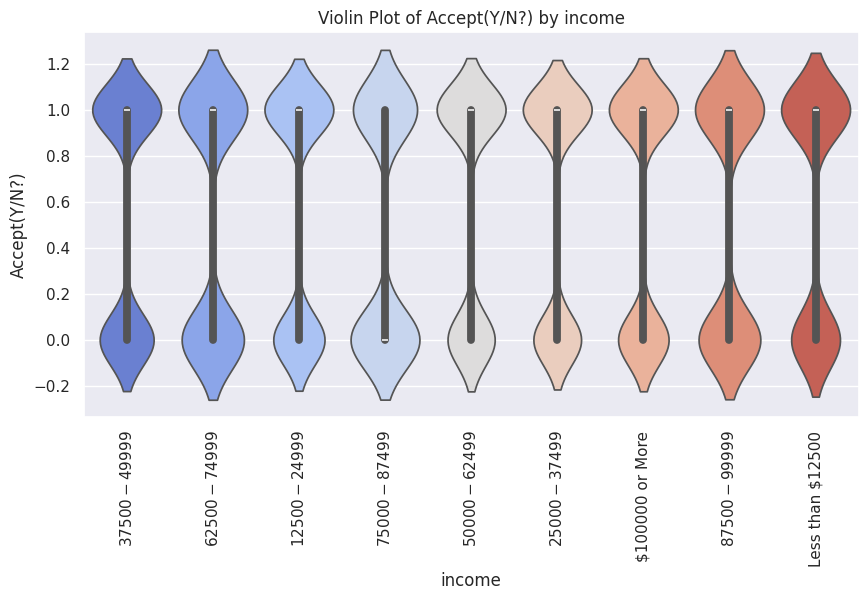


📌 **ANOVA Test:** F-Statistic = 6.0147, P-Value = 0.0000
✅ **Significant Relationship (p < 0.05)!**

🔹 **Analyzing Accept(Y/N?) vs Bar**

📊 **Descriptive Statistics**:
        count      mean       std  min  25%  50%  75%  max
Bar                                                       
1~3    2432.0  0.620066  0.485470  0.0  0.0  1.0  1.0  1.0
4~8    1045.0  0.632536  0.482345  0.0  0.0  1.0  1.0  1.0
gt8     338.0  0.579882  0.494309  0.0  0.0  1.0  1.0  1.0
less1  3383.0  0.562223  0.496187  0.0  0.0  1.0  1.0  1.0
never  5195.0  0.528393  0.499241  0.0  0.0  1.0  1.0  1.0


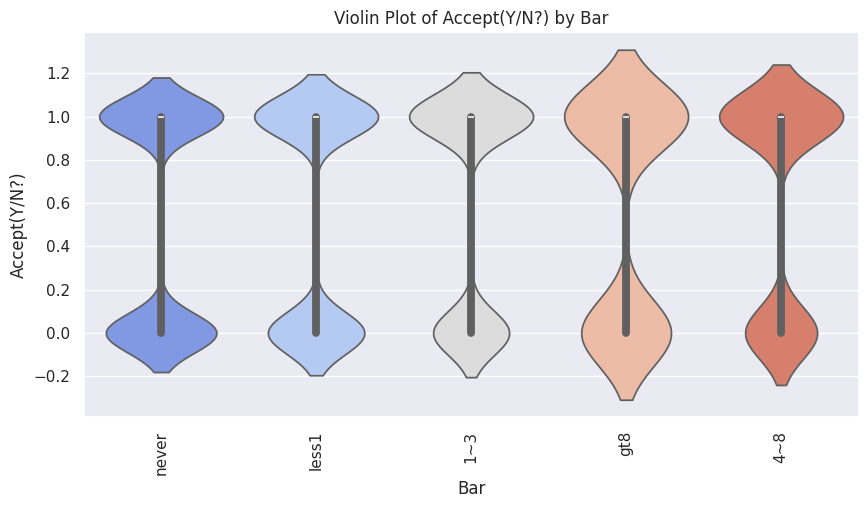


📌 **ANOVA Test:** F-Statistic = 19.6498, P-Value = 0.0000
✅ **Significant Relationship (p < 0.05)!**

🔹 **Analyzing Accept(Y/N?) vs CoffeeHouse**

📊 **Descriptive Statistics**:
              count      mean       std  min  25%  50%  75%  max
CoffeeHouse                                                     
1~3          3138.0  0.651370  0.476612  0.0  0.0  1.0  1.0  1.0
4~8          1752.0  0.631849  0.482440  0.0  0.0  1.0  1.0  1.0
gt8          1083.0  0.582641  0.493351  0.0  0.0  1.0  1.0  1.0
less1        3525.0  0.542128  0.498293  0.0  0.0  1.0  1.0  1.0
never        2895.0  0.455613  0.498112  0.0  0.0  0.0  1.0  1.0


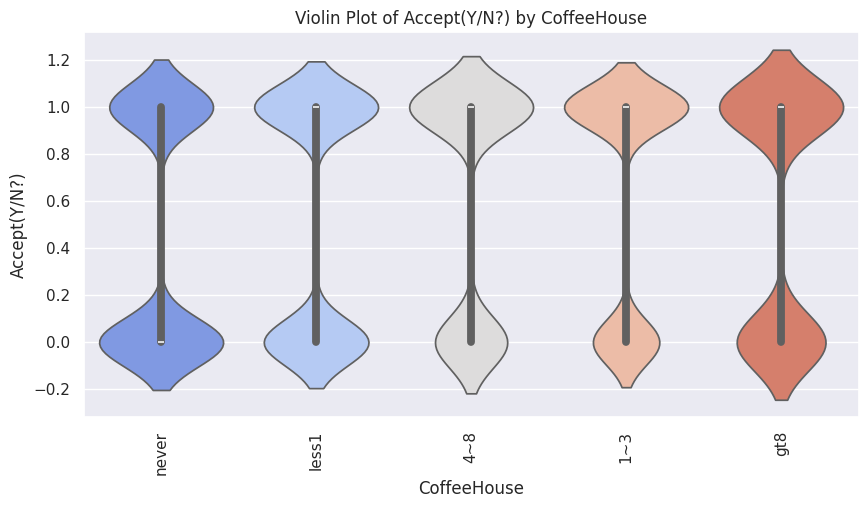


📌 **ANOVA Test:** F-Statistic = 70.8057, P-Value = 0.0000
✅ **Significant Relationship (p < 0.05)!**

🔹 **Analyzing Accept(Y/N?) vs CarryAway**

📊 **Descriptive Statistics**:
            count      mean       std  min  25%  50%  75%  max
CarryAway                                                     
1~3        4719.0  0.581267  0.493404  0.0  0.0  1.0  1.0  1.0
4~8        4171.0  0.577559  0.494007  0.0  0.0  1.0  1.0  1.0
gt8        1535.0  0.570684  0.495140  0.0  0.0  1.0  1.0  1.0
less1      1819.0  0.498076  0.500134  0.0  0.0  0.0  1.0  1.0
never       149.0  0.523490  0.501132  0.0  0.0  1.0  1.0  1.0


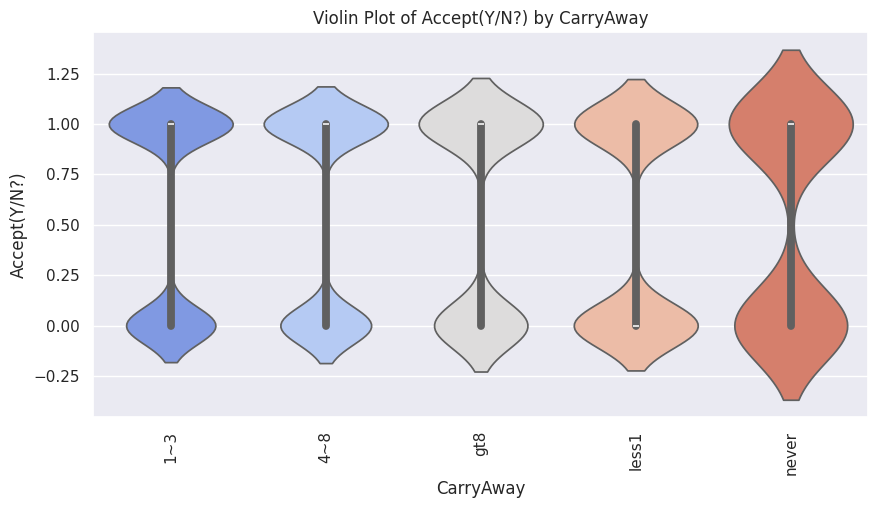


📌 **ANOVA Test:** F-Statistic = 10.5662, P-Value = 0.0000
✅ **Significant Relationship (p < 0.05)!**

🔹 **Analyzing Accept(Y/N?) vs RestaurantLessThan20**

📊 **Descriptive Statistics**:
                       count      mean       std  min  25%  50%  75%  max
RestaurantLessThan20                                                     
1~3                   5397.0  0.560311  0.496395  0.0  0.0  1.0  1.0  1.0
4~8                   3493.0  0.581735  0.493345  0.0  0.0  1.0  1.0  1.0
gt8                   1253.0  0.605746  0.488885  0.0  0.0  1.0  1.0  1.0
less1                 2034.0  0.531957  0.499100  0.0  0.0  1.0  1.0  1.0
never                  216.0  0.532407  0.500108  0.0  0.0  1.0  1.0  1.0


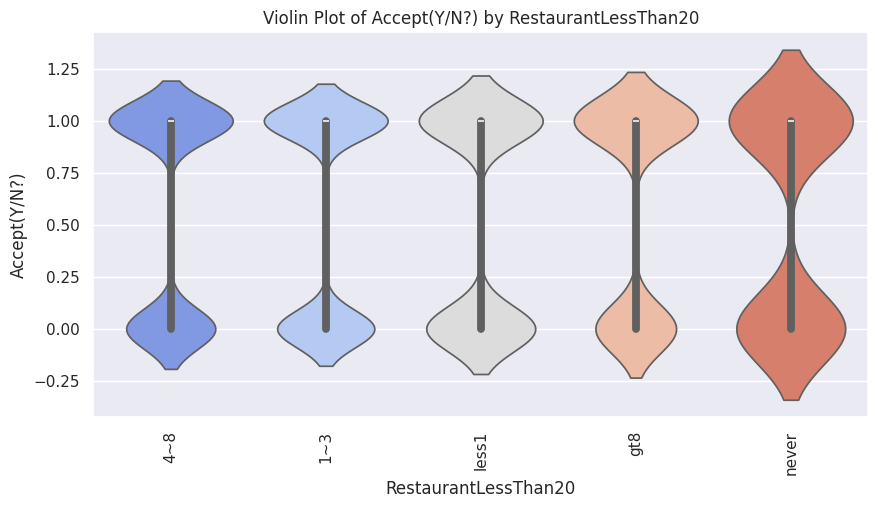


📌 **ANOVA Test:** F-Statistic = 5.7268, P-Value = 0.0001
✅ **Significant Relationship (p < 0.05)!**

🔹 **Analyzing Accept(Y/N?) vs Restaurant20To50**

📊 **Descriptive Statistics**:
                   count      mean       std  min  25%  50%  75%  max
Restaurant20To50                                                     
1~3               3204.0  0.591448  0.491643  0.0  0.0  1.0  1.0  1.0
4~8                718.0  0.654596  0.475831  0.0  0.0  1.0  1.0  1.0
gt8                254.0  0.669291  0.471397  0.0  0.0  1.0  1.0  1.0
less1             6134.0  0.555429  0.496959  0.0  0.0  1.0  1.0  1.0
never             2083.0  0.513682  0.499933  0.0  0.0  1.0  1.0  1.0


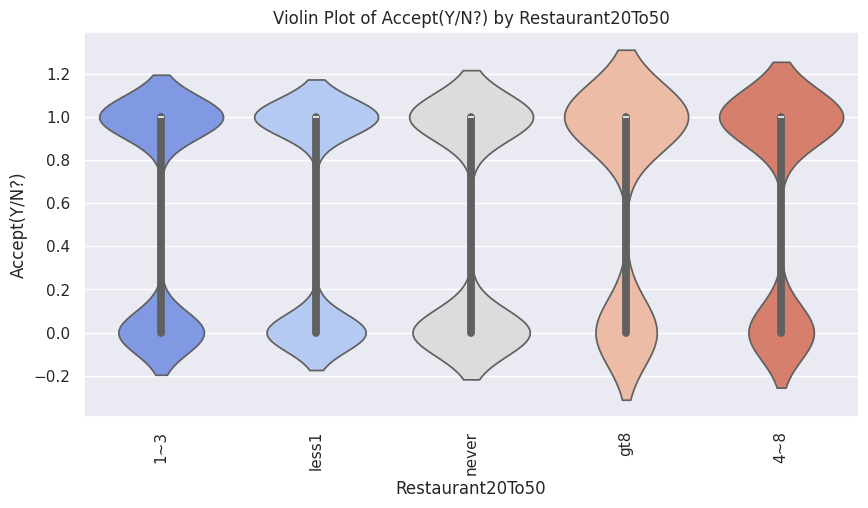


📌 **ANOVA Test:** F-Statistic = 17.1914, P-Value = 0.0000
✅ **Significant Relationship (p < 0.05)!**

📊 **Statistically Significant Relationships (p < 0.05)**
    Numerical Feature   Categorical Feature        P-Value
0         temperature           destination   7.925585e-65
1         temperature             passanger   3.357833e-46
2         temperature               weather   0.000000e+00
3         temperature                coupon  2.760943e-117
4         temperature            expiration   5.114281e-37
..                ...                   ...            ...
123      Accept(Y/N?)                   Bar   3.880670e-16
124      Accept(Y/N?)           CoffeeHouse   2.167153e-59
125      Accept(Y/N?)             CarryAway   1.519107e-08
126      Accept(Y/N?)  RestaurantLessThan20   1.333294e-04
127      Accept(Y/N?)      Restaurant20To50   4.523631e-14

[73 rows x 3 columns]


In [54]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import f_oneway

# Sample Data (Replace with your dataset)
# df = pd.read_csv("your_dataset.csv")

# Identify numerical and categorical features
numerical_features = df.select_dtypes(include=['int64', 'float64']).columns
categorical_features = df.select_dtypes(include=['object', 'category']).columns

# Store ANOVA test results
anova_results = []

# Loop through all Numerical vs Categorical variable pairs
for num_col in numerical_features:
    for cat_col in categorical_features:
        print(f"\n🔹 **Analyzing {num_col} vs {cat_col}**")

        # **1️⃣ Descriptive Statistics**
        print("\n📊 **Descriptive Statistics**:")
        print(df.groupby(cat_col)[num_col].describe())

        # **3️⃣ Violin Plot for Distribution**
        plt.figure(figsize=(10, 5))
        sns.violinplot(x=df[cat_col], y=df[num_col], palette="coolwarm")
        plt.title(f"Violin Plot of {num_col} by {cat_col}")
        plt.xticks(rotation=90)
        plt.show()

        # **4️⃣ ANOVA Test**
        try:
            valid_df = df[[num_col, cat_col]].dropna()  # Drop NaNs
            categories = valid_df[cat_col].unique()
            grouped_data = [valid_df[valid_df[cat_col] == cat][num_col] for cat in categories]

            # Ensure at least two valid groups exist
            valid_groups = [group for group in grouped_data if len(group) > 1]
            if len(valid_groups) < 2:
                raise ValueError("Not enough valid groups for ANOVA test.")

            # Perform ANOVA test
            f_stat, p_value = f_oneway(*valid_groups)

            # Store results
            anova_results.append({"Numerical Feature": num_col, "Categorical Feature": cat_col, "P-Value": p_value})

            print(f"\n📌 **ANOVA Test:** F-Statistic = {f_stat:.4f}, P-Value = {p_value:.4f}")

            # Check significance
            if p_value < 0.05:
                print("✅ **Significant Relationship (p < 0.05)!**")
            else:
                print("❌ **No significant difference.**")

        except Exception as e:
            print(f"⚠️ **ANOVA Test Failed:** {e}")
            anova_results.append({"Numerical Feature": num_col, "Categorical Feature": cat_col, "P-Value": np.nan})

# Convert ANOVA results to DataFrame
anova_results_df = pd.DataFrame(anova_results)

# Display only significant relationships
significant_anova_df = anova_results_df[anova_results_df["P-Value"] < 0.05]

# Display significant results
print("\n📊 **Statistically Significant Relationships (p < 0.05)**")
print(significant_anova_df)


## ✅ Pair Plots (Relationships Between Multiple Variables)

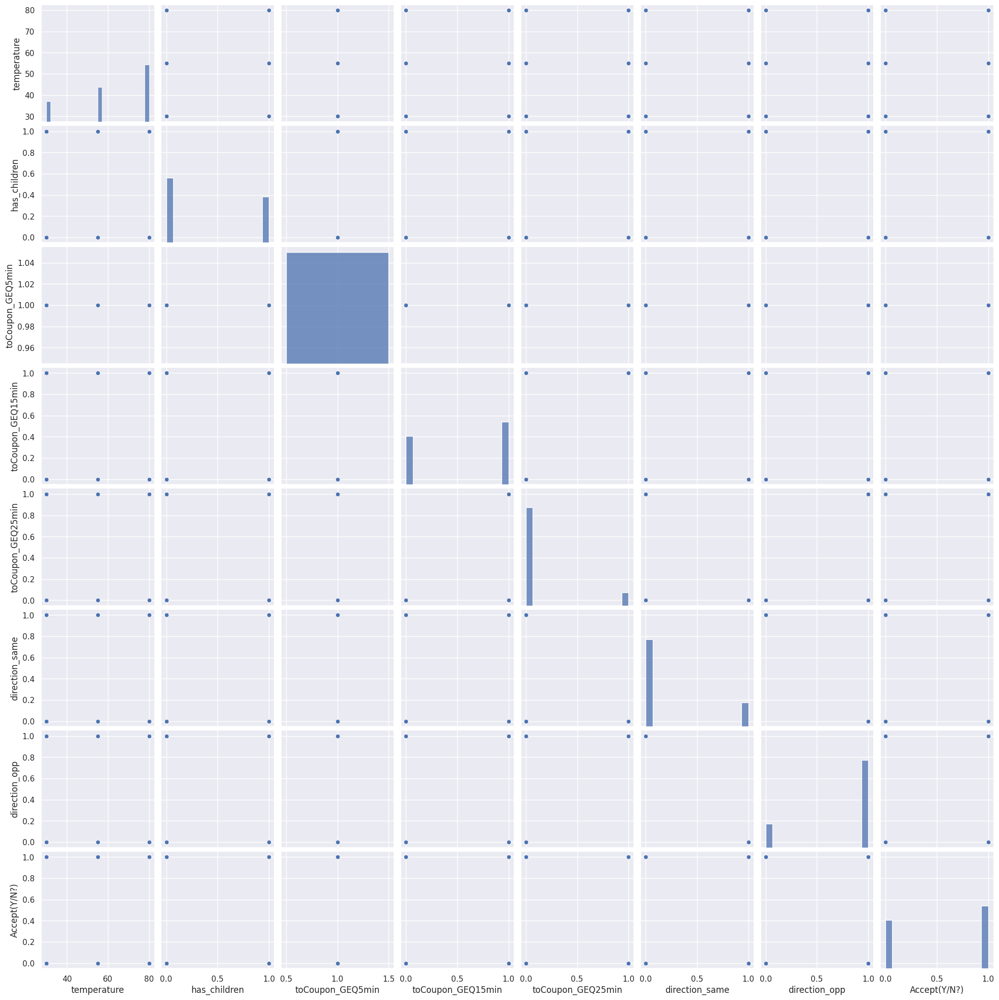

In [55]:
sns.pairplot(df)
plt.show()

## Outlier Detection

## ✅ Using Z-Score and IQR (Interquartile Range Method)


🔹 Checking Outliers for temperature 🔹


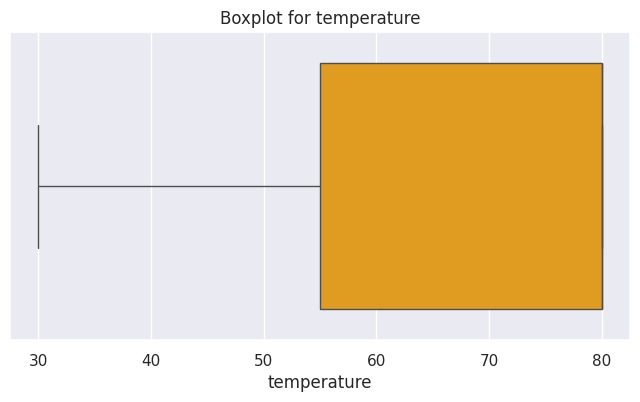


🔹 Checking Outliers for has_children 🔹


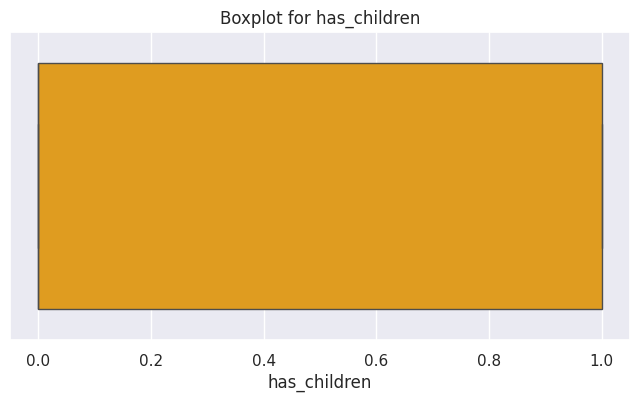


🔹 Checking Outliers for toCoupon_GEQ5min 🔹


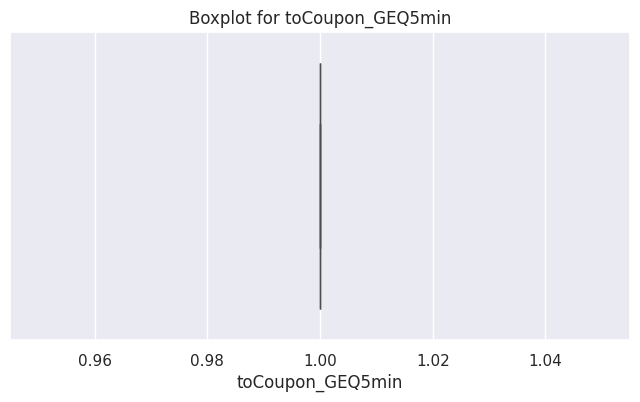


🔹 Checking Outliers for toCoupon_GEQ15min 🔹


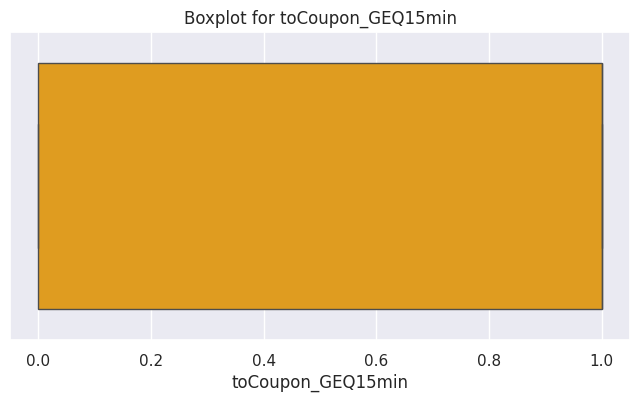


🔹 Checking Outliers for toCoupon_GEQ25min 🔹


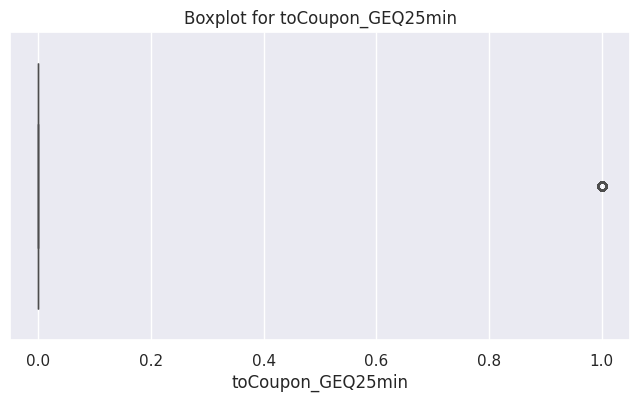


🔹 Checking Outliers for direction_same 🔹


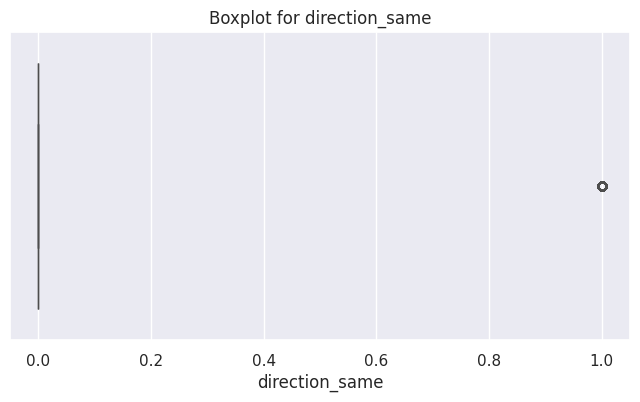


🔹 Checking Outliers for direction_opp 🔹


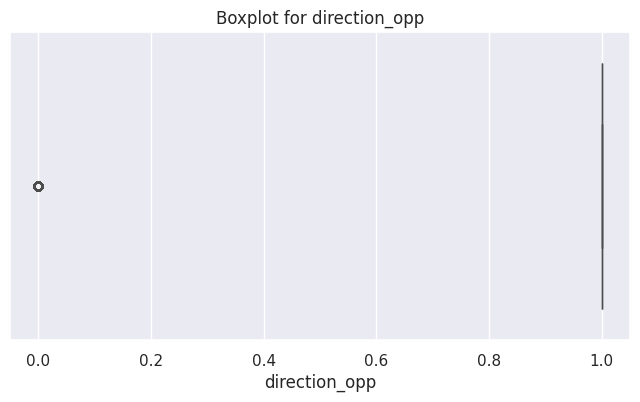


🔹 Checking Outliers for Accept(Y/N?) 🔹


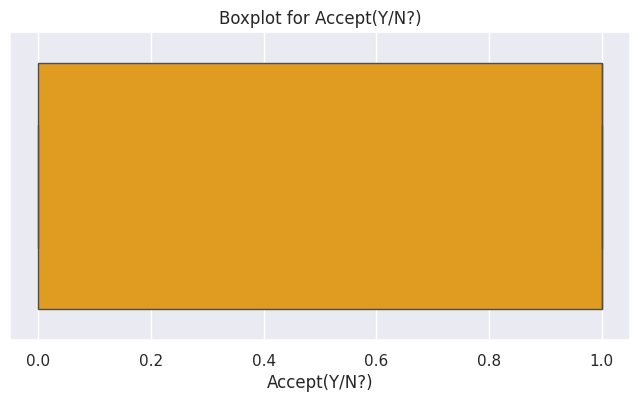


🔹 Outlier Detection Summary 🔹
             Feature  Total Outliers (IQR)  Total Outliers (Z-score)  \
0        temperature                     0                         0   
1       has_children                     0                         0   
2   toCoupon_GEQ5min                     0                         0   
3  toCoupon_GEQ15min                     0                         0   
4  toCoupon_GEQ25min                  1463                         0   
5     direction_same                  2649                         0   
6      direction_opp                  2649                         0   
7       Accept(Y/N?)                     0                         0   

   IQR Lower Bound  IQR Upper Bound  
0             17.5            117.5  
1             -1.5              2.5  
2              1.0              1.0  
3             -1.5              2.5  
4              0.0              0.0  
5              0.0              0.0  
6              1.0              1.0  
7             -1

In [56]:
# Store outlier results
outlier_summary = []

# Loop through all numerical columns
for col in numerical_features:
    print(f"\n🔹 Checking Outliers for {col} 🔹")

    # 🟢 Boxplot for Visualization
    plt.figure(figsize=(8, 4))
    sns.boxplot(x=df[col], color='orange')
    plt.title(f"Boxplot for {col}")
    plt.show()

    # 🔹 IQR Method (Interquartile Range)
    Q1 = df[col].quantile(0.25)  # 25th percentile
    Q3 = df[col].quantile(0.75)  # 75th percentile
    IQR = Q3 - Q1  # Interquartile range
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    # Detect outliers using IQR
    outliers_iqr = df[(df[col] < lower_bound) | (df[col] > upper_bound)]

    # 🔹 Z-Score Method (Standard Deviation)
    mean = df[col].mean()
    std = df[col].std()
    z_score_threshold = 3  # Threshold for Z-score (default is 3)
    outliers_zscore = df[(np.abs((df[col] - mean) / std) > z_score_threshold)]

    # 📝 Store results
    outlier_summary.append({
        "Feature": col,
        "Total Outliers (IQR)": outliers_iqr.shape[0],
        "Total Outliers (Z-score)": outliers_zscore.shape[0],
        "IQR Lower Bound": lower_bound,
        "IQR Upper Bound": upper_bound
    })

# Convert to DataFrame
outlier_df = pd.DataFrame(outlier_summary)

# 🔹 Display Outlier Summary
print("\n🔹 Outlier Detection Summary 🔹")
print(outlier_df)

# Optionally save to CSV
outlier_df.to_csv("outlier_summary.csv", index=False)

## Outlier treatment is not crucial as it represents a true variation as a part of treating it can lead to bias

# Feature Engineering

## ✅ Convert categorical variables into numerical form

In [57]:
df = pd.get_dummies(df, columns=categorical_features, drop_first=True)

# Feature Scaling & Transformation
## ✅ Standardization

In [58]:
from sklearn.preprocessing import StandardScaler

numerical_features = df.select_dtypes(include=['int64', 'float64']).columns.tolist()

# Remove the target variable from numerical features
numerical_features.remove("Accept(Y/N?)")

scaler = StandardScaler()
df[numerical_features] = scaler.fit_transform(df[numerical_features])

In [59]:
# Find correlation between each elements
# Compute correlation matrix
corr_matrix = df.corr()

# Plot heatmap
plt.figure(figsize=(100, 100))
sns.heatmap(corr_matrix, annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)
plt.title("Correlation Heatmap")
plt.show()

# Find highly correlated feature pairs (excluding self-correlations)
correlation_threshold = 0.75  # Adjust threshold as needed
positive_correlations = []
negative_correlations = []

for i in range(len(corr_matrix.columns)):
    for j in range(i + 1, len(corr_matrix.columns)):  # Avoid duplicate pairs
        correlation_value = corr_matrix.iloc[i, j]

        # Store positive correlations (r > 0.8)
        if correlation_value > correlation_threshold:
            positive_correlations.append((
                corr_matrix.index[i], corr_matrix.columns[j], correlation_value
            ))

        # Store negative correlations (r < -0.8)
        elif correlation_value < -correlation_threshold:
            negative_correlations.append((
                corr_matrix.index[i], corr_matrix.columns[j], correlation_value
            ))

# Convert to DataFrames
positive_df = pd.DataFrame(positive_correlations, columns=["Feature 1", "Feature 2", "Correlation"])
negative_df = pd.DataFrame(negative_correlations, columns=["Feature 1", "Feature 2", "Correlation"])

# Sort by correlation values
positive_df = positive_df.sort_values(by="Correlation", ascending=False)
negative_df = negative_df.sort_values(by="Correlation")

# Display results
print("\nHighly Positive Correlations (r > 0.75)")
print(positive_df)

print("\nHighly Negative Correlations (r < -0.75)")
print(negative_df)


Highly Positive Correlations (r > 0.75)
Empty DataFrame
Columns: [Feature 1, Feature 2, Correlation]
Index: []

Highly Negative Correlations (r < -0.75)
        Feature 1      Feature 2  Correlation
0  direction_same  direction_opp         -1.0


# Balancing and Splitting Data into Train & Test Sets

In [60]:
df['Accept(Y/N?)'].value_counts()

,count
Accept(Y/N?),
1,7012
0,5381


In [61]:
!pip install imblearn

In [62]:
from sklearn.model_selection import train_test_split
from imblearn.over_sampling import SMOTE
s = SMOTE()
x = df.drop("Accept(Y/N?)", axis=1)
y = df["Accept(Y/N?)"]
x , y = s.fit_resample(x,y)
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=40)

In [63]:
pd.DataFrame(y_train).value_counts()

,count
Accept(Y/N?),
0,5626
1,5593


In [65]:
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

# ML Models
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier

# Define ML models & hyperparameters
models = {
    "Logistic Regression": (LogisticRegression(), {'C': list(np.arange(1,10))}),
    "Decision Tree": (DecisionTreeClassifier(), {'criterion' : ['gini','entropy','log_loss'] , 'max_depth': list(np.arange(1,10))}),
    "Random Forest": (RandomForestClassifier(), {'n_estimators': list(np.arange(50,100)), 'max_depth': list(np.arange(1,10))}),
    "Gradient Boosting": (GradientBoostingClassifier(), {'n_estimators': list(np.arange(1,10)), 'learning_rate': [0.01, 0.1, 0.2, 0.3]}),
    "SVM": (SVC(), {'C': list(np.arange(1,10)), 'kernel': ['linear', 'rbf' , 'sigmoid' , 'poly']}),
    "KNN": (KNeighborsClassifier(), {'n_neighbors': list(np.arange(1,30))}),
}

# Store results
best_models = {}
best_scores = {}

# Train & Evaluate each model
for model_name, (model, param_grid) in models.items():
    print(f"\n🔹 Training {model_name}...")

    # Hyperparameter tuning
    grid_search = GridSearchCV(model, param_grid, cv=5, scoring='accuracy', n_jobs=-1)
    grid_search.fit(x_train, y_train)

    # Get best model and parameters
    best_model = grid_search.best_estimator_
    best_params = grid_search.best_params_

    # Print training accuracy and test accuracy for each hyperparameter setting
    for params, test_score in zip(grid_search.cv_results_['params'], grid_search.cv_results_['mean_test_score']):
        # Set the parameters and fit the model
        best_model.set_params(**params)
        best_model.fit(x_train, y_train)  # Fit model on the training data

        # Calculate training accuracy
        train_accuracy = accuracy_score(y_train, best_model.predict(x_train))  # Training accuracy

        # Print the accuracies
        print(f"Hyperparameters: {params}")
        print(f"Training Accuracy: {train_accuracy:.4f}, Test Accuracy: {test_score:.4f}, Difference: {train_accuracy - test_score:.4f}")

    # Make predictions on test data
    y_pred = best_model.predict(x_test)

    # Evaluate model
    accuracy = accuracy_score(y_test, y_pred)
    best_scores[model_name] = accuracy

    # Print final results
    print(f"Best Parameters for {model_name}: {best_params}")
    print(f"Accuracy: {accuracy:.4f}")
    print("Classification Report:\n", classification_report(y_test, y_pred))

    # Store best model
    best_models[model_name] = {
        "Model": best_model,
        "Accuracy": accuracy,
        "Best Params": best_params,
        "Confusion Matrix": confusion_matrix(y_test, y_pred)
    }

# Print Best Model
best_model_name = max(best_scores, key=best_scores.get)
print(f"\nBest Model: {best_model_name} with Accuracy: {best_scores[best_model_name]:.4f}")
print(f"Best Hyperparameters: {best_models[best_model_name]['Best Params']}")


🔹 Training Logistic Regression...
Hyperparameters: {'C': 1}
Training Accuracy: 0.6849, Test Accuracy: 0.6770, Difference: 0.0079
Hyperparameters: {'C': 2}
Training Accuracy: 0.6852, Test Accuracy: 0.6769, Difference: 0.0083
Hyperparameters: {'C': 3}
Training Accuracy: 0.6854, Test Accuracy: 0.6781, Difference: 0.0073
Hyperparameters: {'C': 4}
Training Accuracy: 0.6853, Test Accuracy: 0.6786, Difference: 0.0067
Hyperparameters: {'C': 5}
Training Accuracy: 0.6857, Test Accuracy: 0.6788, Difference: 0.0070
Hyperparameters: {'C': 6}
Training Accuracy: 0.6857, Test Accuracy: 0.6787, Difference: 0.0070
Hyperparameters: {'C': 7}
Training Accuracy: 0.6854, Test Accuracy: 0.6786, Difference: 0.0069
Hyperparameters: {'C': 8}
Training Accuracy: 0.6854, Test Accuracy: 0.6782, Difference: 0.0072
Hyperparameters: {'C': 9}
Training Accuracy: 0.6854, Test Accuracy: 0.6788, Difference: 0.0067
Best Parameters for Logistic Regression: {'C': 5}
Accuracy: 0.6856
Classification Report:
               preci

In [66]:
!pip install xgboost

In [ ]:
# Define ML models & hyperparameters
from xgboost import XGBClassifier
from sklearn.model_selection import GridSearchCV

models = {
    "XGBoost": (XGBClassifier(use_label_encoder=False, eval_metric='logloss'), {'n_estimators': list(np.arange(50, 100)), 'learning_rate': [0.01, 0.1, 0.2, 0.3]}),
}

# Store results
best_models = {}
best_scores = {}

# Train & Evaluate each model
for model_name, (model, param_grid) in models.items():
    print(f"\n🔹 Training {model_name}...")

    # Hyperparameter tuning
    grid_search = GridSearchCV(model, param_grid, cv=5, scoring='accuracy', n_jobs=-1)
    grid_search.fit(x_train.to_numpy(), y_train.to_numpy())

    # Get best model and parameters
    best_model = grid_search.best_estimator_
    best_params = grid_search.best_params_

    # Print training accuracy and test accuracy for each hyperparameter setting
    for params, test_score in zip(grid_search.cv_results_['params'], grid_search.cv_results_['mean_test_score']):
        # Set the parameters and fit the model
        best_model.set_params(**params)
        best_model.fit(x_train.to_numpy(), y_train.to_numpy())  # Fit model on the training data

        # Calculate training accuracy
        train_accuracy = accuracy_score(y_train, best_model.predict(x_train.to_numpy()))  # Training accuracy

        # Print the accuracies
        print(f"Hyperparameters: {params}")
        print(f"Training Accuracy: {train_accuracy:.4f}, Test Accuracy: {test_score:.4f}")

    # Make predictions on test data
    y_pred = best_model.predict(x_test.to_numpy())

    # Evaluate model
    accuracy = accuracy_score(y_test, y_pred)
    best_scores[model_name] = accuracy

    # Print final results
    print(f"Best Parameters for {model_name}: {best_params}")
    print(f"Accuracy: {accuracy:.4f}")
    print("Classification Report:\n", classification_report(y_test, y_pred))

    # Store best model
    best_models[model_name] = {
        "Model": best_model,
        "Accuracy": accuracy,
        "Best Params": best_params,
        "Confusion Matrix": confusion_matrix(y_test, y_pred)
    }

# 🔹 Print Best Model
best_model_name = max(best_scores, key=best_scores.get)
print(f"\n🏆 Best Model: {best_model_name} with Accuracy: {best_scores[best_model_name]:.4f}")
print(f"🚀 Best Hyperparameters: {best_models[best_model_name]['Best Params']}")


🔹 Training XGBoost...
Hyperparameters: {'learning_rate': 0.01, 'n_estimators': 50}
Training Accuracy: 0.7030, Test Accuracy: 0.6899
Hyperparameters: {'learning_rate': 0.01, 'n_estimators': 51}
Training Accuracy: 0.7026, Test Accuracy: 0.6903
Hyperparameters: {'learning_rate': 0.01, 'n_estimators': 52}
Training Accuracy: 0.7028, Test Accuracy: 0.6896
Hyperparameters: {'learning_rate': 0.01, 'n_estimators': 53}
Training Accuracy: 0.7030, Test Accuracy: 0.6904
Hyperparameters: {'learning_rate': 0.01, 'n_estimators': 54}
Training Accuracy: 0.7032, Test Accuracy: 0.6906
Hyperparameters: {'learning_rate': 0.01, 'n_estimators': 55}
Training Accuracy: 0.7033, Test Accuracy: 0.6907
Hyperparameters: {'learning_rate': 0.01, 'n_estimators': 56}
Training Accuracy: 0.7039, Test Accuracy: 0.6910
Hyperparameters: {'learning_rate': 0.01, 'n_estimators': 57}
Training Accuracy: 0.7024, Test Accuracy: 0.6912
Hyperparameters: {'learning_rate': 0.01, 'n_estimators': 58}
Training Accuracy: 0.7060, Test Accu

In [91]:
# top picked accuracy scores based on hyper parameters

#Training Logistic Regression..
#Hyperparameters: {'C': 5}
#Training Accuracy: 0.6857, Test Accuracy: 0.6788, Difference: 0.0070

# Training Decision Tree...
#Hyperparameters: {'criterion': 'entropy', 'max_depth': 9}
#Training Accuracy: 0.7436, Test Accuracy: 0.7022, Difference: 0.0414


#Training Random Forest...
#Hyperparameters: {'max_depth': 9, 'n_estimators': 98}
#Training Accuracy: 0.7773, Test Accuracy: 0.7311, Difference: 0.0463


#Training Gradient Boosting...
#Hyperparameters: {'learning_rate': 0.3, 'n_estimators': 9}
#Training Accuracy: 0.6944, Test Accuracy: 0.6917, Difference: 0.0028

#Training SVM...
#Hyperparameters: {'C': 1, 'kernel': 'rbf'}
#Training Accuracy: 0.8170, Test Accuracy: 0.7426, Difference: 0.0744

#Training KNN...
#Hyperparameters: {'n_neighbors': 27}
#Training Accuracy: 0.7339, Test Accuracy: 0.6813, Difference: 0.0527

#Training XGBoost...
#Hyperparameters: {'learning_rate': 0.1, 'n_estimators': 95}
#Training Accuracy: 0.8162, Test Accuracy: 0.7600

In [99]:
from sklearn.ensemble import AdaBoostClassifier, GradientBoostingClassifier
# Logistic Regression
log = LogisticRegression(C = 5)
log.fit(x_train,y_train)
y_pred_test_log = log.predict(x_test)
y_pred_train_log = log.predict(x_train)
accur_log_test = accuracy_score(y_test , y_pred_test_log)
accur_log_train = accuracy_score(y_train , y_pred_train_log)


# Decision Tree
dec = DecisionTreeClassifier(criterion = 'entropy', max_depth = 9)
dec.fit(x_train,y_train)
y_pred_test_dec = dec.predict(x_test)
y_pred_train_dec = dec.predict(x_train)
accur_dec_test = accuracy_score(y_test , y_pred_test_dec)
accur_dec_train = accuracy_score(y_train , y_pred_train_dec)

# Random Forest
ran = RandomForestClassifier(max_depth = 9, n_estimators = 98)
ran.fit(x_train,y_train)
y_pred_test_ran = ran.predict(x_test)
y_pred_train_ran = ran.predict(x_train)
accur_ran_test = accuracy_score(y_test , y_pred_test_ran)
accur_ran_train = accuracy_score(y_train , y_pred_train_ran)

# Ada Boost
ada_boost = AdaBoostClassifier()
ada_boost.fit(x_train,y_train)
y_pred_test_ada = ada_boost.predict(x_test)
y_pred_train_ada = ada_boost.predict(x_train)
accur_ada_test = accuracy_score(y_test , y_pred_test_ada)
accur_ada_train = accuracy_score(y_train , y_pred_train_ada)

# gradient boosting classifier
grad_boost = GradientBoostingClassifier(learning_rate = 0.3, n_estimators = 9)
grad_boost.fit(x_train , y_train)
y_pred_test_grad = grad_boost.predict(x_test)
y_pred_train_grad = grad_boost.predict(x_train)
accur_grad_test = accuracy_score(y_test , y_pred_test_grad)
accur_grad_train = accuracy_score(y_train , y_pred_train_grad)

#XGBoost classifier
xgb = XGBClassifier(learning_rate = 0.1, n_estimators = 95)
xgb.fit(x_train.to_numpy() , y_train.to_numpy())
y_pred_test_xgb = xgb.predict(x_test)
y_pred_train_xgb = xgb.predict(x_train)
accur_xgb_test = accuracy_score(y_test , y_pred_test_xgb)
accur_xgb_train = accuracy_score(y_train , y_pred_train_xgb)

# SVM
svm_rbf = SVC(C = 1, kernel = 'rbf')
rbf = svm_rbf.fit(x_train, y_train)
y_pred_test_rbf = svm_rbf.predict(x_test)
y_pred_train_rbf = svm_rbf.predict(x_train)
accur_rbf_test = accuracy_score(y_test, y_pred_test_rbf)
accur_rbf_train = accuracy_score(y_train , y_pred_train_rbf)

# knn
knn = KNeighborsClassifier(n_neighbors= 27)
knn.fit(x_train , y_train)
y_pred_test_knn = knn.predict(x_test)
y_pred_train_knn = knn.predict(x_train)
accur_knn_test = accuracy_score(y_test , y_pred_test_knn)
accur_knn_train = accuracy_score(y_train , y_pred_train_knn)

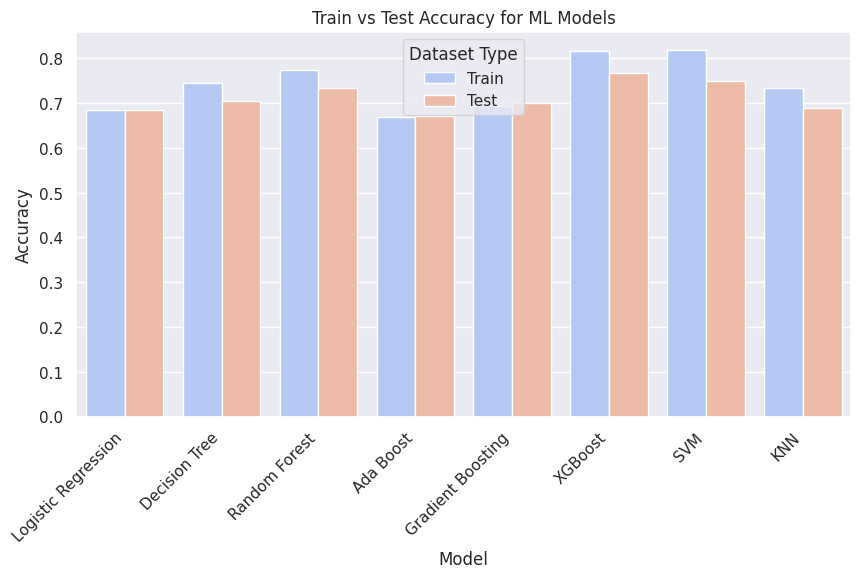

In [102]:
# Define model names and their accuracies
list1 = ['Logistic Regression', 'Decision Tree', 'Random Forest', 'Ada Boost', 'Gradient Boosting', 'XGBoost', 'SVM', 'KNN']
list2 = [accur_log_train, accur_dec_train, accur_ran_train, accur_ada_train, accur_grad_train, accur_xgb_train, accur_rbf_train, accur_knn_train]
list3 = [accur_log_test, accur_dec_test, accur_ran_test, accur_ada_test, accur_grad_test, accur_xgb_test, accur_rbf_test, accur_knn_test]

# Create DataFrame in long format for Seaborn
final_accuracy = pd.DataFrame({
    'Method': list1 * 2,  # Repeat method names for train & test
    'Accuracy': list2 + list3,  # Concatenate train & test accuracy
    'Type': ['Train'] * len(list1) + ['Test'] * len(list1)  # Labels for train/test
})

# Plot using seaborn
plt.figure(figsize=(10, 5))
chart = sns.barplot(x='Method', y='Accuracy', hue='Type', data=final_accuracy, palette="coolwarm")
chart.set_xticklabels(chart.get_xticklabels(), rotation=45, ha='right')

# Show plot
plt.title("Train vs Test Accuracy for ML Models")
plt.xlabel("Model")
plt.ylabel("Accuracy")
plt.legend(title="Dataset Type")
plt.show()


🔹 Model: Logistic Regression
📌 Classification Report:
              precision    recall  f1-score   support

           0       0.68      0.68      0.68      1386
           1       0.69      0.68      0.69      1419

    accuracy                           0.68      2805
   macro avg       0.68      0.68      0.68      2805
weighted avg       0.68      0.68      0.68      2805

📌 Confusion Matrix:
[[949 437]
 [450 969]]


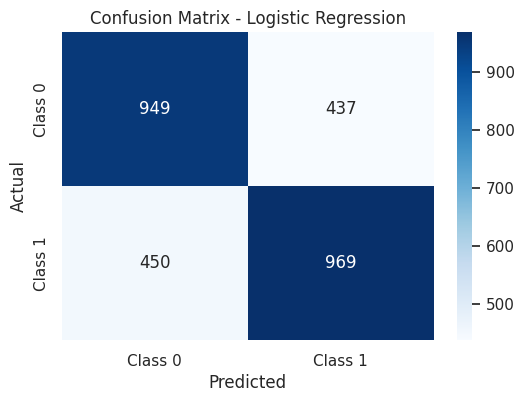


🔹 Model: Decision Tree
📌 Classification Report:
              precision    recall  f1-score   support

           0       0.72      0.66      0.69      1386
           1       0.69      0.75      0.72      1419

    accuracy                           0.71      2805
   macro avg       0.71      0.70      0.70      2805
weighted avg       0.71      0.71      0.70      2805

📌 Confusion Matrix:
[[ 909  477]
 [ 350 1069]]


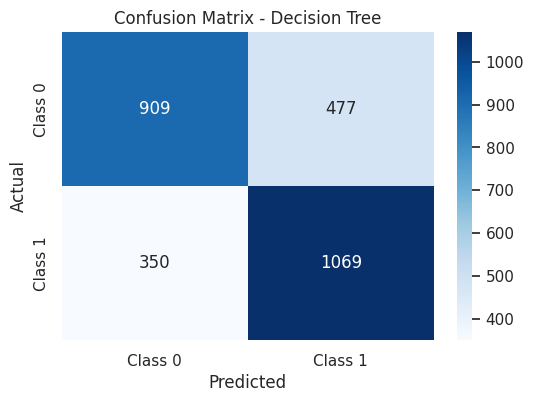


🔹 Model: Random Forest
📌 Classification Report:
              precision    recall  f1-score   support

           0       0.73      0.73      0.73      1386
           1       0.74      0.74      0.74      1419

    accuracy                           0.73      2805
   macro avg       0.73      0.73      0.73      2805
weighted avg       0.73      0.73      0.73      2805

📌 Confusion Matrix:
[[1012  374]
 [ 374 1045]]


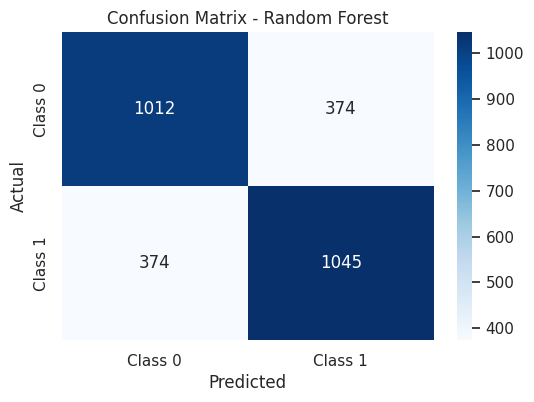


🔹 Model: Ada Boost
📌 Classification Report:
              precision    recall  f1-score   support

           0       0.66      0.69      0.67      1386
           1       0.68      0.65      0.67      1419

    accuracy                           0.67      2805
   macro avg       0.67      0.67      0.67      2805
weighted avg       0.67      0.67      0.67      2805

📌 Confusion Matrix:
[[953 433]
 [490 929]]


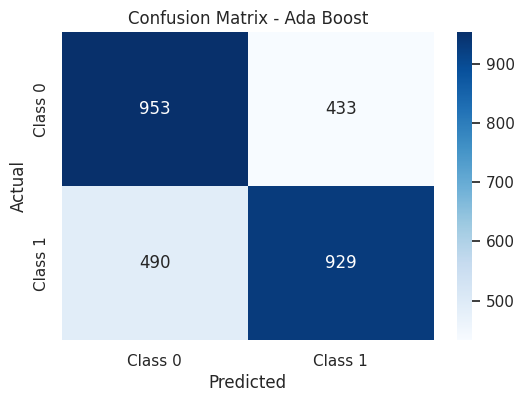


🔹 Model: Gradient Boosting
📌 Classification Report:
              precision    recall  f1-score   support

           0       0.70      0.68      0.69      1386
           1       0.70      0.72      0.71      1419

    accuracy                           0.70      2805
   macro avg       0.70      0.70      0.70      2805
weighted avg       0.70      0.70      0.70      2805

📌 Confusion Matrix:
[[ 947  439]
 [ 404 1015]]


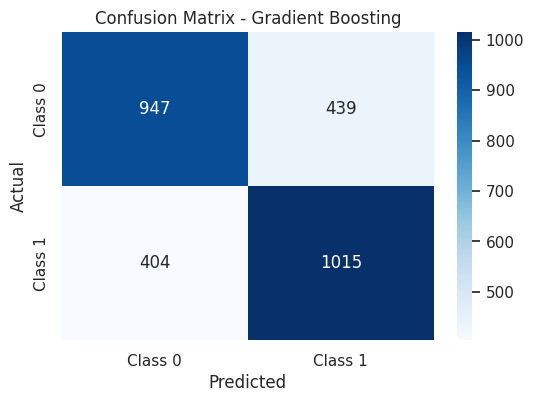


🔹 Model: XGBoost
📌 Classification Report:
              precision    recall  f1-score   support

           0       0.77      0.76      0.76      1386
           1       0.77      0.77      0.77      1419

    accuracy                           0.77      2805
   macro avg       0.77      0.77      0.77      2805
weighted avg       0.77      0.77      0.77      2805

📌 Confusion Matrix:
[[1055  331]
 [ 323 1096]]


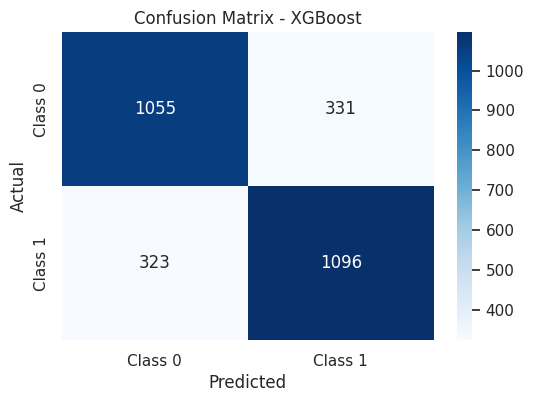


🔹 Model: SVM
📌 Classification Report:
              precision    recall  f1-score   support

           0       0.74      0.77      0.75      1386
           1       0.76      0.74      0.75      1419

    accuracy                           0.75      2805
   macro avg       0.75      0.75      0.75      2805
weighted avg       0.75      0.75      0.75      2805

📌 Confusion Matrix:
[[1061  325]
 [ 375 1044]]


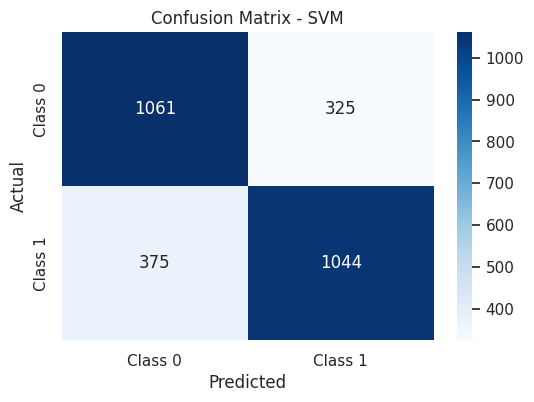


🔹 Model: KNN
📌 Classification Report:
              precision    recall  f1-score   support

           0       0.69      0.67      0.68      1386
           1       0.69      0.70      0.70      1419

    accuracy                           0.69      2805
   macro avg       0.69      0.69      0.69      2805
weighted avg       0.69      0.69      0.69      2805

📌 Confusion Matrix:
[[935 451]
 [421 998]]


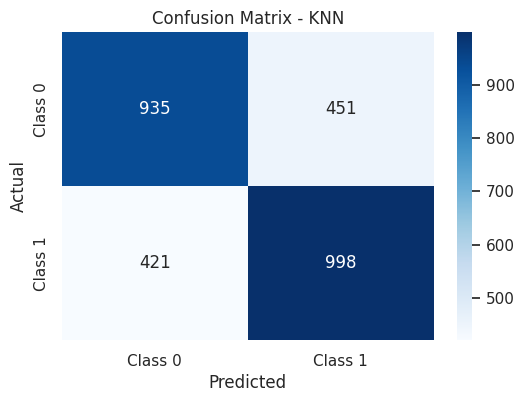

In [105]:
# 🔹 Print Classification Reports & Confusion Matrices
# ==============================

# Dictionary of models & predictions
models = {
    "Logistic Regression": log,
    "Decision Tree": dec,
    "Random Forest": ran,
    "Ada Boost": ada_boost,
    "Gradient Boosting": grad_boost,
    "XGBoost": xgb,
    "SVM": svm_rbf,
    "KNN": knn
}

for name, model in models.items():
    print(f"\n🔹 Model: {name}")

    # Predictions
    y_pred = model.predict(x_test)

    # Classification Report
    print("📌 Classification Report:")
    print(classification_report(y_test, y_pred))

    # Confusion Matrix
    conf_matrix = confusion_matrix(y_test, y_pred)
    print("📌 Confusion Matrix:")
    print(conf_matrix)

    # Plot Confusion Matrix
    plt.figure(figsize=(6, 4))
    sns.heatmap(conf_matrix, annot=True, fmt='d', cmap="Blues", xticklabels=['Class 0', 'Class 1'], yticklabels=['Class 0', 'Class 1'])
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.title(f"Confusion Matrix - {name}")
    plt.show()



🏆 Best Model Based on Test Accuracy:
🔹 Model: XGBoost
🔹 Test Accuracy: 0.7668

📌 Most Stable Model (Minimal Overfitting):
🔹 Model: Ada Boost
🔹 Accuracy Difference (Train-Test): 0.0008


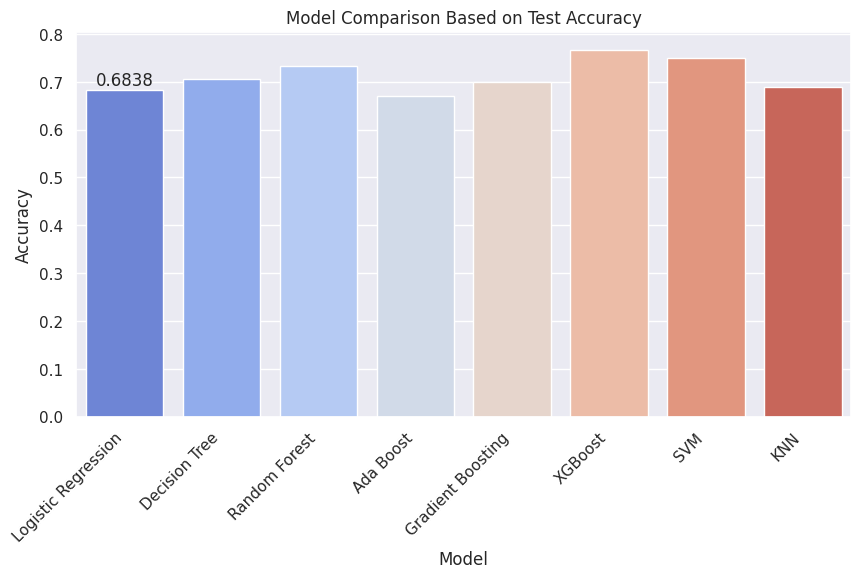

In [106]:

# Create DataFrame
accuracy_df = pd.DataFrame({
    'Model': list1,
    'Train Accuracy': list2,
    'Test Accuracy': list3,
    'Difference': np.abs(np.array(list2) - np.array(list3))  # Absolute difference to measure overfitting
})

# Find best model based on test accuracy
best_model_index = np.argmax(accuracy_df['Test Accuracy'])
best_model_name = accuracy_df.loc[best_model_index, 'Model']
best_test_accuracy = accuracy_df.loc[best_model_index, 'Test Accuracy']

# Find model with the smallest difference (least overfitting)
best_stable_model_index = np.argmin(accuracy_df['Difference'])
best_stable_model_name = accuracy_df.loc[best_stable_model_index, 'Model']
best_stability_score = accuracy_df.loc[best_stable_model_index, 'Difference']

# Print results
print("\n🏆 Best Model Based on Test Accuracy:")
print(f"🔹 Model: {best_model_name}")
print(f"🔹 Test Accuracy: {best_test_accuracy:.4f}")

print("\n📌 Most Stable Model (Minimal Overfitting):")
print(f"🔹 Model: {best_stable_model_name}")
print(f"🔹 Accuracy Difference (Train-Test): {best_stability_score:.4f}")

# ==============================
# 🔹 Accuracy Bar Plot
# ==============================

plt.figure(figsize=(10, 5))
chart = sns.barplot(x='Model', y='Test Accuracy', data=accuracy_df, palette="coolwarm")
chart.set_xticklabels(chart.get_xticklabels(), rotation=45, ha='right')

# Highlight best model
chart.bar_label(chart.containers[0], fmt="%.4f", label_type="edge")

# Show plot
plt.title("Model Comparison Based on Test Accuracy")
plt.xlabel("Model")
plt.ylabel("Accuracy")
plt.show()


Model Performance Comparison (Training vs Testing Accuracy):
                 Model  Train Accuracy  Test Accuracy
0  Logistic Regression        0.685177       0.683779
1        Decision Tree        0.745254       0.705169
2        Random Forest        0.775114       0.733333
3            Ada Boost        0.670113       0.670945
4    Gradient Boosting        0.693021       0.699465
5              XGBoost        0.816739       0.766845
6                  SVM        0.819146       0.750446
7                  KNN        0.734557       0.689127

🏆 Best Model Based on Test Accuracy: XGBoost
Test Accuracy: 0.7668
Train Accuracy: 0.8167


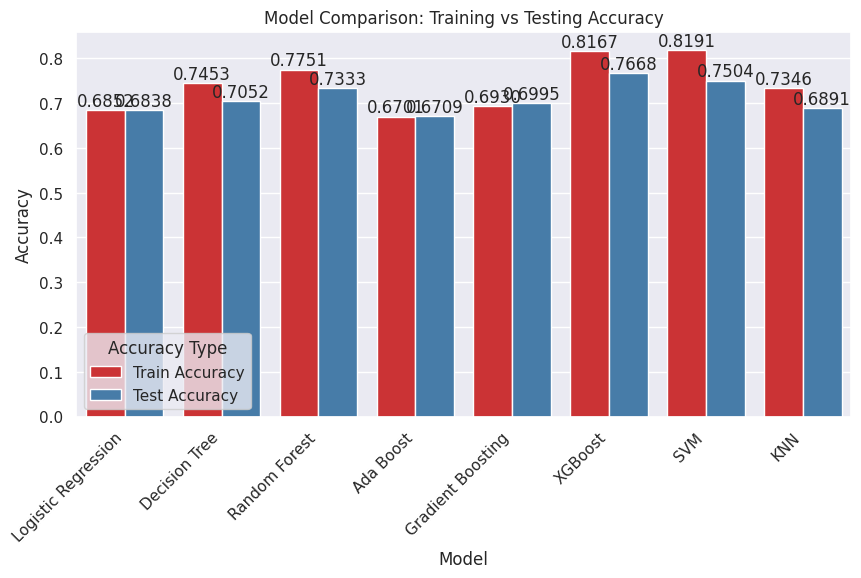

In [107]:
# Create DataFrame with model names and accuracies
accuracy_df = pd.DataFrame({
    'Model': list1,
    'Train Accuracy': list2,
    'Test Accuracy': list3
})

# ==============================
# 🔹 Print All Accuracy for Models
# ==============================
print("\nModel Performance Comparison (Training vs Testing Accuracy):")
print(accuracy_df)

# ==============================
# 🔹 Find the Best Model
# ==============================
# Get the model with the best test accuracy
best_model_index = np.argmax(accuracy_df['Test Accuracy'])
best_model_name = accuracy_df.loc[best_model_index, 'Model']
best_test_accuracy = accuracy_df.loc[best_model_index, 'Test Accuracy']
best_train_accuracy = accuracy_df.loc[best_model_index, 'Train Accuracy']

# Print the best model based on test accuracy
print(f"\n🏆 Best Model Based on Test Accuracy: {best_model_name}")
print(f"Test Accuracy: {best_test_accuracy:.4f}")
print(f"Train Accuracy: {best_train_accuracy:.4f}")

# ==============================
# 🔹 Accuracy Comparison Visual
# ==============================
plt.figure(figsize=(10, 5))

# Plotting both Train and Test accuracies
accuracy_df_melted = accuracy_df.melt(id_vars=['Model'], value_vars=['Train Accuracy', 'Test Accuracy'],
                                      var_name='Accuracy Type', value_name='Accuracy')

# Seaborn barplot for comparison
chart = sns.barplot(x='Model', y='Accuracy', hue='Accuracy Type', data=accuracy_df_melted, palette="Set1")

# Adding labels to bars
chart.set_xticklabels(chart.get_xticklabels(), rotation=45, ha='right')
chart.bar_label(chart.containers[0], fmt="%.4f", label_type="edge")
chart.bar_label(chart.containers[1], fmt="%.4f", label_type="edge")

# Titles and Labels
plt.title("Model Comparison: Training vs Testing Accuracy")
plt.xlabel("Model")
plt.ylabel("Accuracy")
plt.show()